# Credit Card Users Churn Prediction

## Problem Statement

### Business Context

The Thera bank recently saw a steep decline in the number of users of their credit card, credit cards are a good source of income for banks because of different kinds of fees charged by the banks like annual fees, balance transfer fees, and cash advance fees, late payment fees, foreign transaction fees, and others. Some fees are charged to every user irrespective of usage, while others are charged under specified circumstances.

Customers’ leaving credit cards services would lead bank to loss, so the bank wants to analyze the data of customers and identify the customers who will leave their credit card services and reason for same – so that bank could improve upon those areas

You as a Data scientist at Thera bank need to come up with a classification model that will help the bank improve its services so that customers do not renounce their credit cards

### Data Description

* CLIENTNUM: Client number. Unique identifier for the customer holding the account
* Attrition_Flag: Internal event (customer activity) variable - if the account is closed then "Attrited Customer" else "Existing Customer"
* Customer_Age: Age in Years
* Gender: Gender of the account holder
* Dependent_count: Number of dependents
* Education_Level: Educational Qualification of the account holder - Graduate, High School, Unknown, Uneducated, College(refers to college student), Post-Graduate, Doctorate
* Marital_Status: Marital Status of the account holder
* Income_Category: Annual Income Category of the account holder
* Card_Category: Type of Card
* Months_on_book: Period of relationship with the bank (in months)
* Total_Relationship_Count: Total no. of products held by the customer
* Months_Inactive_12_mon: No. of months inactive in the last 12 months
* Contacts_Count_12_mon: No. of Contacts in the last 12 months
* Credit_Limit: Credit Limit on the Credit Card
* Total_Revolving_Bal: Total Revolving Balance on the Credit Card
* Avg_Open_To_Buy: Open to Buy Credit Line (Average of last 12 months)
* Total_Amt_Chng_Q4_Q1: Change in Transaction Amount (Q4 over Q1)
* Total_Trans_Amt: Total Transaction Amount (Last 12 months)
* Total_Trans_Ct: Total Transaction Count (Last 12 months)
* Total_Ct_Chng_Q4_Q1: Change in Transaction Count (Q4 over Q1)
* Avg_Utilization_Ratio: Average Card Utilization Ratio

#### What Is a Revolving Balance?

- If we don't pay the balance of the revolving credit account in full every month, the unpaid portion carries over to the next month. That's called a revolving balance


##### What is the Average Open to buy?

- 'Open to Buy' means the amount left on your credit card to use. Now, this column represents the average of this value for the last 12 months.

##### What is the Average utilization Ratio?

- The Avg_Utilization_Ratio represents how much of the available credit the customer spent. This is useful for calculating credit scores.


##### Relation b/w Avg_Open_To_Buy, Credit_Limit and Avg_Utilization_Ratio:

- ( Avg_Open_To_Buy / Credit_Limit ) + Avg_Utilization_Ratio = 1

## Importing necessary libraries

In [ ]:
# Data manipulation and analysis
import pandas as pd  # DataFrame operations
import numpy as np  # Numerical operations and array handling
from scipy import stats  # Statistical functions and tests
import joblib  # Model persistence (save and load)

# Data visualization
import matplotlib.pyplot as plt  # Plotting library
import seaborn as sns  # Statistical data visualization

# Data preprocessing
from sklearn.preprocessing import StandardScaler, PolynomialFeatures, LabelEncoder  # Scaling, feature engineering, label encoding
from sklearn.impute import SimpleImputer  # Handling missing data

# Data resampling for imbalance
from imblearn.under_sampling import RandomUnderSampler  # Undersampling
from imblearn.over_sampling import SMOTE  # Oversampling

# Data splitting
from sklearn.model_selection import train_test_split  # Train-test split

# Machine learning models
from sklearn.tree import DecisionTreeClassifier  # Decision trees
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, BaggingClassifier, AdaBoostClassifier  # Ensemble models
from xgboost import XGBClassifier  # XGBoost classifier
from sklearn.linear_model import LogisticRegression  # Logistic regression
from sklearn.svm import SVC  # Support Vector Classifier

# Model tuning and cross-validation
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, cross_val_score  # Hyperparameter tuning and CV

# Model evaluation metrics
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, confusion_matrix, ConfusionMatrixDisplay, make_scorer  # Model performance metrics and confusion matrix

# Suppress warnings
import warnings
warnings.filterwarnings("ignore")  # Ignore warnings

# Verify all necessary libraries are imported
print("All necessary libraries have been imported successfully.")


All necessary libraries have been imported successfully.


In [ ]:
# Installing the libraries with the specified version.
# uncomment and run the following lines if Jupyter Notebook is being used
# !pip install scikit-learn==1.2.2 seaborn==0.13.1 matplotlib==3.7.1 numpy==1.25.2 pandas==1.5.3 imblearn==0.12.0 xgboost==2.0.3 -q --user
# !pip install --upgrade -q threadpoolctl

**Note**: *After running the above cell, kindly restart the notebook kernel and run all cells sequentially from the start again*.

In [ ]:
# #import Google drive library and mount it
# from google.colab import drive
# drive.mount('/content/drive')

# #path to the data
# path="/content/drive/My Drive/AIMLTRAINING/collabdata/BankChurners.csv"
path = r"C:\Users\amasr\Desktop\GreatLearning-ML notes and downloads\BankChurners.csv"


## Loading the dataset

In [ ]:
#load the data
df_original=pd.read_csv(path)

#read sample of the data
df_original.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40,F,4,High School,NaN,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


## Data Overview

- Observations
- Sanity checks

In [ ]:
#make copy of the original data for processing
df=df_original.copy()

In [ ]:
# sanity checks
def data_sanity(df):
    print("\nData Information:\n")
    display(df.info())
    print("\n========================\n")
    print("Descriptive Statistics:\n")
    display(df.describe())
    print("\n========================\n")
    print("Null Values Check:\n")
    display(df.isnull().sum())
    print("\n========================\n")
    print("Data Types:\n")
    display(df.dtypes)
    print("\n========================\n")
    print("Duplicate Records Check:\n")
    display(df.duplicated().sum())
data_sanity(df)


Data Information:

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10127 non-null  int64  
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           8608 non-null   object 
 6   Marital_Status            9378 non-null   object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null 

None



Descriptive Statistics:



,CLIENTNUM,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
count,1.012700e+04,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
mean,7.391776e+08,46.325960,2.346203,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894
std,3.690378e+07,8.016814,1.298908,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691
min,7.080821e+08,26.000000,0.000000,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000
25%,7.130368e+08,41.000000,1.000000,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000
50%,7.179264e+08,46.000000,2.000000,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000
75%,7.731435e+08,52.000000,3.000000,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000
max,8.283431e+08,73.000000,5.000000,56.000000,6.000000,6.000000,6.000000,34516.000000,2517.000000,34516.000000,3.397000,18484.000000,139.000000,3.714000,0.999000




Null Values Check:



CLIENTNUM                      0
Attrition_Flag                 0
Customer_Age                   0
Gender                         0
Dependent_count                0
Education_Level             1519
Marital_Status               749
Income_Category                0
Card_Category                  0
Months_on_book                 0
Total_Relationship_Count       0
Months_Inactive_12_mon         0
Contacts_Count_12_mon          0
Credit_Limit                   0
Total_Revolving_Bal            0
Avg_Open_To_Buy                0
Total_Amt_Chng_Q4_Q1           0
Total_Trans_Amt                0
Total_Trans_Ct                 0
Total_Ct_Chng_Q4_Q1            0
Avg_Utilization_Ratio          0
dtype: int64



Data Types:



CLIENTNUM                     int64
Attrition_Flag               object
Customer_Age                  int64
Gender                       object
Dependent_count               int64
Education_Level              object
Marital_Status               object
Income_Category              object
Card_Category                object
Months_on_book                int64
Total_Relationship_Count      int64
Months_Inactive_12_mon        int64
Contacts_Count_12_mon         int64
Credit_Limit                float64
Total_Revolving_Bal           int64
Avg_Open_To_Buy             float64
Total_Amt_Chng_Q4_Q1        float64
Total_Trans_Amt               int64
Total_Trans_Ct                int64
Total_Ct_Chng_Q4_Q1         float64
Avg_Utilization_Ratio       float64
dtype: object



Duplicate Records Check:



0

**Sanity checks and Observations**

- **Dataset Size**: The dataset has 10,127 entries and 21 columns. This
is a reasonable size for modeling.
- **Missing Values**:
 - The *Education_Level* column has 1,519 missing values.
 - The *Marital_Status* column has 749 missing values.

 These need imputation or other handling methods.

- **Data Types**: The dataset includes int64, float64, and object types. Type conversion may be needed for modeling.

- **Descriptive Statistics**:
 - Average customer age is about 46 years.
 - Average Credit_Limit is around \$8,632.
 - Average Total_Revolving_Bal is \$1,163.
 - Average utilization ratio is 27.49%, showing customers use a small portion of their available credit.

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. How is the total transaction amount distributed?
2. What is the distribution of the level of education of customers?
3. What is the distribution of the level of income of customers?
4. How does the change in transaction amount between Q4 and Q1 (`total_ct_change_Q4_Q1`) vary by the customer's account status (`Attrition_Flag`)?
5. How does the number of months a customer was inactive in the last 12 months (`Months_Inactive_12_mon`) vary by the customer's account status (`Attrition_Flag`)?
6. What are the attributes that have a strong correlation with each other?



# Univariate Analysis

In [ ]:
# Set the style for the plots
sns.set(style="whitegrid")

# Function to analyze categorical variables
def analyze_categorical(df, var):
    # Print the counts and sort in descending order
    counts = df[var].value_counts().sort_values(ascending=False)
    # print(counts)

    # Plot
    plt.figure(figsize=(10, 6))
    ax = sns.countplot(x=var, data=df, palette='pastel', order=counts.index)
    plt.title(f'Distribution of {var}', fontsize=16)
    plt.xticks(rotation=45, fontsize=12)
    plt.ylabel('Count', fontsize=12)

    # Add count on top of the bars as integers
    for p in ax.patches:
        count = int(p.get_height())
        ax.annotate(f'{count}',
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=12, color='black')

    plt.show()

# Function to analyze numerical variables
def analyze_numerical(df, var):
    # Detect outliers using IQR
    Q1 = df[var].quantile(0.25)
    Q3 = df[var].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[var] < lower_bound) | (df[var] > upper_bound)]

    # Boxplot
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[var], color='lightblue')
    plt.title(f'Boxplot of {var}', fontsize=16)
    plt.xlabel(var, fontsize=12)

    # Add total count annotation
    total_count = len(df[var])
    plt.annotate(f'Total Count: {total_count}',
                 xy=(0.8 * plt.xlim()[1], 0.9 * plt.ylim()[1]),
                 fontsize=12, color='black', weight='bold')

    plt.show()

    # Histogram with bright color and different KDE color
    plt.figure(figsize=(10, 6))
    sns.histplot(df[var], color='orange', bins=30, kde=True, stat='density', linewidth=0)
    sns.kdeplot(df[var], color='purple', linewidth=2)
    plt.title(f'Histogram and Density of {var}', fontsize=16)
    plt.xlabel(var, fontsize=12)
    plt.ylabel('Density', fontsize=12)
    plt.show()

**CLIENTNUM**

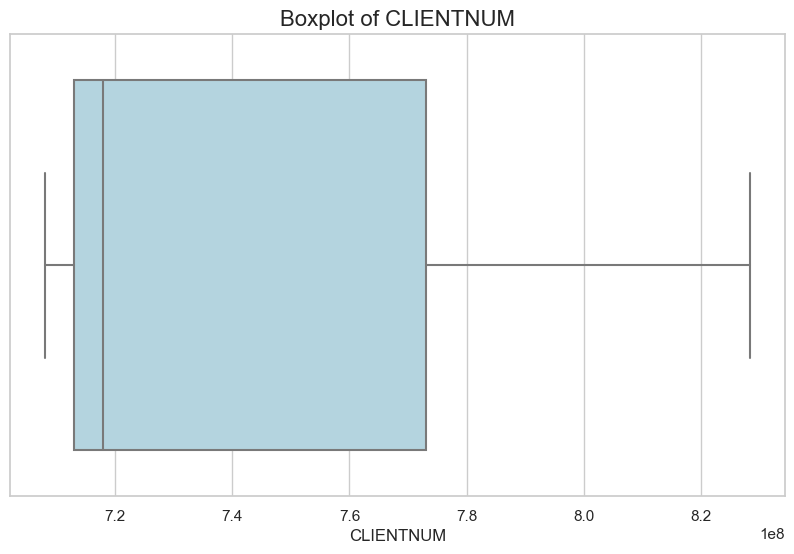

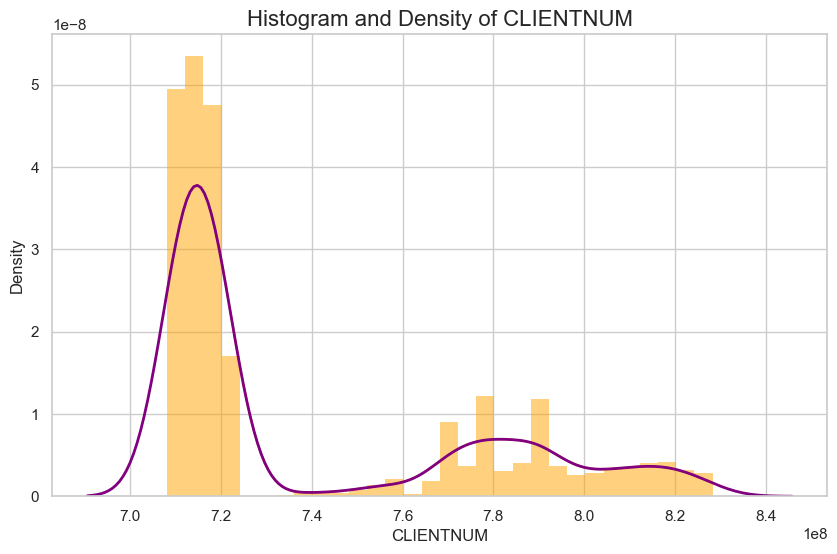

In [ ]:
analyze_numerical(df, 'CLIENTNUM')

## CLIENTNUM Data Overview
- There are no missing values in the CLIENTNUM column. We will remove this column, as it will not be useful for our purposes.

In [ ]:
# Since 'clientnum' will have less benefit to our purpose, we remove the column in place
df.drop('CLIENTNUM', axis=1, inplace=True)
df_new=df.copy()

## Attrition_Flag

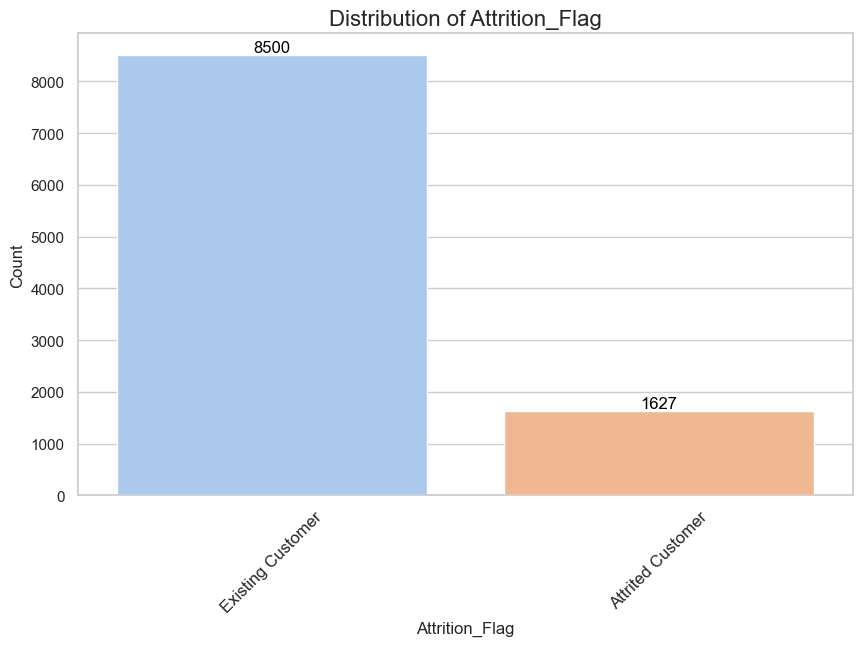

In [ ]:
# univariate analysis for Attrition_Flag
analyze_categorical(df, 'Attrition_Flag')

### Attrition_Flag Data Overview
- **Data Overview**: The dataset has 10,127 entries, with 8,500 existing customers and 1,627 attrited customers.
- **Missing Values**: There are no missing values in the `Attrition_Flag`, indicating complete data for this variable.
- **Skewness**: The distribution is skewed towards existing customers, which may affect predictive modeling.
- This is the target variable
- **Class Imbalance**: The dataset has 8,500 existing customers and 1,627 attrited customers, indicating a significant imbalance that may require oversampling or undersampling techniques to improve model performance.

## Gender

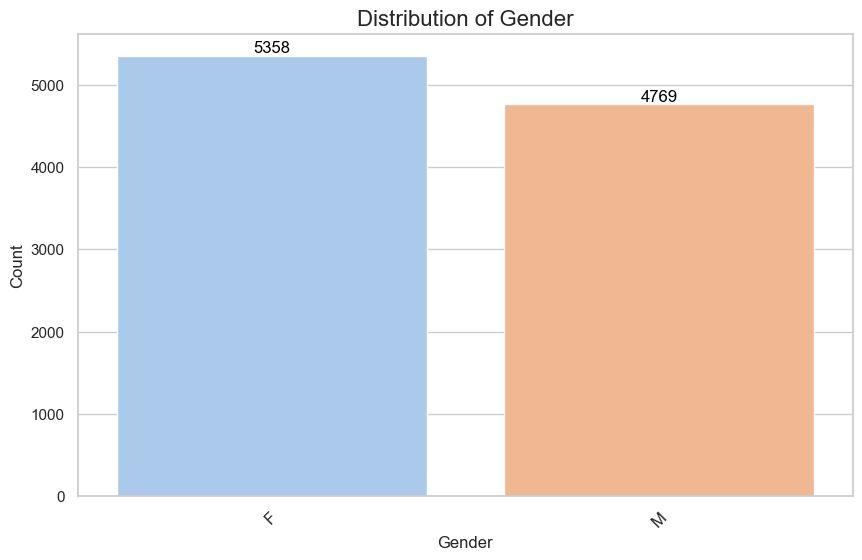

In [ ]:
#univariate analysis for gender
analyze_categorical(df, 'Gender')

### Gender
- **Data Overview**: The gender distribution shows slightly more females (5,358) than males (4,769).
- **Missing Values**: There are no missing values in the `Gender` variable, ensuring all records are accounted for.
- **Skewness**: The data is relatively balanced but slightly skewed towards female customers.

## Education_Level

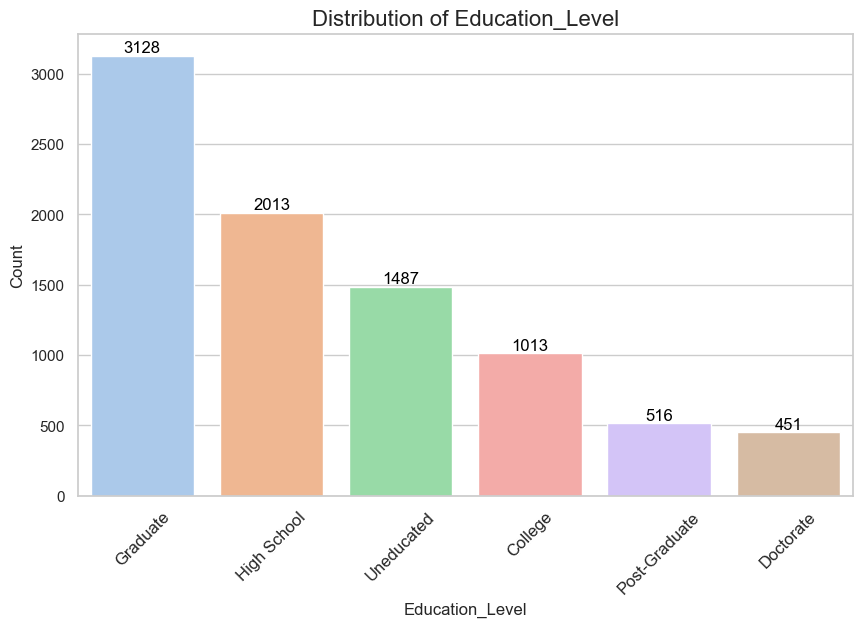

In [ ]:
#univariate analysis for Education_level
analyze_categorical(df, 'Education_Level')

### Education_Level
- **Data Overview**: The highest number of customers are graduates (3,128), followed by high school (2,013) and uneducated (1,487). The least number of customers are those with a doctorate (451).
- **Missing Values**: The variable has 1,519 missing values, which is significant and should be addressed.


## Marital_Status

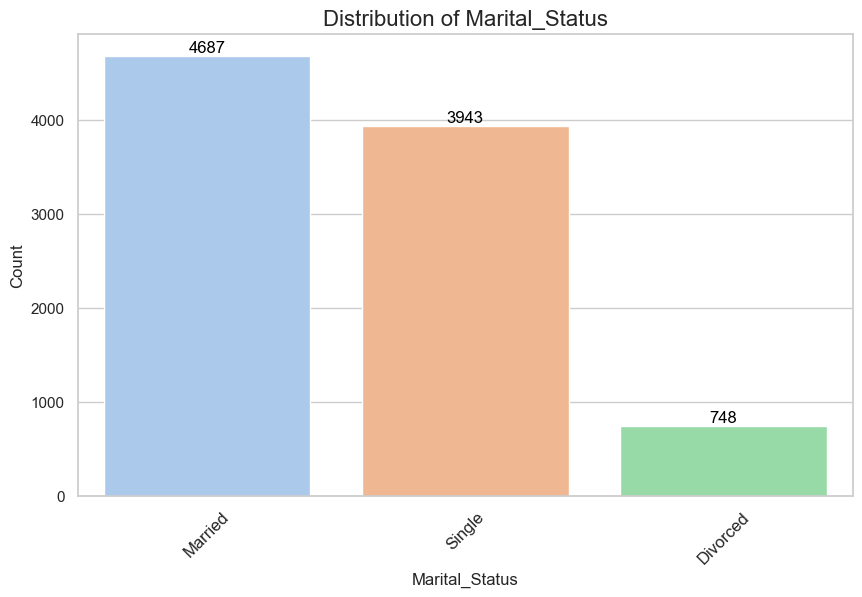

In [ ]:
#univariate analysis for Marital status
analyze_categorical(df, 'Marital_Status')


### Marital_Status
- **Data Overview**: Most customers are married (4,687), followed by single (3,943) and divorced (748).
- **Missing Values**: There are 749 missing values, which could influence analysis and should be imputed or addressed.

## Income_Category

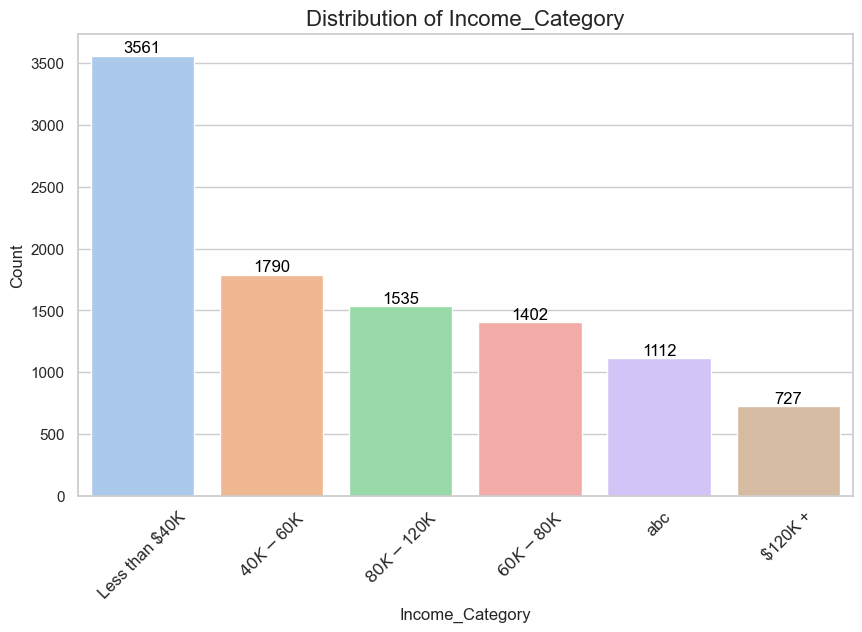

In [ ]:
#univariate analysis for income category
analyze_categorical(df, 'Income_Category')

### Income_Category
- **Data Overview**: The most common income category is *less than \$40K* (3,561), with diverse distribution across other categories. The least number of customers are in the *$120K+* category (727).
- The 'abc' category in the Income_Category has 1,112 records, indicating a significant portion of the dataset, but it appears to represent an invalid or placeholder value.

## Card_Category

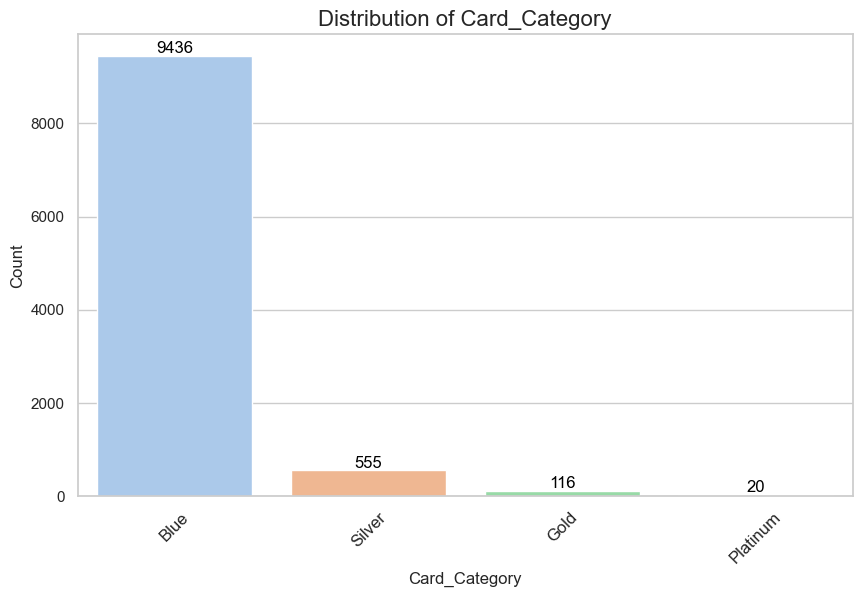

In [ ]:
#univariate analysis for card category
analyze_categorical(df, 'Card_Category')

### Card_Category
- **Data Overview**: The vast majority of customers possess a Blue card, with 9,436 holders representing 93.9% of the total, while there are only a few Platinum cardholders, totaling 20 and accounting for 0.2%.

- **Missing Values**: There are no missing values, ensuring full representation in this category.

## Customer_Age

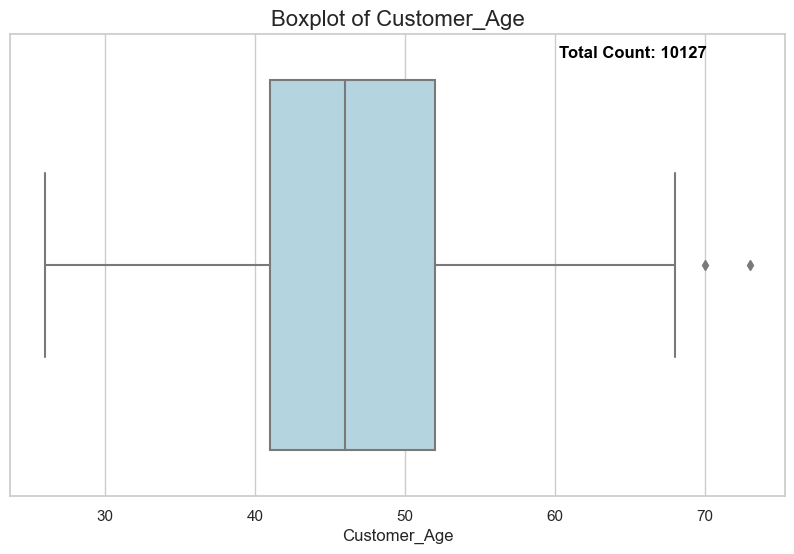

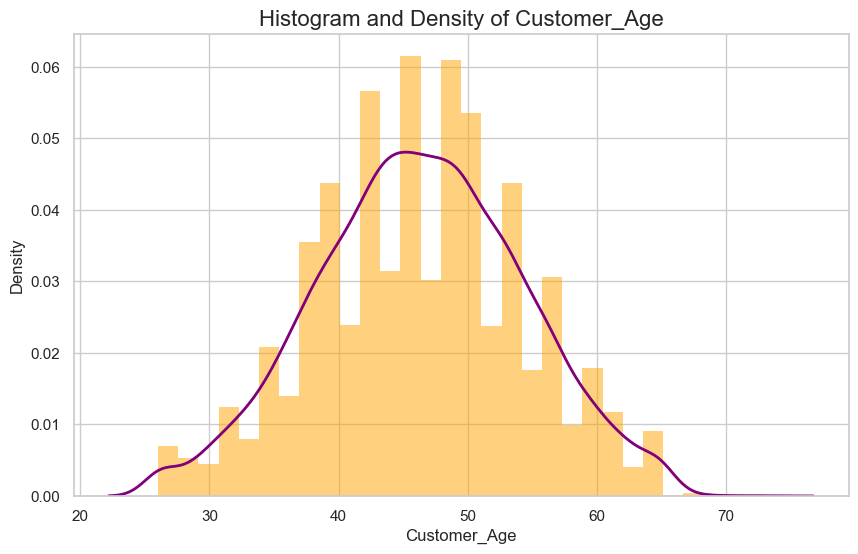

In [ ]:
#univariate analysis for customer age
analyze_numerical(df, 'Customer_Age')

### Customer_Age
- **Data Overview**: The mean age is approximately 46 years, with a range from 26 to 73 years.
- **Outliers**: Two outliers are present, with ages 70 and 73, which are above the typical range.
- **Missing Values**: There are no missing values, ensuring all records are included in analysis.
- **Skewness**: The age distribution is slightly skewed towards older customers, which may affect product offerings.

## Dependent_count

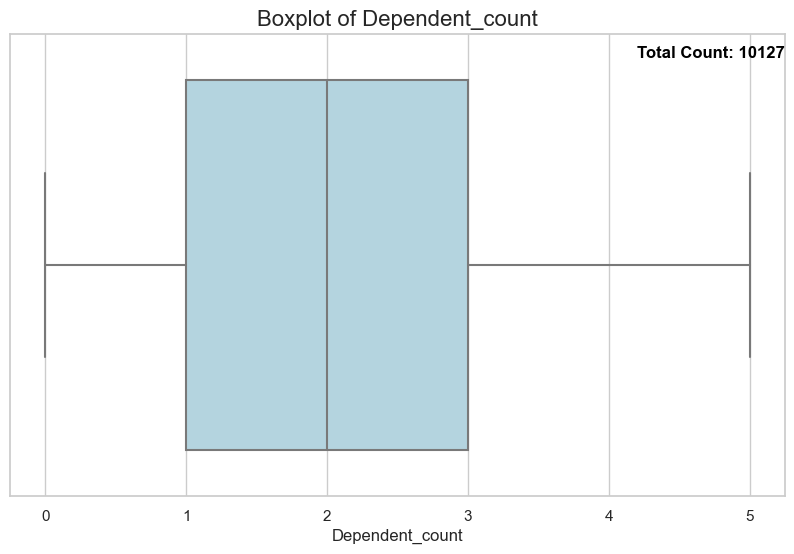

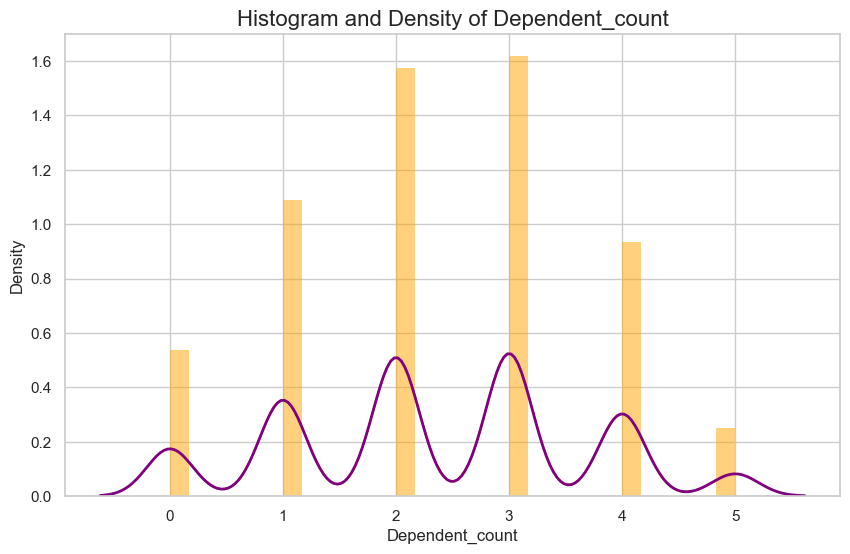

In [ ]:
#univariate analysis for dependent count
analyze_numerical(df, 'Dependent_count')

### Dependent_count
- **Data Overview**: The average number of dependents is around 2.35, with a maximum of 5 dependents.
- **Outliers**: There are no outliers in this variable, indicating normal behavior among customers.
- **Missing Values**: There are no missing values, providing complete data for this feature.
- **Skewness**: The distribution is relatively symmetrical, indicating a typical number of dependents among customers.

## Months_on_book

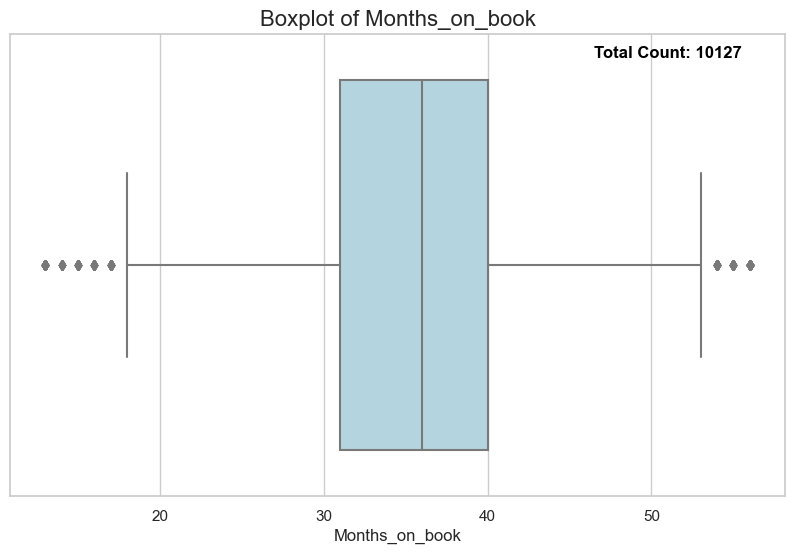

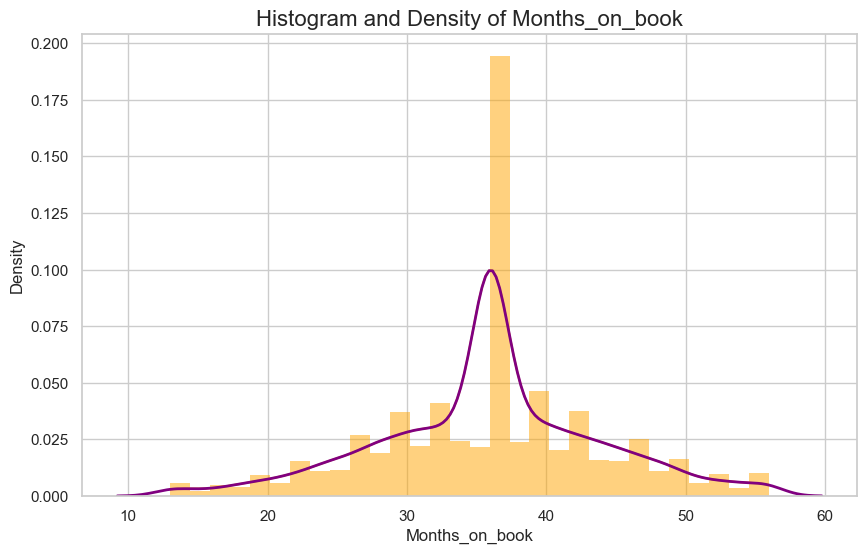

In [ ]:
#univariate analysis for months_on_book
analyze_numerical(df, 'Months_on_book')

### Months_on_book
- **Data Overview**: The average customer has been on book for about 36 months, with a maximum of 56 months.
- **Outliers**: A significant number of outliers (386) exist, indicating some customers may have longer relationships with the bank.
- **Missing Values**: There are no missing values, providing complete records.
- **Skewness**: The distribution may be skewed right due to some customers having long tenures.


## Total_Relationship_Count

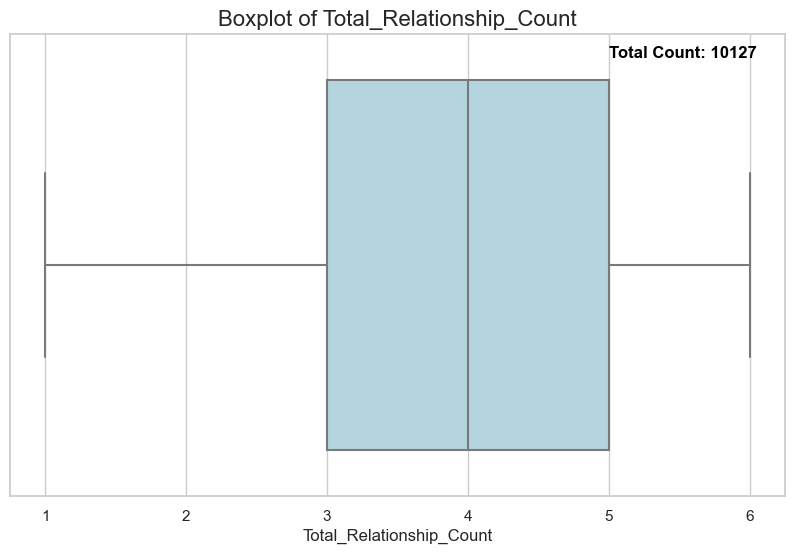

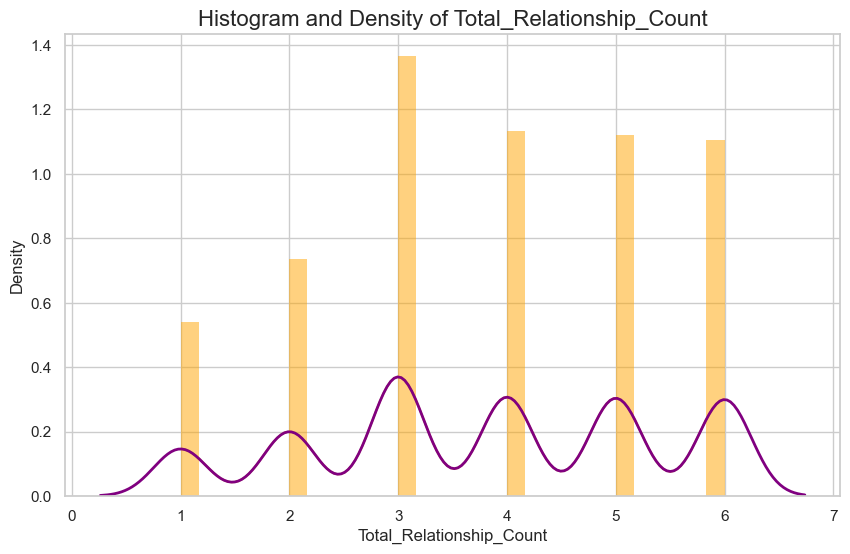

In [ ]:
#univariate analysis for Total_Relationship_Count
analyze_numerical(df, 'Total_Relationship_Count')

### Total_Relationship_Count
- **Data Overview**: The average relationship count is around 3.81, with a maximum of 6.
- **Outliers**: There are no outliers detected, indicating consistent relationship counts among customers.
- **Missing Values**: There are no missing values in this variable, ensuring full data availability.
- **Skewness**: The distribution is moderately skewed, suggesting most customers have multiple relationships.

## Months_Inactive_12_mon

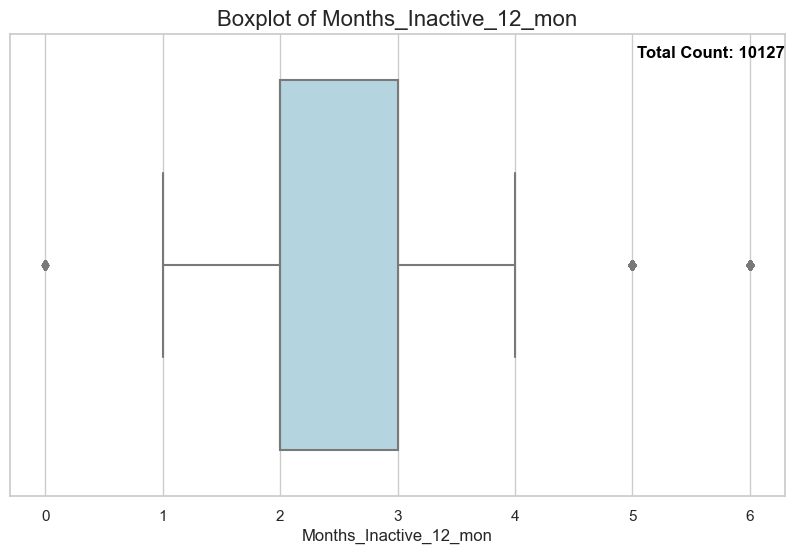

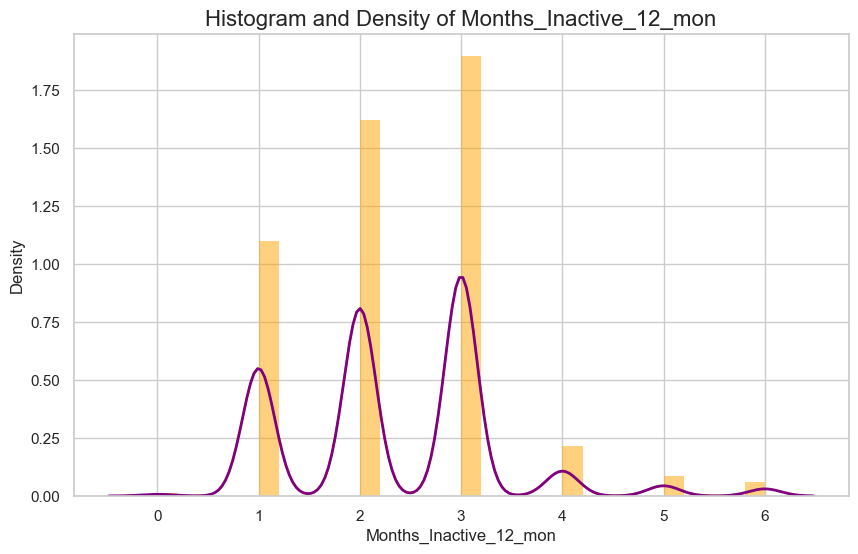

In [ ]:
#univariate analysis on Months_Inactive_12_mon
analyze_numerical(df, 'Months_Inactive_12_mon')

### Months_Inactive_12_mon
- **Data Overview**: The mean is about 2.34 months inactive in the last year, with some variation.
- **Outliers**: There are 331 outliers, suggesting some customers have been inactive for longer periods.
- **Missing Values**: There are no missing values, providing complete records.
- **Skewness**: The distribution is right-skewed, indicating many customers have low inactivity.


## Contacts_Count_12_mon

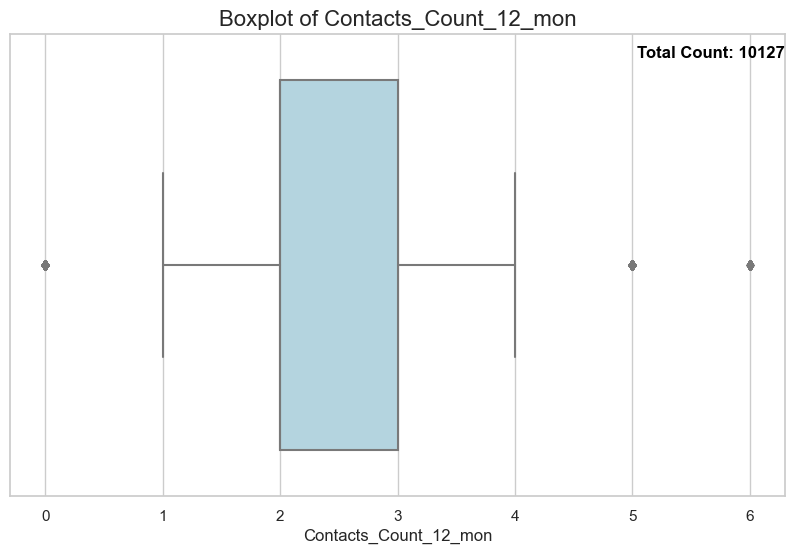

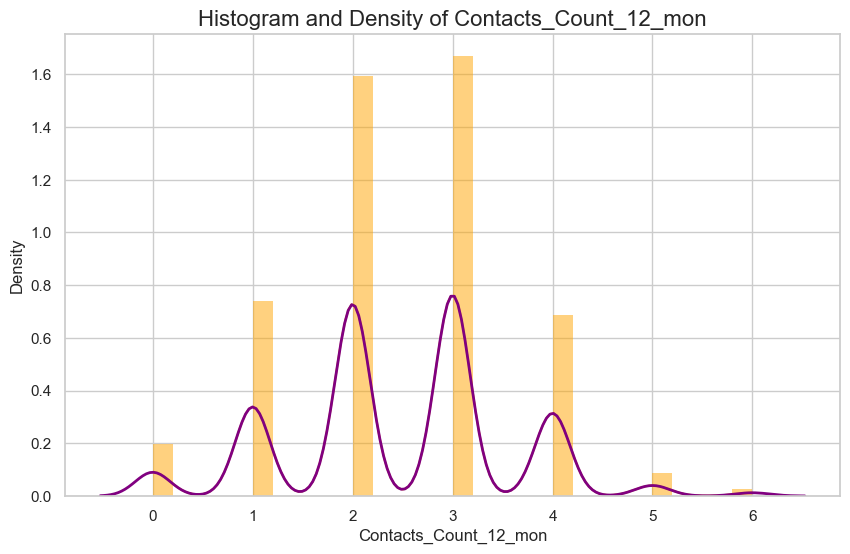

In [ ]:
#univariate analysis for Contacts_Count_12_mon
analyze_numerical(df, 'Contacts_Count_12_mon')

### Contacts_Count_12_mon
- **Data Overview**: On average, customers had about 2.46 contacts in the last year, with some having none.
- **Outliers**: There are 629 outliers, suggesting a few customers received many contacts.
- **Missing Values**: There are no missing values in this variable, ensuring data completeness.
- **Skewness**: The distribution is right-skewed, indicating some customers may be significantly more engaged.

## Credit_Limit

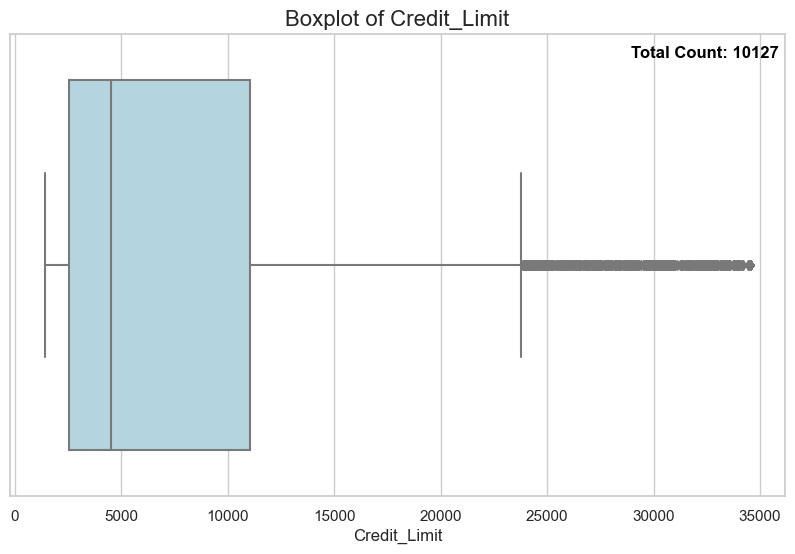

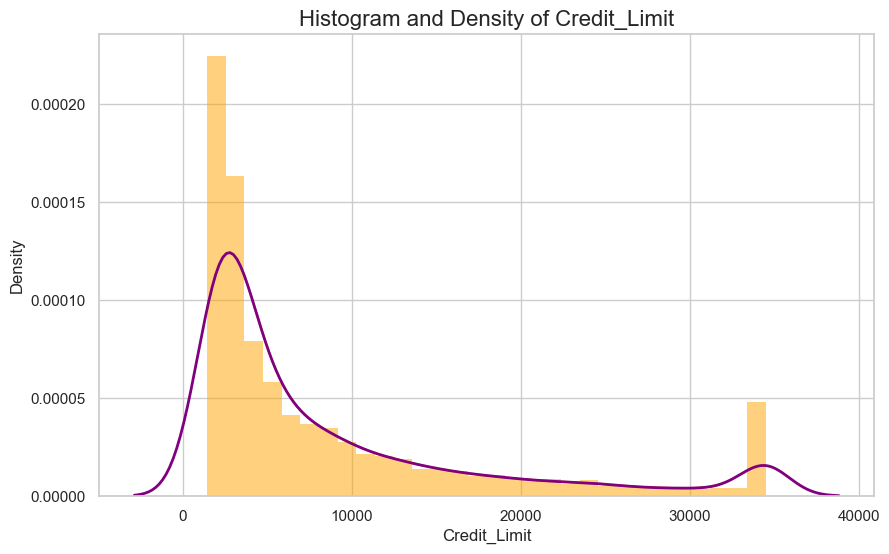

In [ ]:
#univariate analysis for Credit_Limit
analyze_numerical(df, 'Credit_Limit')

### Credit_Limit
- **Data Overview**: The average credit limit is approximately $8,632, with a maximum limit of \$34,516.
- **Outliers**: A total of 984 outliers exist, indicating some customers have very high credit limits.
- **Missing Values**: There are no missing values, providing complete information for analysis.
- **Skewness**: The distribution is right-skewed, suggesting that most customers have lower credit limits compared to a few high-limit accounts.

## Total_Revolving_Bal

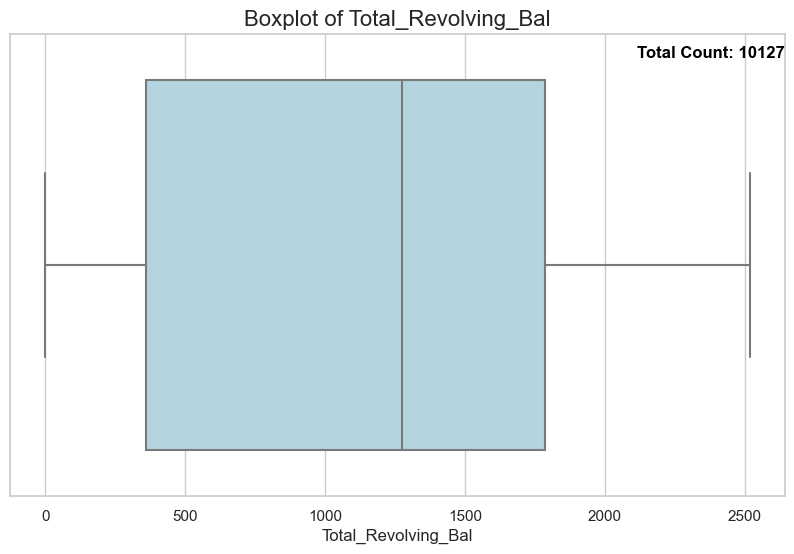

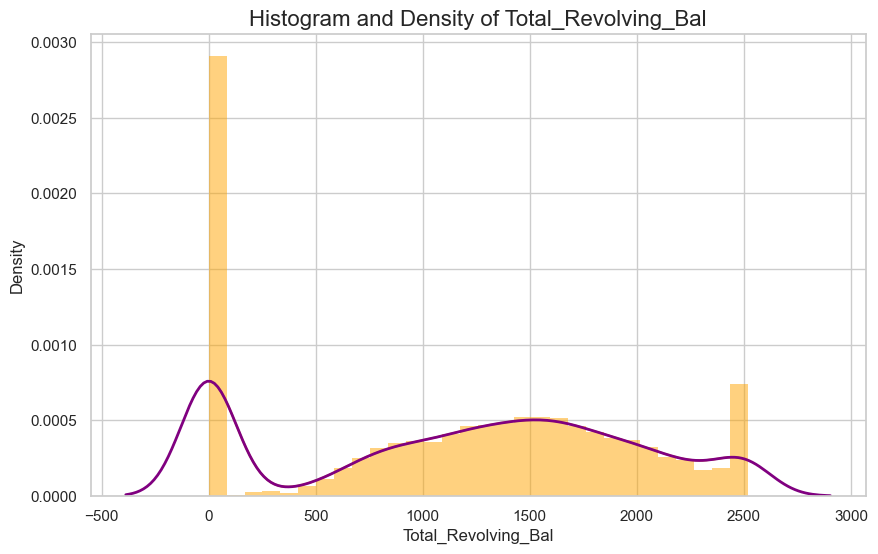

In [ ]:
#univarate analysis for Total_Revolving_Bal
analyze_numerical(df, 'Total_Revolving_Bal')

### Total_Revolving_Bal
- **Data Overview**: The average revolving balance is around \$1,163, with a maximum of \$2,517.
- **Outliers**: There are no outliers in this variable, suggesting typical behavior among customers.
- **Missing Values**: There are no missing values, ensuring full representation in this category.
- **Skewness**: The distribution is slightly right-skewed, indicating a concentration of customers with lower balances.

# Avg_Open_To_Buy

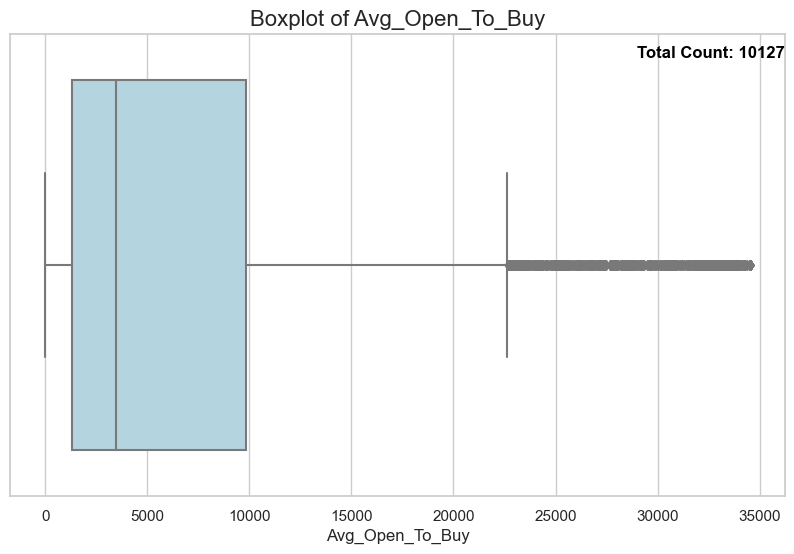

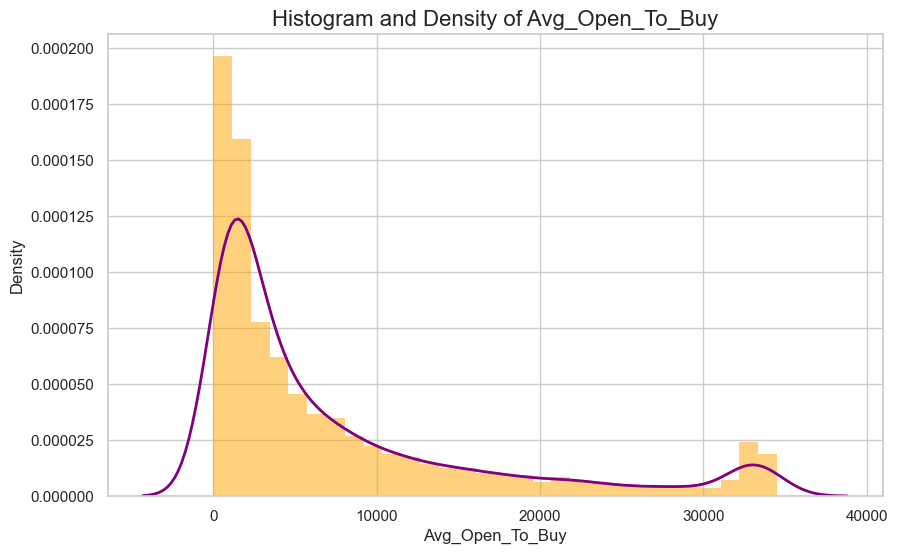

In [ ]:
#univarate analysis for Avg_Open_To_Buy
analyze_numerical(df, 'Avg_Open_To_Buy')

### Avg_Open_To_Buy
- **Data Overview**: The average open-to-buy amount is around \$7,469, with a maximum limit of \$34,516.
- **Outliers**: There are 963 outliers, indicating some customers have significantly higher open-to-buy amounts.
- **Missing Values**: There are no missing values, ensuring data completeness.
- **Skewness**: The distribution is right-skewed, indicating a few customers hold a large proportion of the available credit.

## Total_Amt_Chng_Q4_Q1

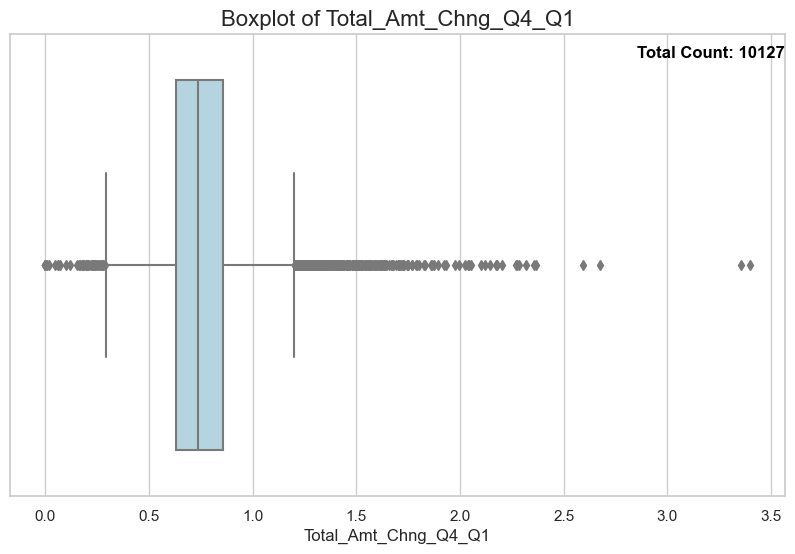

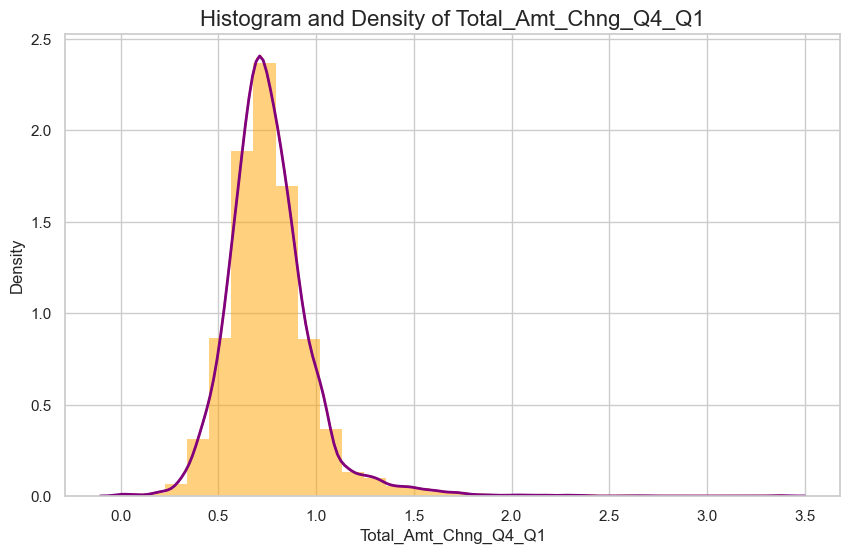

In [ ]:
#univariate analysis for Total_Amt_Chng_Q4_Q1
analyze_numerical(df, 'Total_Amt_Chng_Q4_Q1')

### Total_Amt_Chng_Q4_Q1
- **Data Overview**: The average amount change from Q1 to Q4 is approximately 0.76, indicating some fluctuation.
- **Outliers**: There are 396 outliers, suggesting some accounts experienced significant changes.
- **Missing Values**: There are no missing values, providing complete data for analysis.
- **Skewness**: The distribution is somewhat right-skewed, indicating some customers have larger fluctuations in spending.

## Total_Trans_Amt

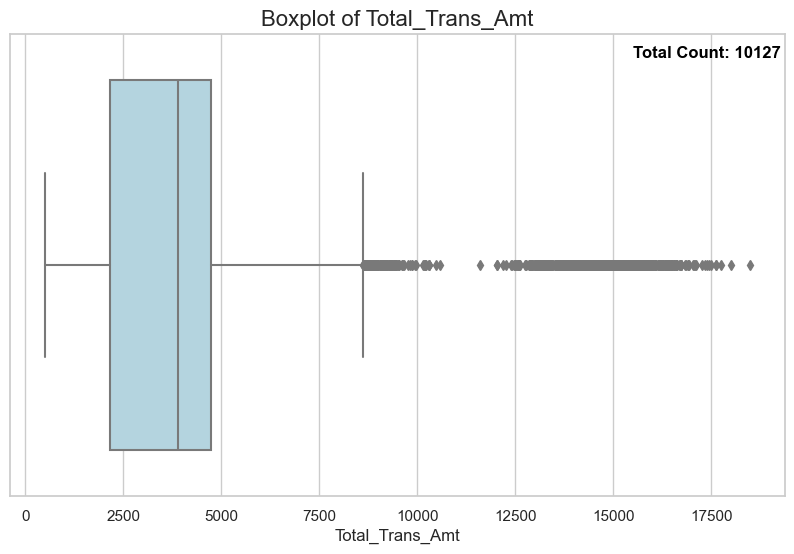

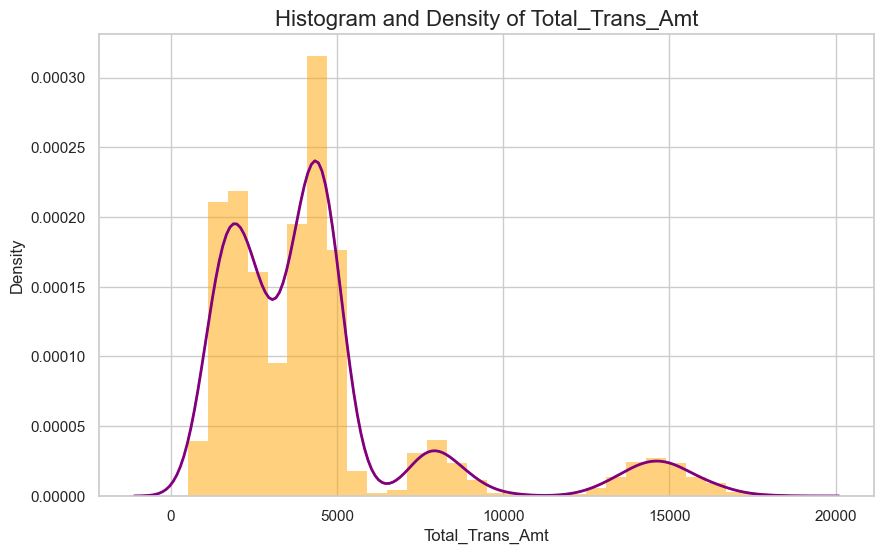

In [ ]:
#univariate analysis for Total_Trans_Amt
analyze_numerical(df, 'Total_Trans_Amt')

### Total_Trans_Amt
- **Data Overview**: The average transaction amount is about \$4,404, with a maximum of \$18,484.
- **Outliers**: There are 896 outliers, indicating some transactions are significantly higher than the norm.
- **Missing Values**: There are no missing values in this variable, ensuring all data is included.
- **Skewness**: The distribution is right-skewed, suggesting a concentration of smaller transactions among most customers.

## Total_Trans_Ct

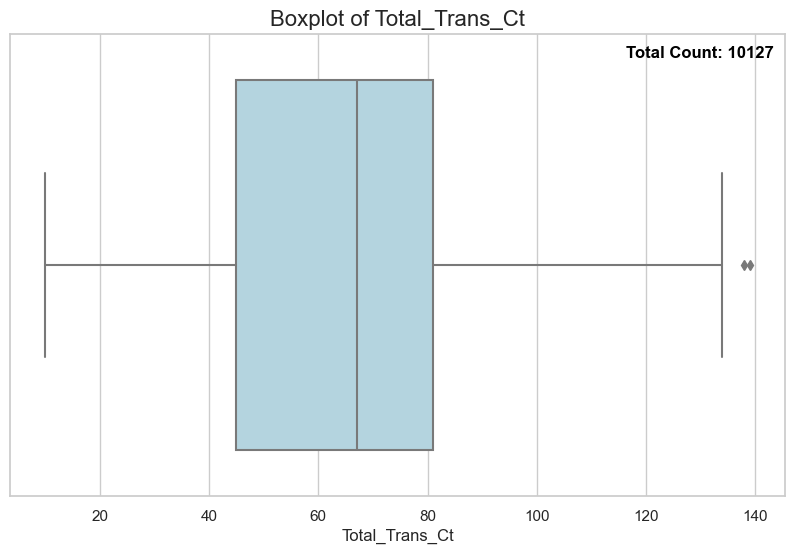

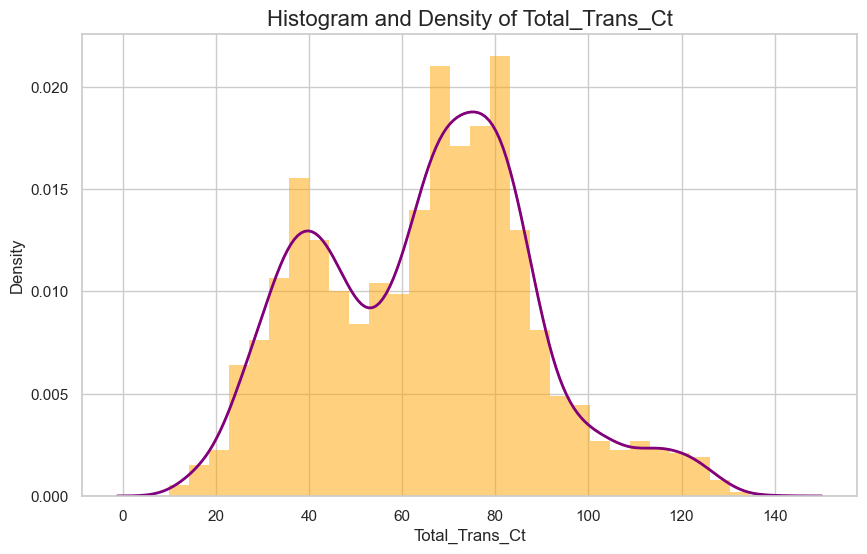

In [ ]:
#univarite analysis for Total_Trans_Ct
analyze_numerical(df, 'Total_Trans_Ct')

### Total_Trans_Ct
- **Data Overview**: The average transaction count is about 64.86, with a maximum of 139 transactions.
- **Outliers**: There are 2 outliers, indicating a couple of customers have exceptionally high transaction counts.
- **Missing Values**: There are no missing values, ensuring complete data for analysis.
- **Skewness**: The distribution is slightly right-skewed, indicating a few customers may have high transaction counts.

## Total_Ct_Chng_Q4_Q1

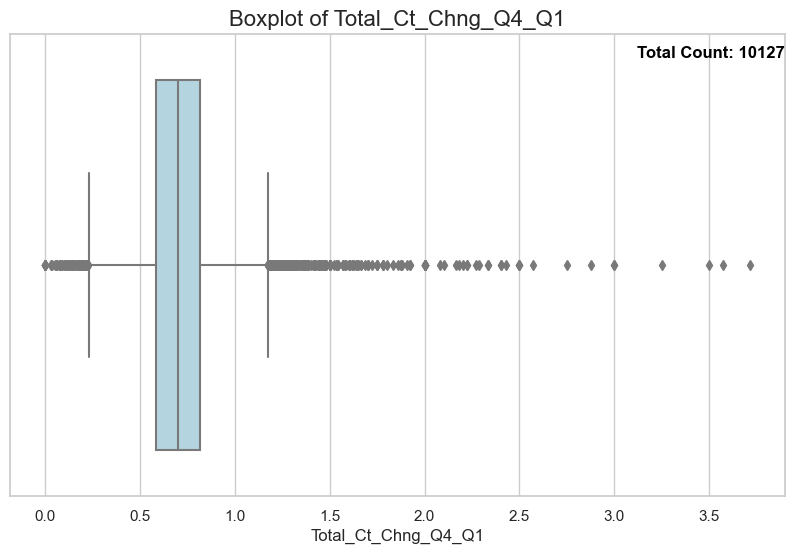

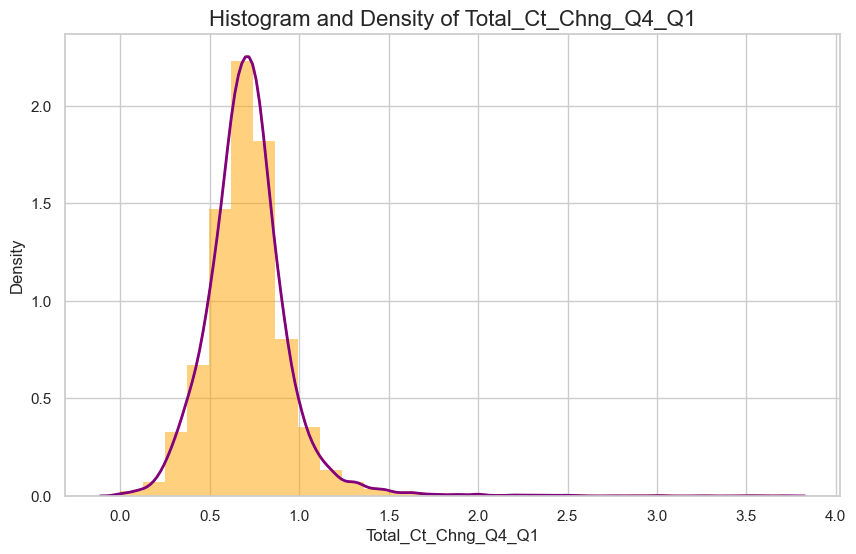

In [ ]:
#univariate analysis for Total_Ct_Chng_Q4_Q1
analyze_numerical(df, 'Total_Ct_Chng_Q4_Q1')

### Total_Ct_Chng_Q4_Q1
- **Data Overview**: The average change in transaction count from Q1 to Q4 is approximately 0.71.
- **Outliers**: There are 394 outliers, suggesting some accounts had significant changes in their transaction counts.
- **Missing Values**: There are no missing values, providing complete data for this variable.
- **Skewness**: The distribution is right-skewed, indicating some customers may exhibit large changes in their transaction behavior.

## Avg_Utilization_Ratio

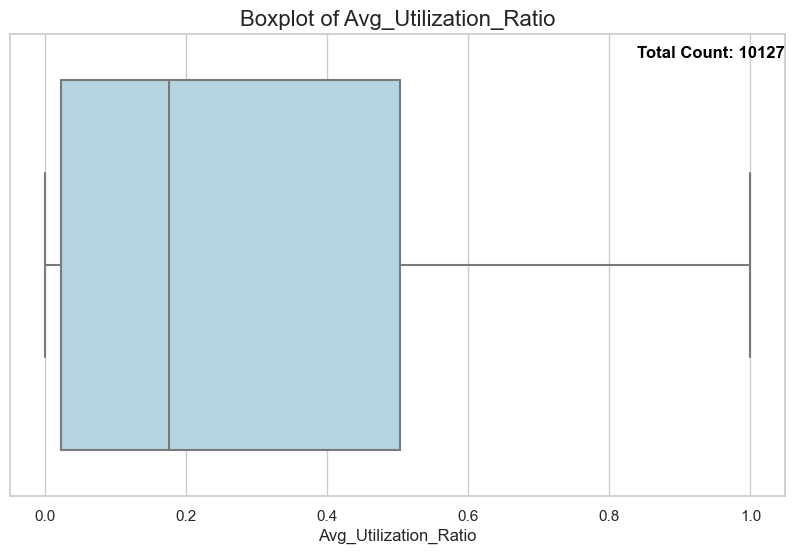

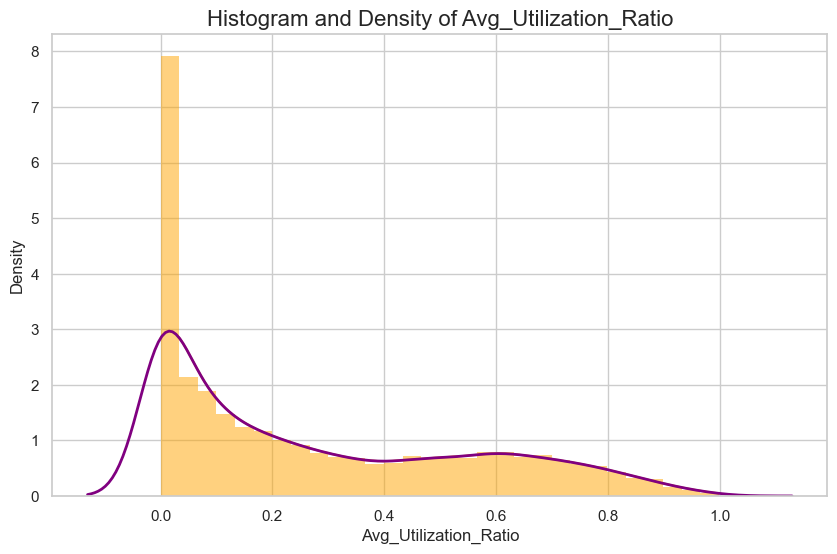

In [ ]:
#univariate analysis for Avg_Utilization_Ratio
analyze_numerical(df, 'Avg_Utilization_Ratio')

### Avg_Utilization_Ratio
- **Data Overview**: The average utilization ratio is around 0.27, indicating a moderate usage of available credit.
- **Outliers**: There are no outliers, indicating consistent behavior across customers.
- **Missing Values**: There are no missing values, ensuring data completeness.
- **Skewness**: The distribution is slightly right-skewed, indicating that a majority of customers maintain a lower utilization ratio.

#### The below functions need to be defined to carry out the Exploratory Data Analysis.

In [ ]:
def numerical_predictor_vs_target(data, predictor, target):
    """
    Analyze the distribution of a numerical predictor with respect to the target variable.

    data: DataFrame
    predictor: str - name of the numerical predictor variable
    target: str - name of the target variable
    """
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    # Print summary statistics including outliers
    for unique_value in target_uniq:
        subset = data[data[target] == unique_value]
        count = subset[predictor].count()
        mean = subset[predictor].mean()
        std = subset[predictor].std()
        min_val = subset[predictor].min()
        max_val = subset[predictor].max()
        median = subset[predictor].median()
        skewness = subset[predictor].skew()

        # Outlier detection using IQR method
        Q1 = subset[predictor].quantile(0.25)
        Q3 = subset[predictor].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outlier_condition = (subset[predictor] < lower_bound) | (subset[predictor] > upper_bound)
        outlier_count = subset[outlier_condition][predictor].count()
        # print(f"---{predictor} vs {target}")
        # print(f"--- Summary for {target}={unique_value} ---")
        # print(f"Count: {count}, Mean: {mean:.2f}, Std: {std:.2f}, Min: {min_val:.2f}, Max: {max_val:.2f}, Median: {median:.2f}, Skewness: {skewness:.2f}, Outliers: {outlier_count}\n")

    # Overall summary statistics
    overall_count = data[predictor].count()
    overall_mean = data[predictor].mean()
    overall_std = data[predictor].std()
    overall_min = data[predictor].min()
    overall_max = data[predictor].max()
    overall_median = data[predictor].median()
    overall_Q1 = data[predictor].quantile(0.25)
    overall_Q3 = data[predictor].quantile(0.75)
    overall_IQR = overall_Q3 - overall_Q1
    overall_skewness = data[predictor].skew()

    overall_lower_bound = overall_Q1 - 1.5 * overall_IQR
    overall_upper_bound = overall_Q3 + 1.5 * overall_IQR

    overall_outlier_condition = (data[predictor] < overall_lower_bound) | (data[predictor] > overall_upper_bound)
    total_outliers = data[overall_outlier_condition][predictor].count()

    # Histogram for existing customers
    axs[0, 0].set_title("Distribution of " + predictor + " for " + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )
    axs[0, 0].set_xlabel(predictor)
    axs[0, 0].set_ylabel("Density")

    # Histogram for attrited customers
    axs[0, 1].set_title("Distribution of " + predictor + " for " + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )
    axs[0, 1].set_xlabel(predictor)
    axs[0, 1].set_ylabel("Density")

    # Boxplot for both categories
    axs[1, 0].set_title("Boxplot w.r.t " + target)
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette={"Attrited Customer": "orange", "Existing Customer": "teal"})
    axs[1, 0].set_xlabel(target)
    axs[1, 0].set_ylabel(predictor)

    # Boxplot without outliers
    axs[1, 1].set_title("Boxplot (without outliers) w.r.t " + target)
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette={"Attrited Customer": "orange", "Existing Customer": "teal"},
    )
    axs[1, 1].set_xlabel(target)
    axs[1, 1].set_ylabel(predictor)

    plt.tight_layout()
    plt.show()

In [ ]:
# Function to analyze categorical predictors with respect to the target variable
def categorical_predictors_vs_target(data, predictor, target):
    """
    Analyze categorical predictor with respect to the target variable

    data: dataframe
    predictor: categorical predictor variable
    target: target variable
    """
  #  print(f"--- Analysis for {predictor} with respect to {target} ---\n")

    # Descriptive Statistics
    descriptive_stats = data[[predictor, target]].groupby([predictor, target]).size().unstack(fill_value=0)
   # print(descriptive_stats)

    # Bar plot
    plt.figure(figsize=(14, 7));
    sns.countplot(data=data, x=predictor, hue=target, palette={"Existing Customer": "teal", "Attrited Customer": "orange"})
    plt.title(f'Count Plot of {predictor} with respect to {target}', fontsize=16)
    plt.xlabel(predictor, fontsize=12)
    plt.ylabel("Count", fontsize=12)

    # Add counts on top of the bars
    for p in plt.gca().patches:
        count = int(p.get_height())
        if count > 0:  # Only annotate bars with counts greater than 0
            plt.gca().annotate(f'{count}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 9), textcoords='offset points')

    plt.show()

    print("\n\n")

    # Stacked bar plot with percentages
    count = data[predictor].nunique()
    sorter = data[target].value_counts().index[-1]
    tab = pd.crosstab(data[predictor], data[target], normalize='index').sort_values(by=sorter, ascending=False)

    # Print the data summary of the stacked plot
    #print("Categorical Summary with Percentages:\n")
    tab_percentages = tab * 100
    tab_percentages['Total'] = tab_percentages.sum(axis=1)
    #print(tab_percentages)

    # Increase bar width for the stacked plot
    plt.figure(figsize=(16, 6));  # Set figsize for stacked plot
    ax = tab.plot(kind='bar', stacked=True, figsize=(count + 1, 6), color=["orange", "teal"], width=0.8)
    plt.legend(loc="upper left", bbox_to_anchor=(1, 1))
    plt.title(f'Stacked Bar Plot of {predictor} with respect to {target}', fontsize=16)
    plt.xlabel(predictor, fontsize=12)
    plt.ylabel("Proportion", fontsize=12)

    # Add percentages to the bars with adjusted font size
    for bars in ax.containers:
        ax.bar_label(bars, labels=[f'{h*100:.1f}%' for h in bars.datavalues], label_type='center', color='white', weight='bold', fontsize=8)

    plt.subplots_adjust(hspace=0.4)  # Add space between the two graphs
    plt.show()


## Card_Category vs Attrition_Flag

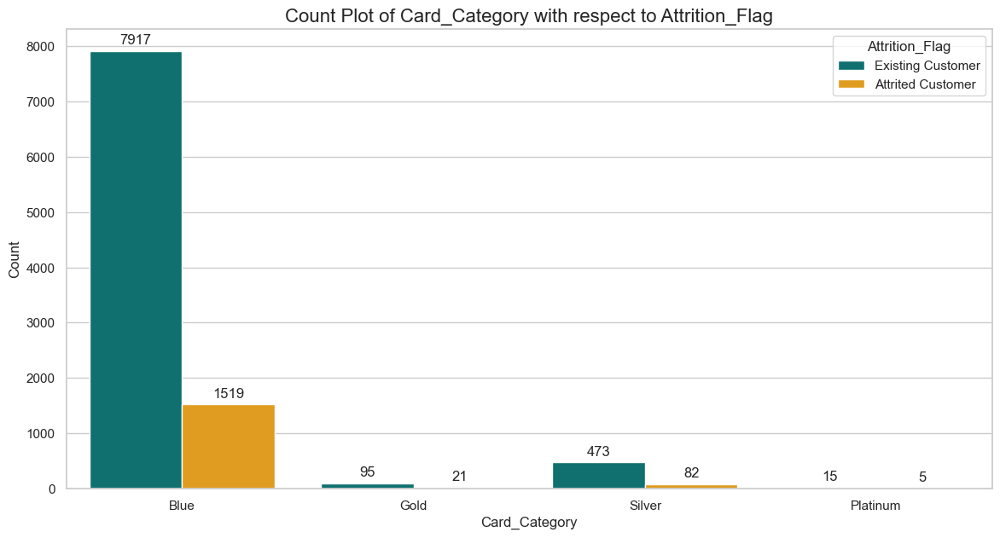

<Figure size 1600x600 with 0 Axes>

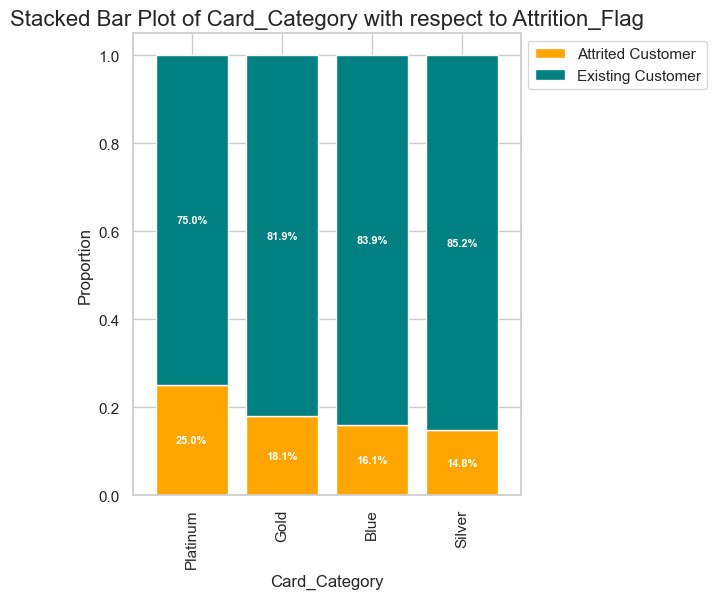

In [ ]:
#Card_Category vs Attrition_Flag
categorical_predictors_vs_target(df, 'Card_Category', 'Attrition_Flag')

### Card_Category vs Attrition_Flag Observations:
- The "Blue" card category has the highest number of attrited customers at 1,519, while "Gold" has the lowest at 21.
- Among card categories, "Platinum" has the highest attrition percentage at 25.00%, indicating a notable loss of customers in that segment.
- "Gold" card holders exhibit an attrition rate of 18.10%, suggesting that nearly one in five customers in this category has attrited.
- The "Silver" card category has the lowest attrition rate at 14.77%, with a significant majority of 85.23% remaining as existing customers.

## Gender vs Attrition_Flag

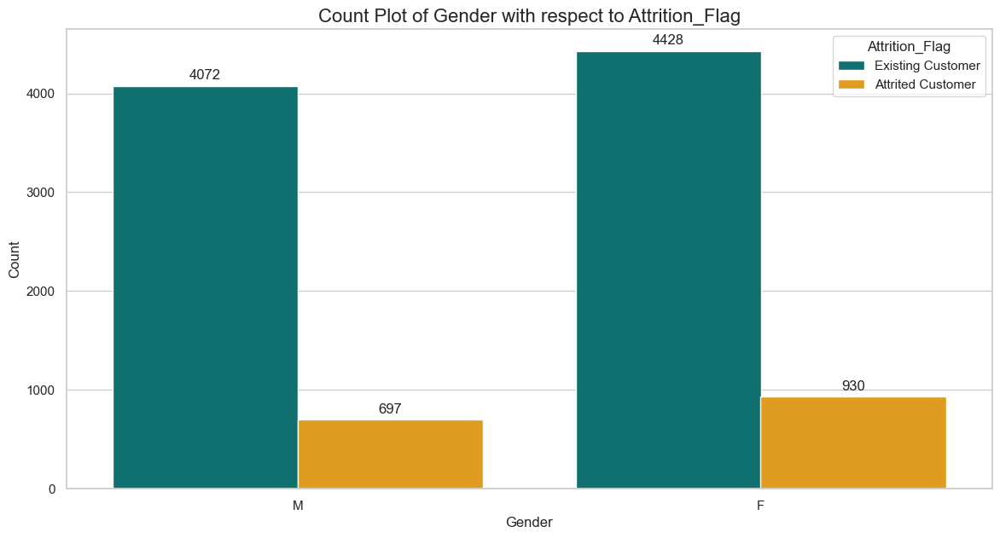

<Figure size 1600x600 with 0 Axes>

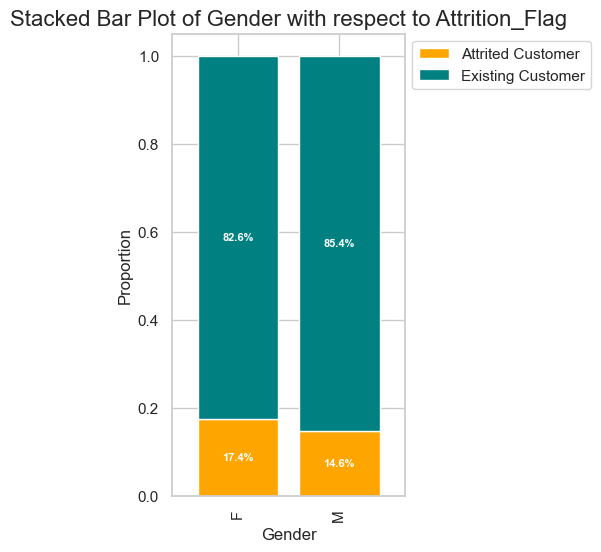

In [ ]:
# Gender vs Attrition_Flag
categorical_predictors_vs_target(df, 'Gender', 'Attrition_Flag')

### Gender vs Attrition_Flag Observations:
- Female customers have a total of 5,358, with 930 of them having attrited, resulting in an attrition rate of 17.36%.
- Male customers total 4,769, with 697 attriting, leading to an attrition rate of 14.62%.
- Despite having a lower overall attrition rate, the absolute number of female attrited customers (930) is higher than that of male attrited customers (697).
- The majority of both genders remain as existing customers, with 82.64% of females and 85.38% of males still active.


## Education_Level vs Attrition_Flag

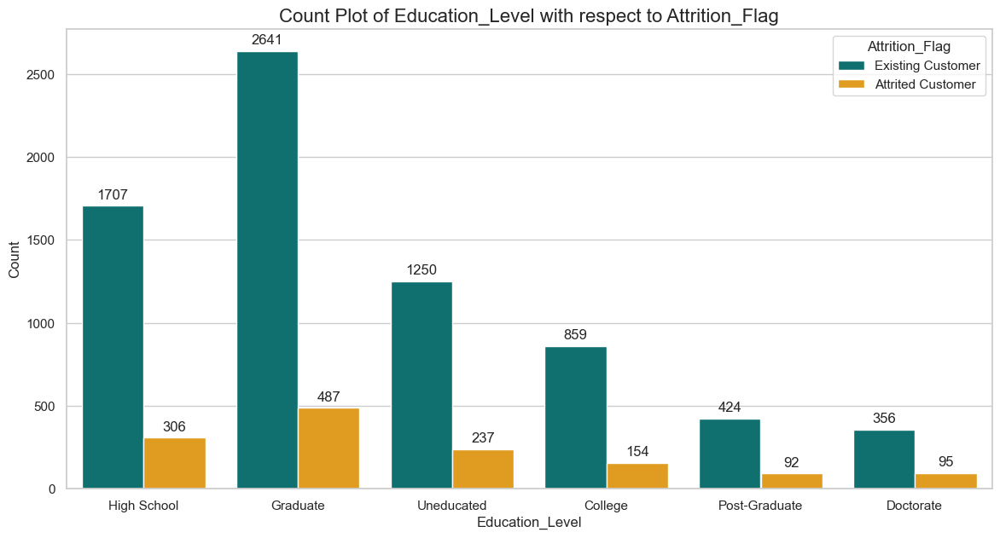

<Figure size 1600x600 with 0 Axes>

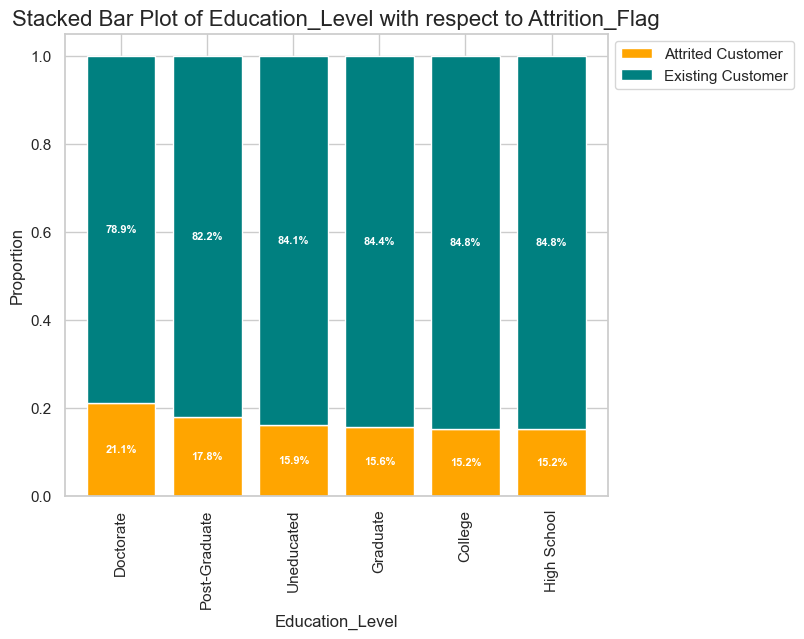

In [ ]:
# Education_Level vs Attrition_Flag
categorical_predictors_vs_target(df, 'Education_Level', 'Attrition_Flag')

Let’s revise the bullet points to include information about the education level with the highest number of customers.

### Education_Level vs Attrition_Flag Observations:
- Among the education levels, **Graduate** holders represent the largest group, with **3,128 total customers**, while having an attrition rate of **15.57%**.
- **Doctorate holders** have the highest attrition rate at **21.06%**, with **95 out of 451 total customers** having attrited.
- **High School graduates** show attrition rate of **15.20%**, with **306 out of 2,013 total customers** having left.
- The **uneducated group** has **1,487 total customers**, of which **237** have attrited, resulting in a lower attrition rate of **15.94%**.

## Marital_Status vs Attrition_Flag

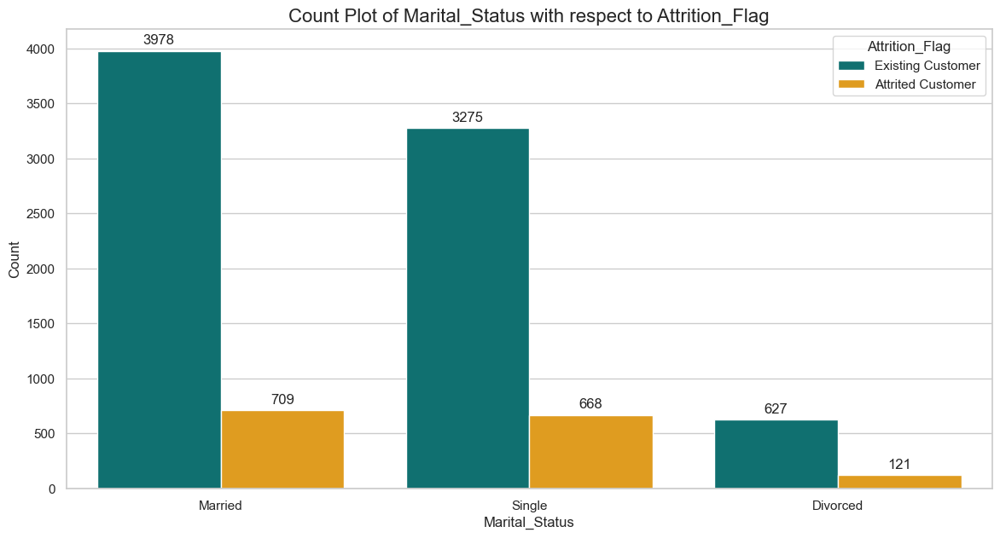

<Figure size 1600x600 with 0 Axes>

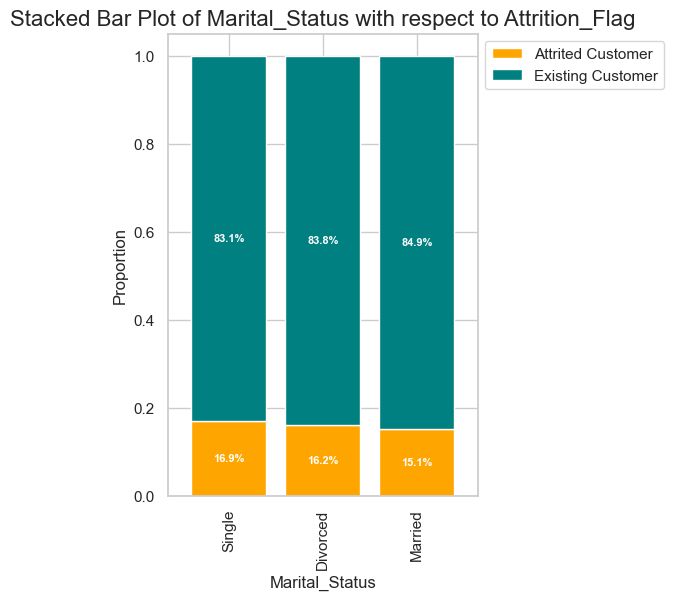

In [ ]:
# Marital_Status vs Attrition_Flag
categorical_predictors_vs_target(df, 'Marital_Status', 'Attrition_Flag')

### Marital_Status vs Attrition_Flag Observations:
- Among the marital statuses, **Married** individuals represent the largest group, with **4,687 total customers** and an attrition rate of **15.13%**.
- **Single customers** have a slightly higher attrition rate at **16.94%**, with **668 out of 3,943 total customers** having attrited.
- **Divorced customers** show an attrition rate of **16.18%**, with **121 out of 748 total customers** having left.
- Overall, the attrition rates are relatively close across the three marital statuses, indicating a consistent pattern in customer retention.

## Income_Category vs Attrition_Flag

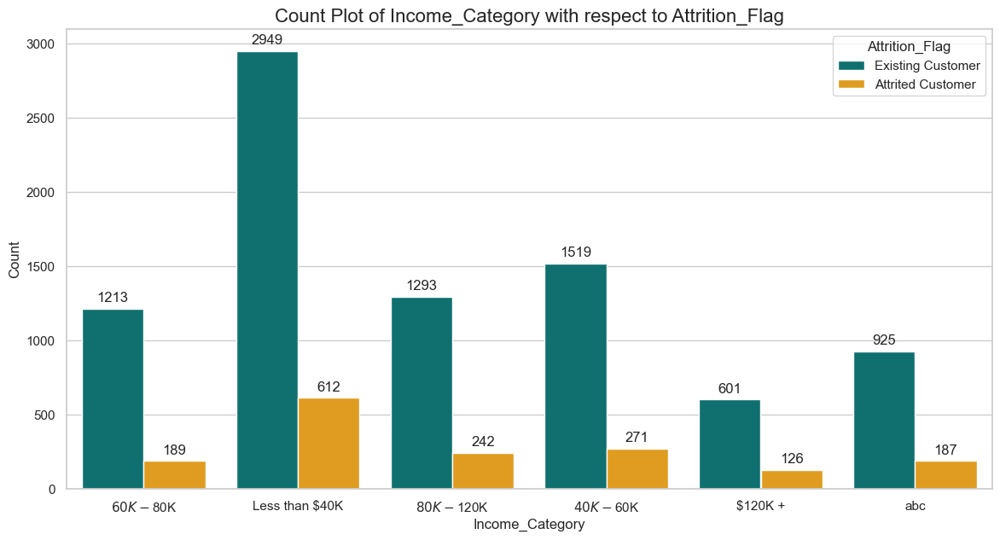

<Figure size 1600x600 with 0 Axes>

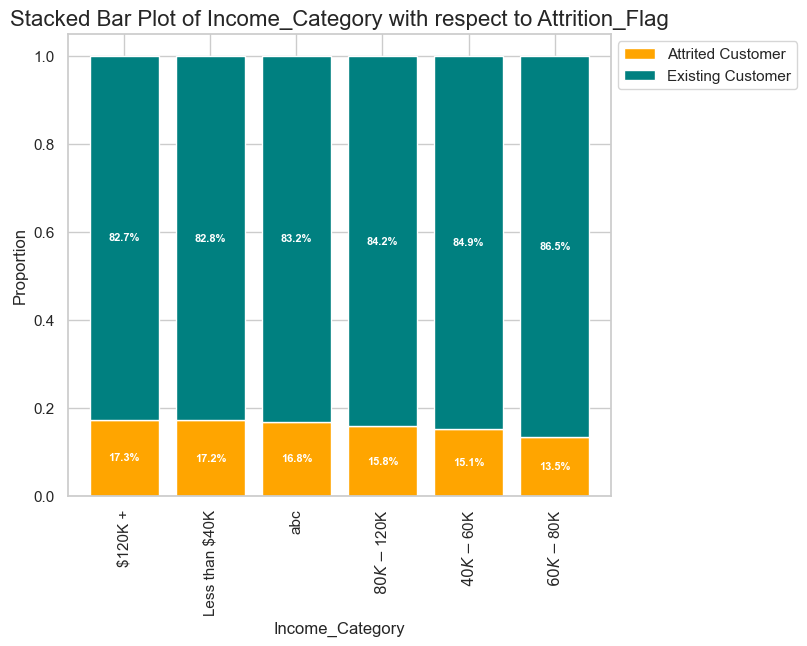

In [ ]:
# Income_Category vs Attrition_Flag
categorical_predictors_vs_target(df, 'Income_Category', 'Attrition_Flag')

### Income_Category vs Attrition_Flag Observations:
- Customers in the **"Less than \$40K"** income category have the highest number of attrited customers, totaling **612 out of 3,561**, which corresponds to an attrition rate of **17.19%**.
- The **"\$120K +"** income category shows a notable attrition rate of **17.33%**, with **126 out of 727** customers having attrited, indicating significant customer loss despite the higher income bracket.
- The **"\$80K - \$120K"** and **"\$40K - \$60K"** categories have lower attrition rates of **15.77%** and **15.14%**, respectively, suggesting better retention among these income groups.
- Overall, higher attrition rates are observed in the lower income categories, highlighting a potential area of concern for customer retention strategies.

## Dependent_count vs Attrition_Flag

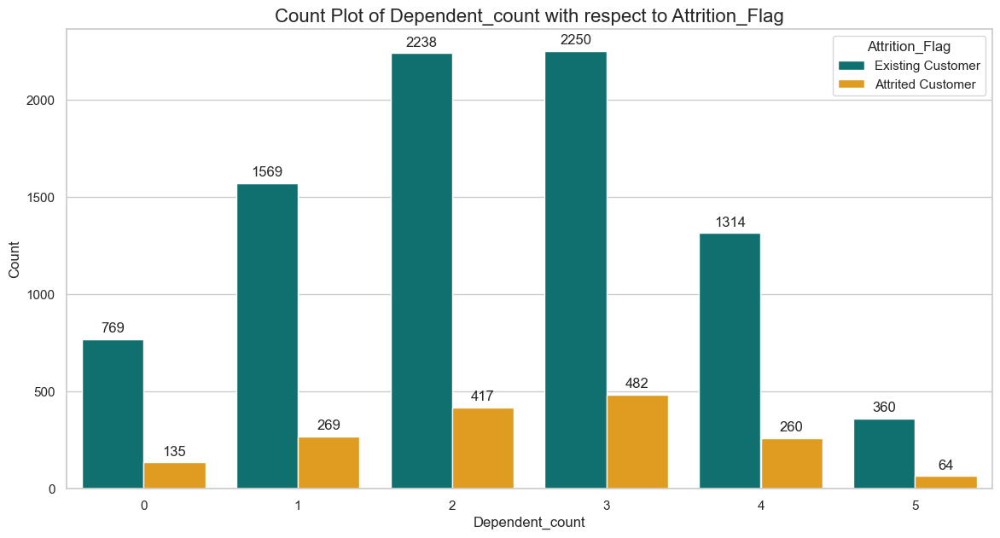

<Figure size 1600x600 with 0 Axes>

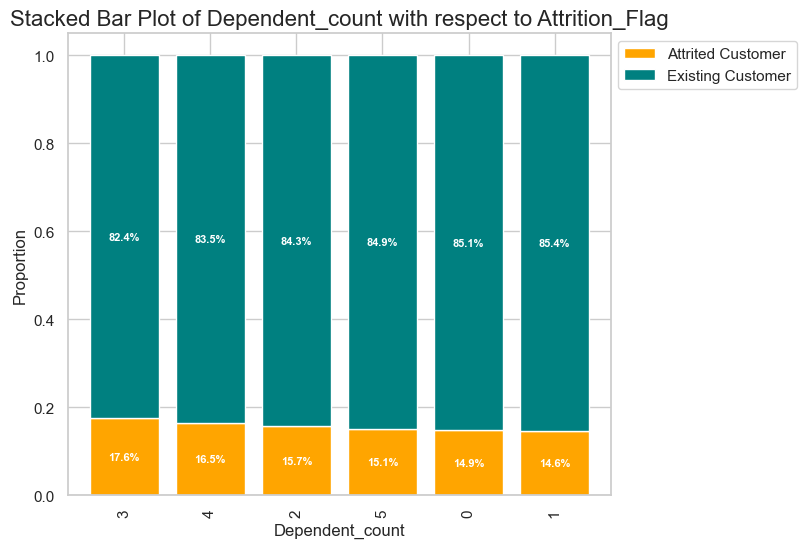

In [ ]:
# Dependent_count vs Attrition_Flag
categorical_predictors_vs_target(df, 'Dependent_count', 'Attrition_Flag')

### Dependent_count vs Attrition_Flag Observations:
- The **dependent count of 2** is the most popular, with **2,238 existing customers**.
- Customers with **three dependents** have the highest attrition rate at **17.64%**, indicating challenges in retention.
- The **"four dependents"** category follows closely with an attrition rate of **16.52%**, suggesting higher turnover.
- Customers with **zero dependents** show the lowest attrition rate at **14.93%**, indicating more stability.
- Higher dependent counts correlate with increased attrition, highlighting a risk factor for retention strategies.

## Credit_Limit vs Attrition_Flag

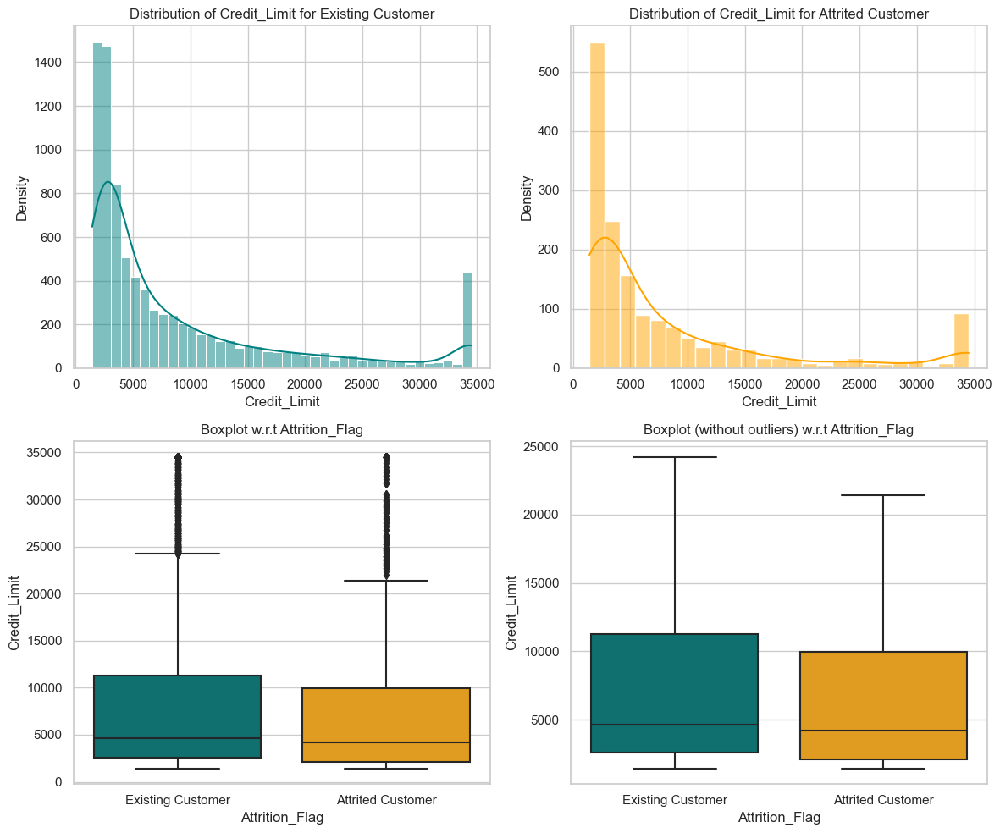

In [ ]:
# Credit_Limit vs Attrition_Flag
numerical_predictor_vs_target(df, 'Credit_Limit', 'Attrition_Flag')

### Credit_Limit vs Attrition_Flag Observations:
- **Average Credit Limit**: Existing customers have a higher average credit limit (Mean: 8726.88) than attrited customers (Mean: 8136.04).
- **Outlier Detection**: There are 794 outliers in existing customers and 173 in attrited customers.
- **Overall Distribution**: The overall average credit limit is 8631.95, with a median of 4549.00.
- **Range of Credit Limits**: Credit limits range from a minimum of 1438.30 to a maximum of 34516.00.

## Customer_Age vs Attrition_Flag

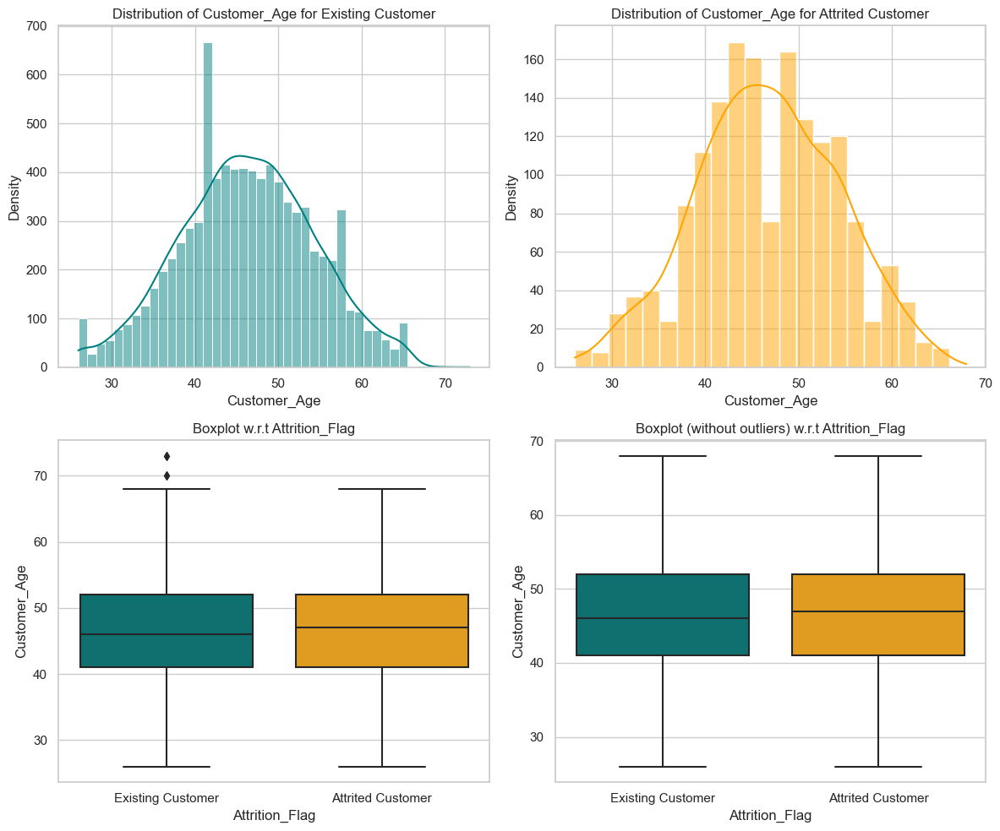

In [ ]:
# Customer_Age vs Attrition_Flag
numerical_predictor_vs_target(df, 'Customer_Age', 'Attrition_Flag')

### Customer_Age vs. Attrition_Flag Observations:
- **Average Age**: Existing customers have an average age of 46.26 years, while attrited customers have an average age of 46.66 years.
- **Age Range**: Both customer groups have the same minimum age of 26 years, with existing customers having a maximum age of 73 years, compared to 68 years for attrited customers.
- **Outlier Presence**: There are 2 outliers among existing customers, while there are no outliers in the attrited customer group.
- **Overall Statistics**: The overall average age across all customers is 46.33 years, with a median age of 46.00 years.

## Dependent_count vs Attrition_Flag

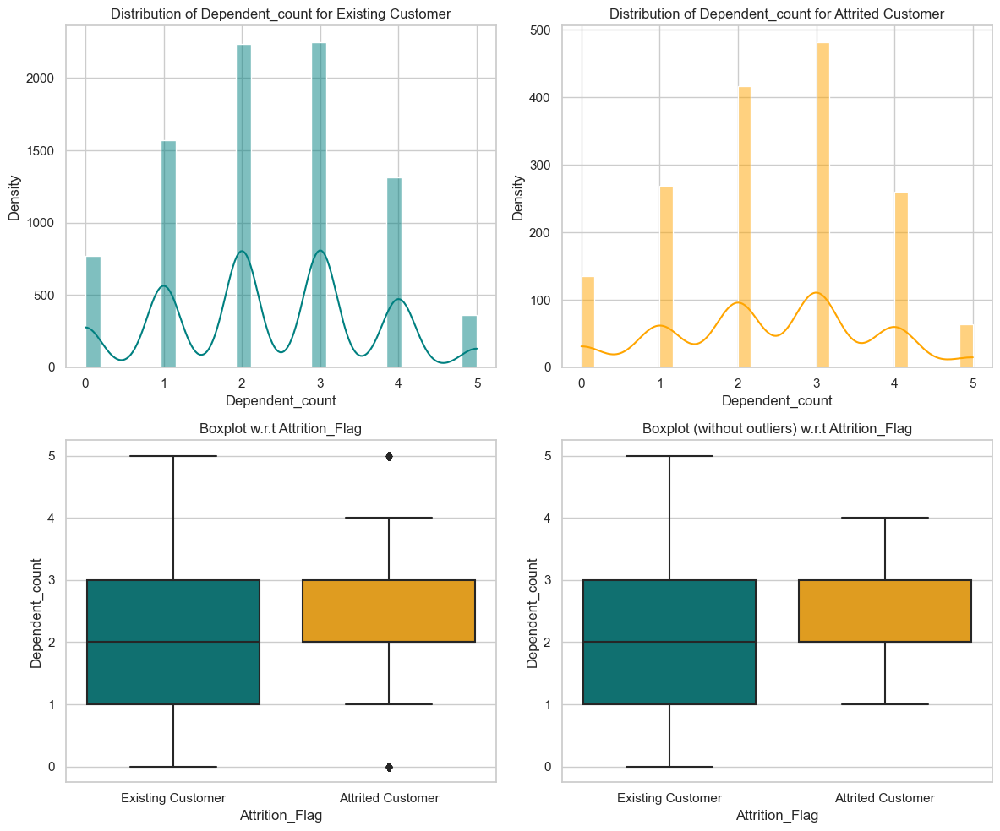

In [ ]:
# Dependent_count vs Attrition_Flag
numerical_predictor_vs_target(df, 'Dependent_count', 'Attrition_Flag')

### Dependent_count vs. Attrition_Flag Observations:
- **Average Dependents**: Existing customers have an average of 2.34 dependents, while attrited customers have a slightly higher average of 2.40 dependents.
- **Outlier Presence**: There are no outliers in the existing customer group, but the attrited customer group has 199 outliers.

## Months_on_book vs Attrition_Flag

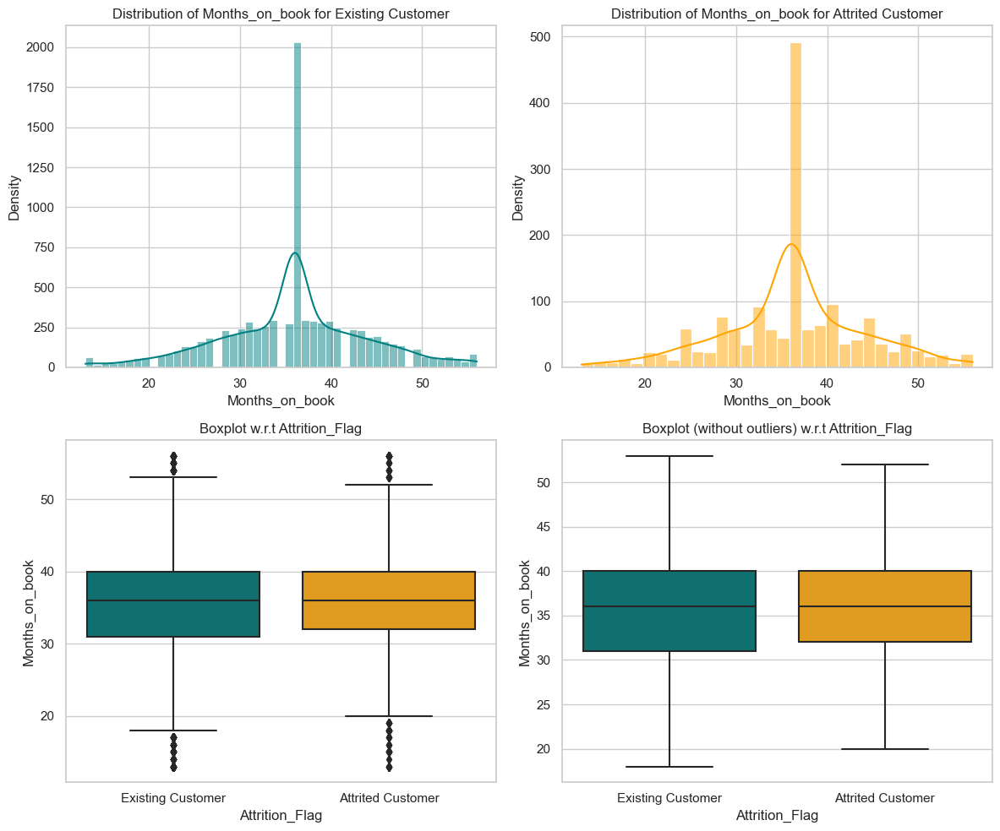

In [ ]:
# Months_on_book vs Attrition_Flag
numerical_predictor_vs_target(df, 'Months_on_book', 'Attrition_Flag')

### Months_on_book vs. Attrition_Flag Observations:
- **Average Duration**: Existing customers have an average tenure of 35.88 months, while attrited customers have a slightly longer average of 36.18 months.
- **Outlier Counts**: There are 335 outliers among existing customers compared to 77 outliers in the attrited customer group, indicating greater variability in the months on book for existing customers.
- **Total Customer Count**: The existing customer group consists of 8,500 members, while the attrited customer group includes 1,627 members.

## Total_Relationship_Count vs Attrition_Flag

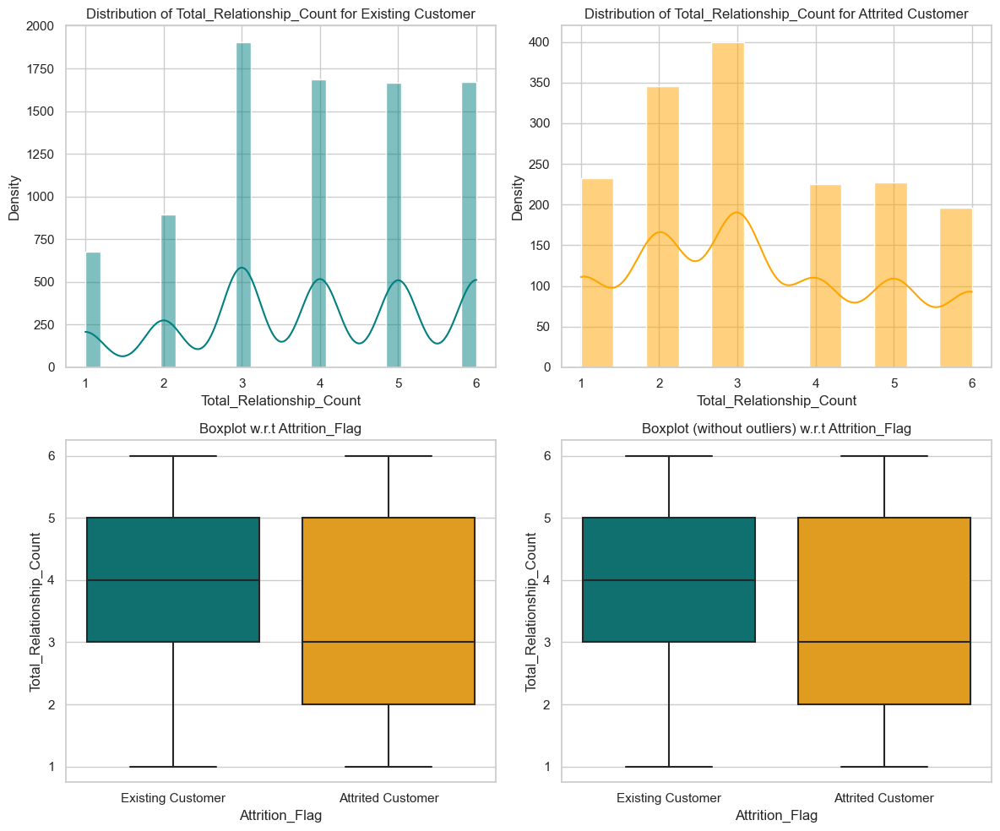

In [ ]:
# Total_Relationship_Count vs Attrition_Flag
numerical_predictor_vs_target(df, 'Total_Relationship_Count', 'Attrition_Flag')

### Total_Relationship_Count vs. Attrition_Flag Observations:
- **Average Relationships**: Existing customers maintain a higher average total relationship count of 3.91 compared to 3.28 for attrited customers.
- **Consistent Outlier Count**: Both customer groups show no outliers in total relationship count, indicating consistent relationship behavior among customers.

## Months_Inactive_12_mon vs Attrition_Flag

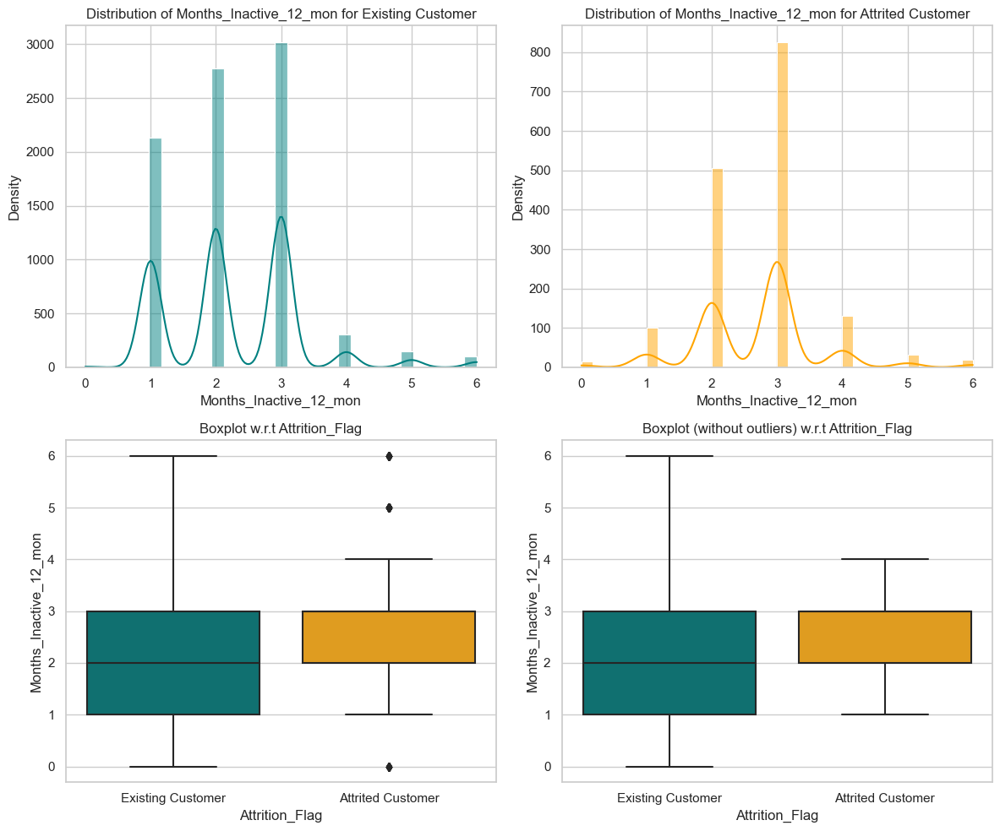

In [ ]:
# Months_Inactive_12_mon vs Attrition_Flag
numerical_predictor_vs_target(df, 'Months_Inactive_12_mon', 'Attrition_Flag')

### Months_Inactive_12_mon vs. Attrition_Flag Observations:
- **Average Inactivity**: Attrited customers have a higher average inactivity of 2.69 months compared to existing customers, who have an average of 2.27 months.
- **Outlier Presence**: There are 66 outliers among attrited customers, indicating some customers had significantly higher periods of inactivity compared to others.

## Contacts_Count_12_mon vs Attrition_Flag

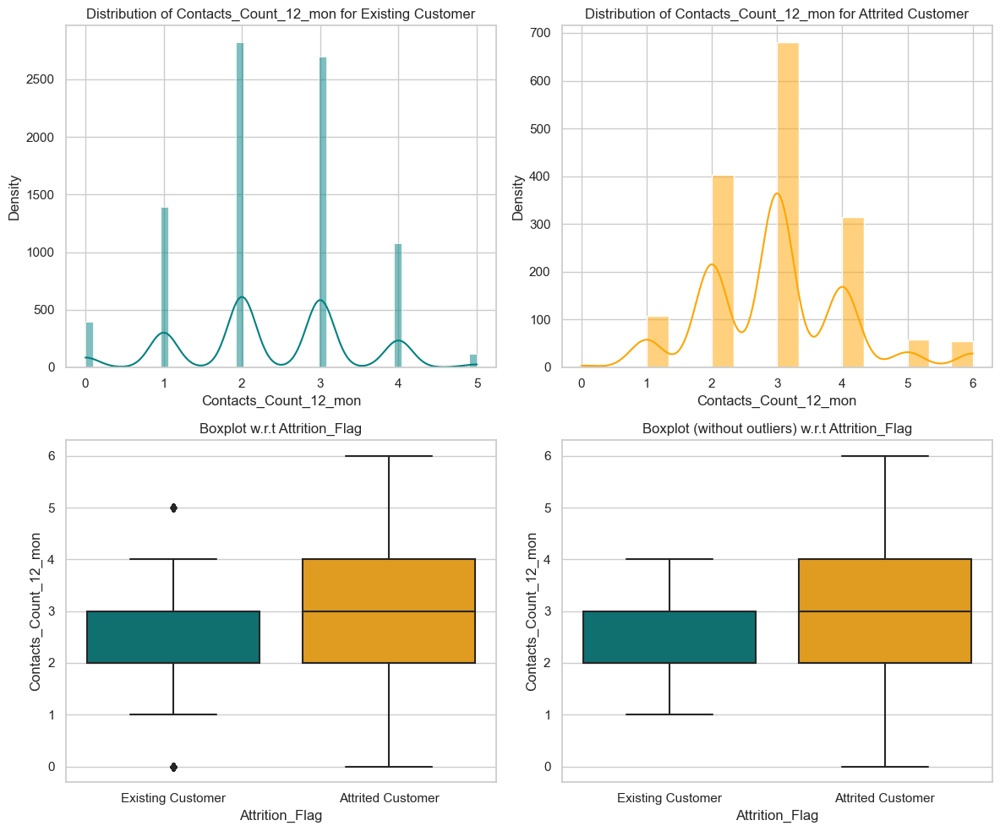

In [ ]:
# Contacts_Count_12_mon vs Attrition_Flag
numerical_predictor_vs_target(df, 'Contacts_Count_12_mon', 'Attrition_Flag')

### Contacts_Count_12_mon vs. Attrition_Flag Observations:
- **Average Contact Count**: Attrited customers have a higher average contact count of 2.97 compared to existing customers, who have an average of 2.36 contacts in the past year.
- **Outlier Detection**: There are 509 outliers among existing customers, indicating that some customers experienced significantly more contacts than the majority.

## Credit_Limit vs Attrition_Flag

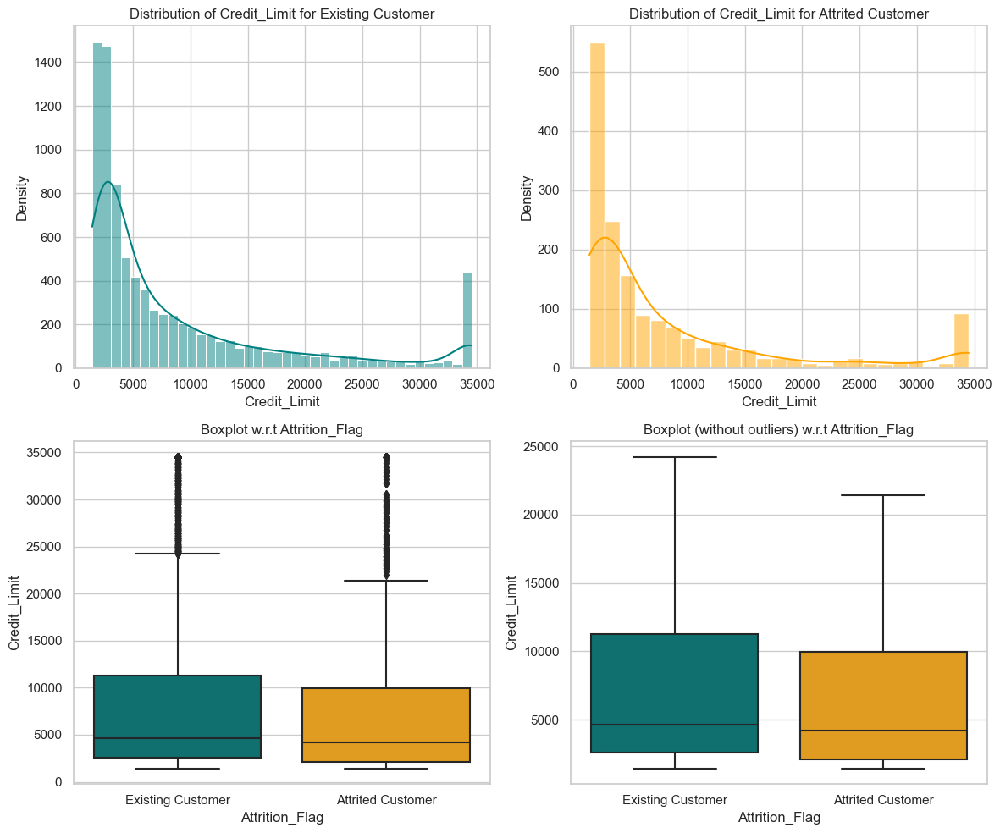

In [ ]:
# Credit_Limit vs Attrition_Flag
numerical_predictor_vs_target(df, 'Credit_Limit', 'Attrition_Flag')

### Credit_Limit vs. Attrition_Flag Observations:
- **Average Credit Limit**: Existing customers have a higher average credit limit (Mean: 8726.88) compared to attrited customers (Mean: 8136.04).
- **Outlier Count**: There are 794 outliers among existing customers and 173 among attrited customers, indicating variability in credit limits.

## Total_Revolving_Bal vs Attrition_Flag

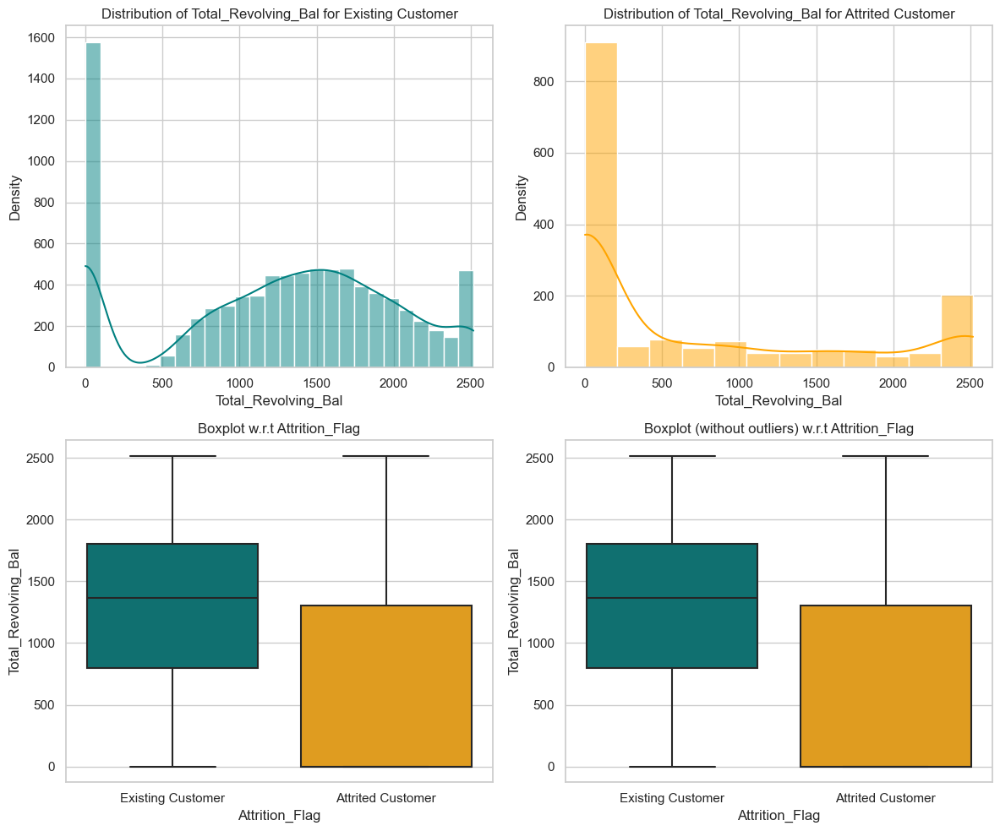

In [ ]:
# Total_Revolving_Bal vs Attrition_Flag
numerical_predictor_vs_target(df, 'Total_Revolving_Bal', 'Attrition_Flag')

### Total_Revolving_Bal vs. Attrition_Flag Observations:
- **Average Total Revolving Balance**: Existing customers have a significantly higher average total revolving balance (Mean: 1256.60) compared to attrited customers (Mean: 672.82).
- **Standard Deviation**: The standard deviation for existing customers (757.75) is lower than that for attrited customers (921.39), indicating that existing customers' balances are more consistent.

## Avg_Open_To_Buy vs Attrition_Flag

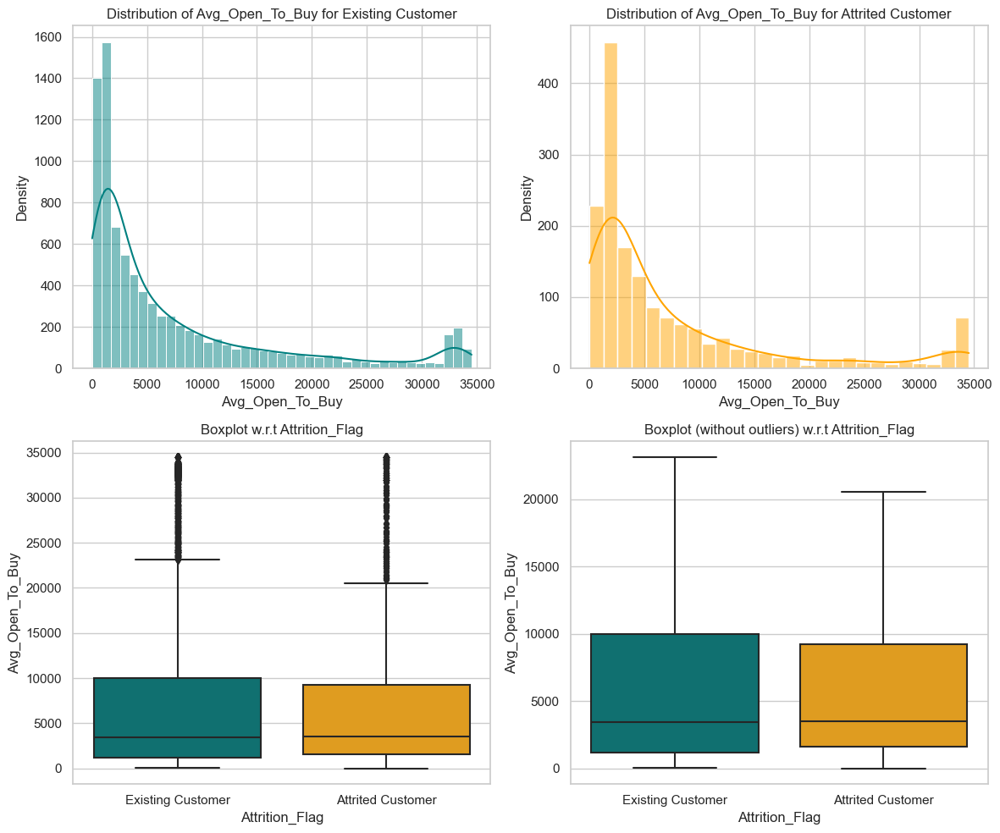

In [ ]:
# Avg_Open_To_Buy vs Attrition_Flag
numerical_predictor_vs_target(df, 'Avg_Open_To_Buy', 'Attrition_Flag')

### Avg_Open_To_Buy vs. Attrition_Flag Observations:
- **Outliers**: There are 778 outliers for existing customers and 178 for attrited customers.
- **Skewness**: Both groups show positive skewness, with more customers having lower open-to-buy amounts.
- **Distribution Similarity**: The distribution of open-to-buy amounts is similar for both groups, as reflected in the mean and standard deviation.
- **Overall Spread**: The overall spread ranges from 3.00 to 34516.00, indicating a wide variation in available credit.
- **Median Comparison**: The overall median (3474.00) is significantly lower than the means, highlighting the skewness.

## Total_Amt_Chng_Q4_Q1 vs Attrition_Flag

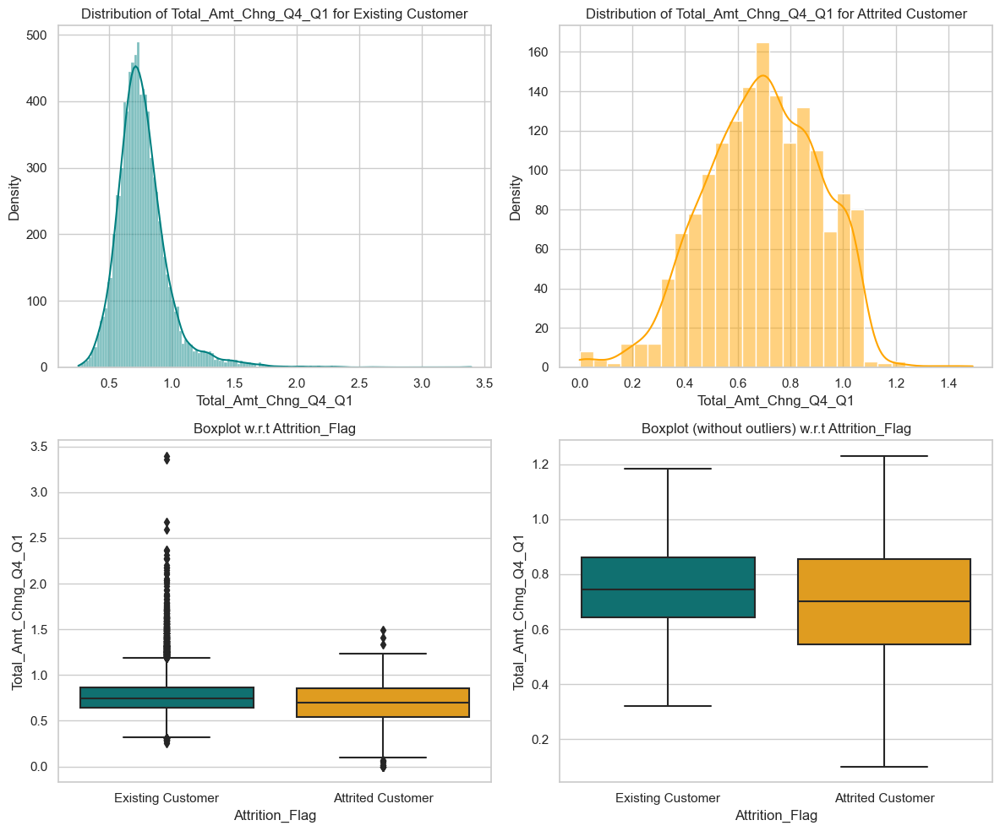

In [ ]:
# Total_Amt_Chng_Q4_Q1 vs Attrition_Flag
numerical_predictor_vs_target(df, 'Total_Amt_Chng_Q4_Q1', 'Attrition_Flag')

### Total_Amt_Chng_Q4_Q1 vs. Attrition_Flag Observations:
- **Outliers**: There are 378 outliers for existing customers and 14 for attrited customers.
- **Skewness**: Both distributions show slight positive skewness.
- **Mean Comparison**: Existing customers have a higher mean (0.77) compared to attrited customers (0.69).
- **Range**: The range for existing customers is wider (0.26 to 3.40) than for attrited customers (0.00 to 1.49).
- **Overall Distribution**: The overall median (0.74) is close to the mean, indicating a relatively symmetrical distribution for the combined data.

## Total_Trans_Amt vs Attrition_Flag

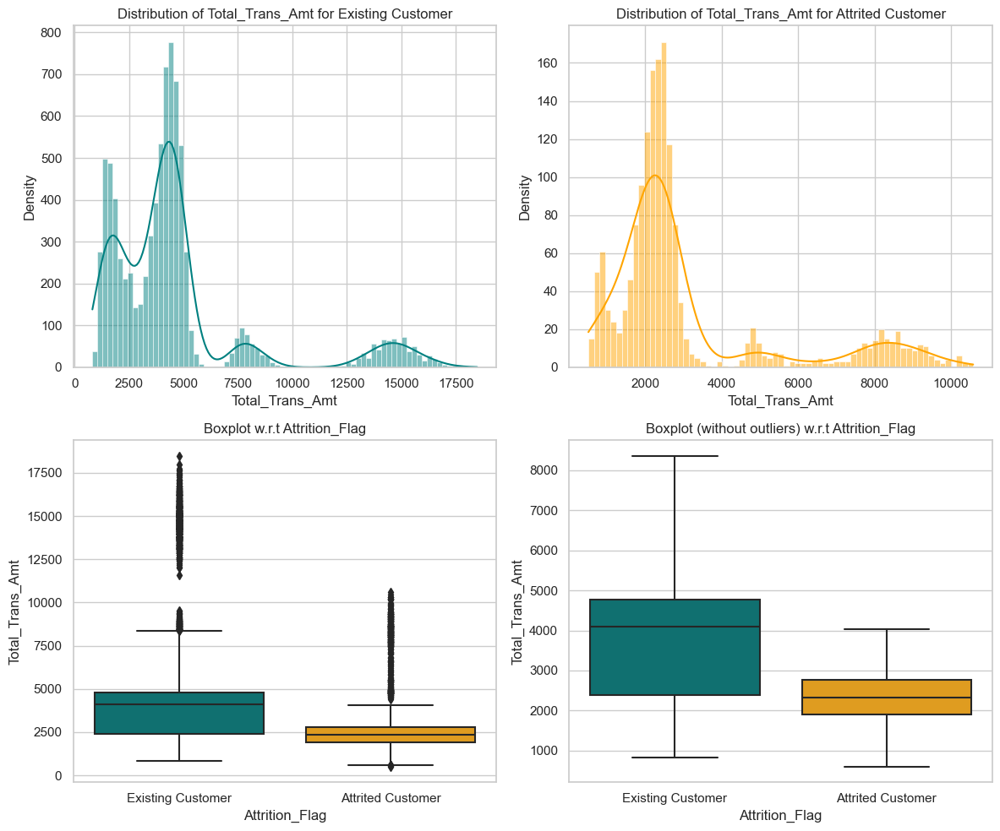

In [ ]:
# Total_Trans_Amt vs Attrition_Flag
numerical_predictor_vs_target(df, 'Total_Trans_Amt', 'Attrition_Flag')

### Total_Trans_Amt vs. Attrition_Flag Observations:
- **Outliers**: There are 849 outliers for existing customers and 315 for attrited customers.
- **Mean Comparison**: Existing customers have a significantly higher mean (4654.66) compared to attrited customers (3095.03).
- **Range**: The range for existing customers is wider (816.00 to 18484.00) than for attrited customers (510.00 to 10583.00).
- **Skewness**: Both distributions are positively skewed, with a longer tail on the higher end.
- **Overall Distribution**: The overall median (3899.00) is lower than the mean, indicating positive skewness in the combined data.

## Total_Trans_Ct vs Attrition_Flag

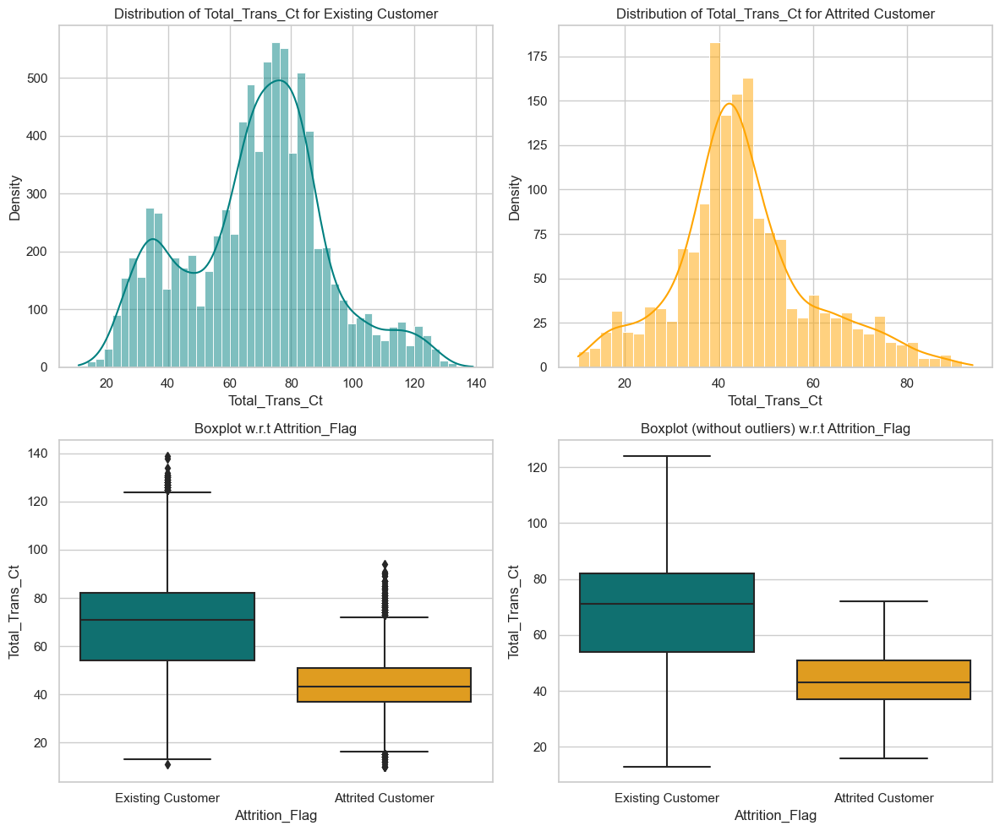

In [ ]:
# Total_Trans_Ct vs Attrition_Flag
numerical_predictor_vs_target(df, 'Total_Trans_Ct', 'Attrition_Flag')

### Total_Trans_Ct vs. Attrition_Flag Observations:
- **Outliers**: Existing customers have 66 outliers, while attrited customers have 124 outliers.
- **Mean Comparison**: Existing customers have a higher mean (68.67) compared to attrited customers (44.93).
- **Range**: Existing customers have a broader range (11 to 139) compared to attrited customers (10 to 94).
- **Skewness**: Both distributions show positive skewness, with longer tails on the higher end.
- **Overall Distribution**: The overall median (67) is close to the mean (64.86), indicating slight positive skewness in the combined data.

## Total_Ct_Chng_Q4_Q1 vs Attrition_Flag

In [ ]:
def numerical_var_predictor_vs_target(data, predictor, target):
    """
    Analyze the distribution of a numerical predictor with respect to the target variable.

    data: DataFrame
    predictor: str - name of the numerical predictor variable
    target: str - name of the target variable
    """
    fig, axs = plt.subplots(2, 2, figsize=(12, 10))

    target_uniq = data[target].unique()

    # Print summary statistics including outliers
    for unique_value in target_uniq:
        subset = data[data[target] == unique_value]
        count = subset[predictor].count()
        mean = subset[predictor].mean()
        std = subset[predictor].std()
        min_val = subset[predictor].min()
        max_val = subset[predictor].max()
        median = subset[predictor].median()
        skewness = subset[predictor].skew()

        # Outlier detection using IQR method
        Q1 = subset[predictor].quantile(0.25)
        Q3 = subset[predictor].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        outlier_condition = (subset[predictor] < lower_bound) | (subset[predictor] > upper_bound)
        outlier_count = subset[outlier_condition][predictor].count()
        # print(f"---{predictor} vs {target}")
        # print(f"--- Summary for {target}={unique_value} ---")
        # print(f"Count: {count}, Mean: {mean:.2f}, Std: {std:.2f}, Min: {min_val:.2f}, Max: {max_val:.2f}, Median: {median:.2f}, Skewness: {skewness:.2f}, Outliers: {outlier_count}\n")

    # Overall summary statistics
    overall_count = data[predictor].count()
    overall_mean = data[predictor].mean()
    overall_std = data[predictor].std()
    overall_min = data[predictor].min()
    overall_max = data[predictor].max()
    overall_median = data[predictor].median()
    overall_Q1 = data[predictor].quantile(0.25)
    overall_Q3 = data[predictor].quantile(0.75)
    overall_IQR = overall_Q3 - overall_Q1
    overall_skewness = data[predictor].skew()

    overall_lower_bound = overall_Q1 - 1.5 * overall_IQR
    overall_upper_bound = overall_Q3 + 1.5 * overall_IQR

    overall_outlier_condition = (data[predictor] < overall_lower_bound) | (data[predictor] > overall_upper_bound)
    total_outliers = data[overall_outlier_condition][predictor].count()

    # print("--- Overall Summary ---")
    # print(f"Total Count: {overall_count}, Overall Mean: {overall_mean:.2f}, Overall Std: {overall_std:.2f}, "
    #       f"Overall Min: {overall_min:.2f}, Overall Max: {overall_max:.2f}, "
    #       f"Overall Median: {overall_median:.2f}, Q1: {overall_Q1:.2f}, Q3: {overall_Q3:.2f}, Overall Skewness: {overall_skewness:.2f}, Total Outliers: {total_outliers}\n")

    # Histogram for existing customers
    axs[0, 0].set_title("Distribution of " + predictor + " for " + str(target_uniq[0]))
    sns.histplot(
        data=data[data[target] == target_uniq[0]],
        x=predictor,
        kde=True,
        ax=axs[0, 0],
        color="teal",
    )
    axs[0, 0].set_xlabel(predictor)
    axs[0, 0].set_ylabel("Density")

    # Histogram for attrited customers
    axs[0, 1].set_title("Distribution of " + predictor + " for " + str(target_uniq[1]))
    sns.histplot(
        data=data[data[target] == target_uniq[1]],
        x=predictor,
        kde=True,
        ax=axs[0, 1],
        color="orange",
    )
    axs[0, 1].set_xlabel(predictor)
    axs[0, 1].set_ylabel("Density")

    # Boxplot for both categories
    axs[1, 0].set_title("Boxplot w.r.t " + target)
    sns.boxplot(data=data, x=target, y=predictor, ax=axs[1, 0], palette={"Attrited Customer": "orange", "Existing Customer": "teal"})
    axs[1, 0].set_xlabel(target)
    axs[1, 0].set_ylabel(predictor)

    # Boxplot without outliers
    axs[1, 1].set_title("Boxplot (without outliers) w.r.t " + target)
    sns.boxplot(
        data=data,
        x=target,
        y=predictor,
        ax=axs[1, 1],
        showfliers=False,
        palette={"Attrited Customer": "orange", "Existing Customer": "teal"},
    )
    axs[1, 1].set_xlabel(target)
    axs[1, 1].set_ylabel(predictor)

    plt.tight_layout()
    plt.show()

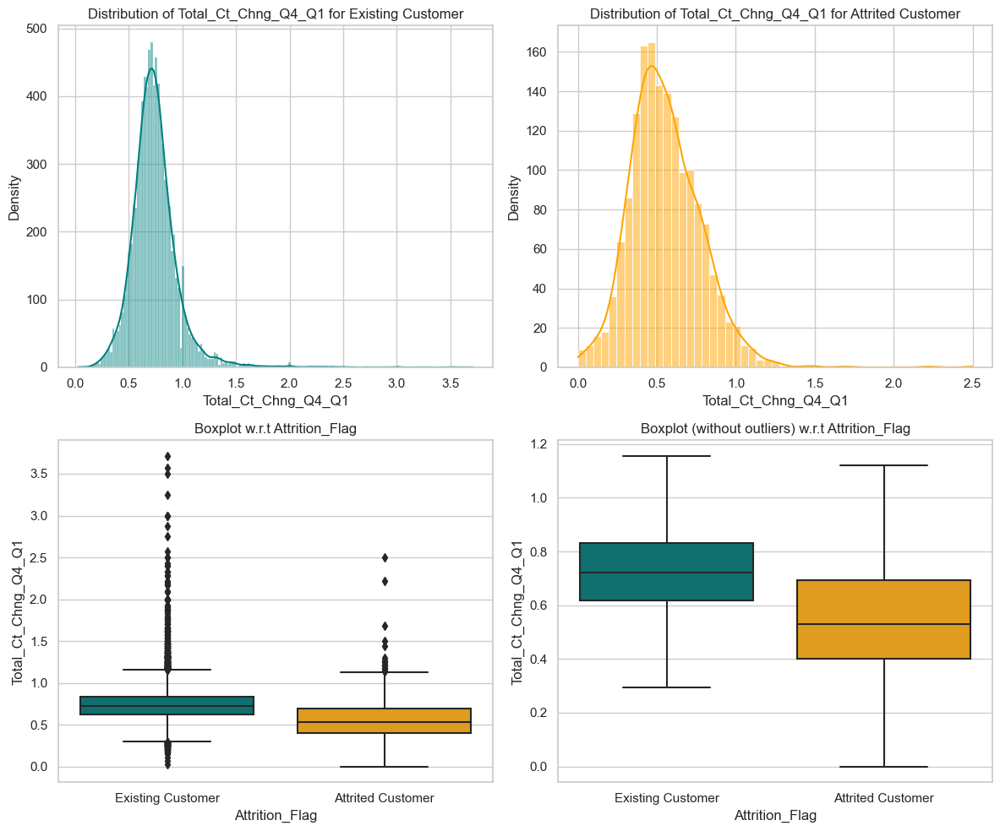

In [ ]:
# Total_Ct_Chng_Q4_Q1 vs Attrition_Flag
numerical_predictor_vs_target(df, 'Total_Ct_Chng_Q4_Q1', 'Attrition_Flag')

### Total_Ct_Chng_Q4_Q1 vs. Attrition_Flag Observations:

- **Outliers**: Existing customers have 375 outliers, while attrited customers have 17 outliers.
- **Mean Comparison**: Existing customers have a higher mean (0.74) compared to attrited customers (0.55).
- **Range**: Existing customers have a broader range (0.03 to 3.71) compared to attrited customers (0.00 to 2.50).
- **Skewness**: Both distributions show positive skewness, with longer tails on the higher end.
- **Overall Distribution**: The overall median (0.70) is close to the mean (0.71), indicating slight positive skewness in the combined data.

## Avg_Utilization_Ratio vs Attrition_Flag

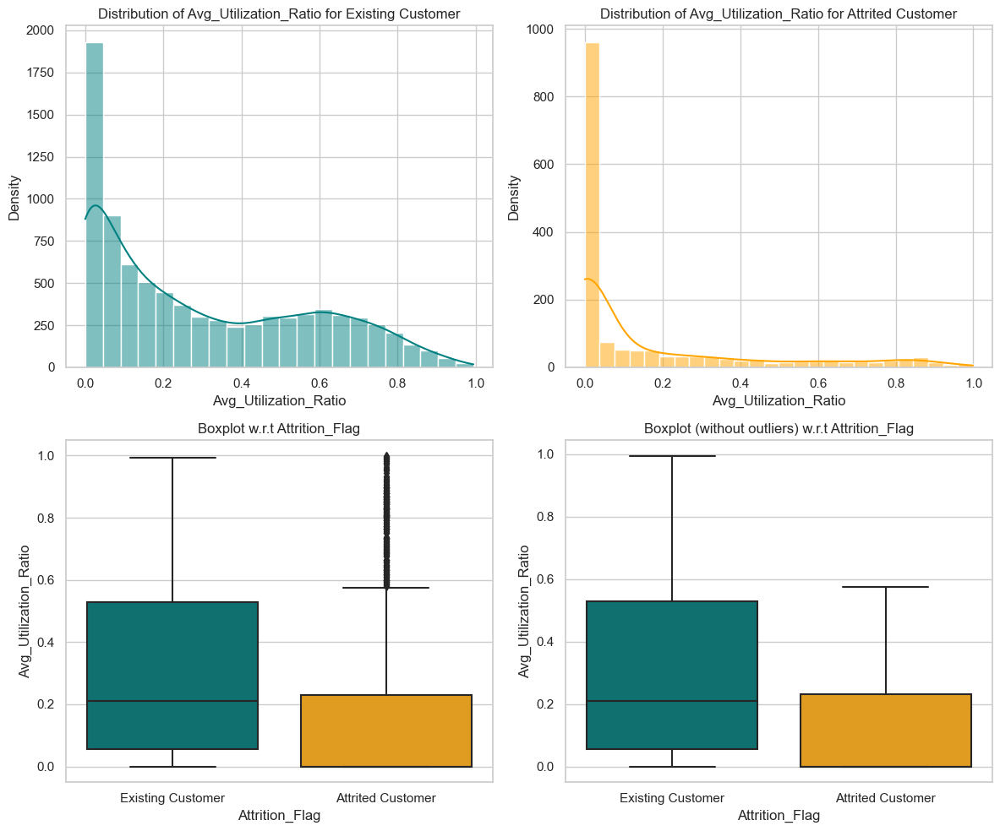

In [ ]:
# Avg_Utilization_Ratio vs Attrition_Flag
numerical_predictor_vs_target(df, 'Avg_Utilization_Ratio', 'Attrition_Flag')

### Avg_Utilization_Ratio vs. Attrition_Flag Observations:

- **Outliers**: Existing customers have 0 outliers, while attrited customers have 194 outliers.
- **Mean Comparison**: Existing customers have a higher mean (0.30) compared to attrited customers (0.16).
- **Range**: Both existing and attrited customers have a similar range (0.00 to 1.00).
- **Skewness**: Attrited customers show higher positive skewness (1.63) compared to existing customers (0.60).
- **Overall Distribution**: The overall median (0.18) is lower than the mean (0.27), indicating slight positive skewness in the combined data.

## Continued bivariate analysis

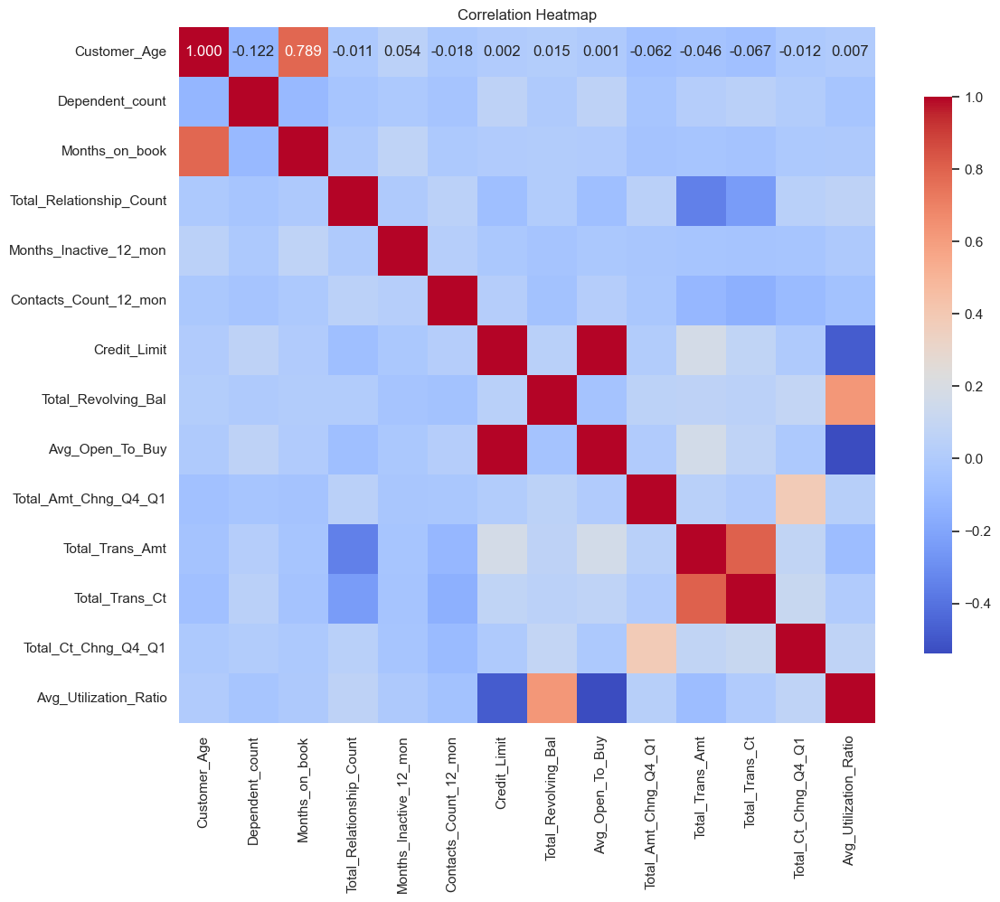

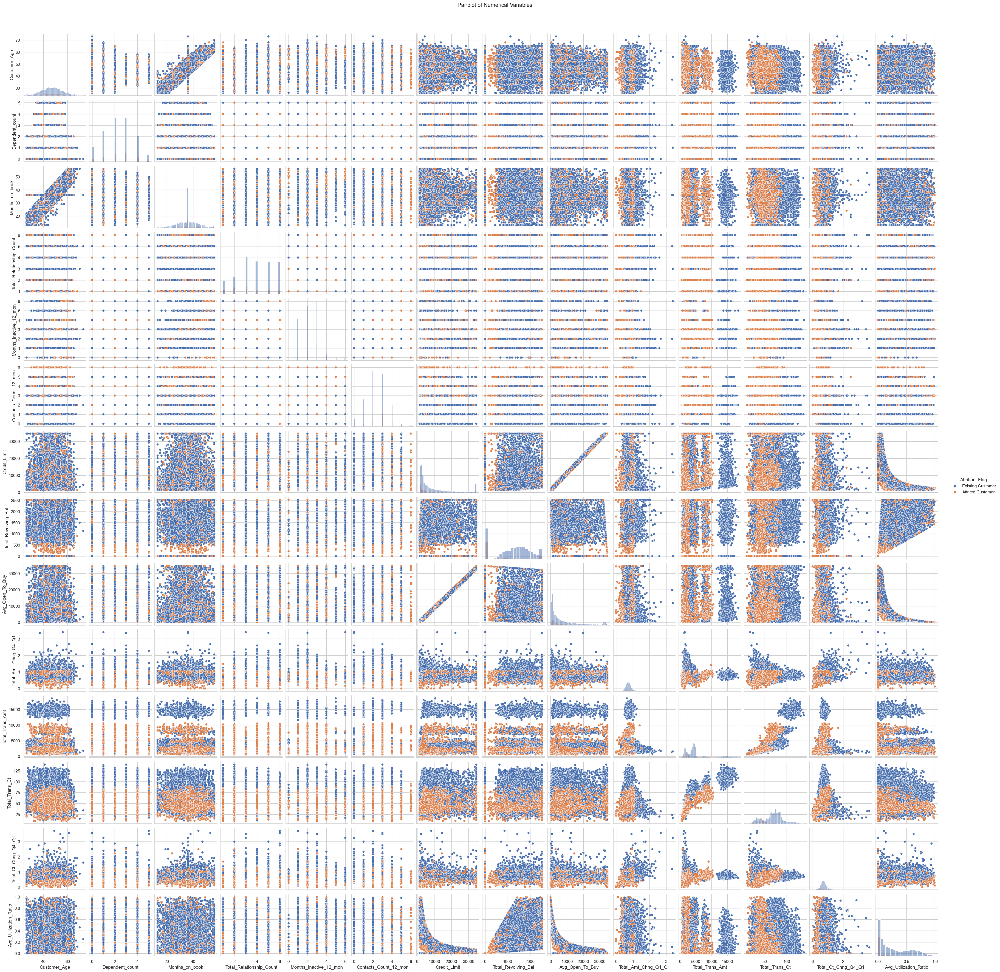

In [ ]:
# Selecting numerical columns
numerical_columns = df.select_dtypes(include=['int64', 'float64']).columns

# Calculating the correlation matrix
correlation_matrix = df[numerical_columns].corr()

# Creating the heatmap
plt.figure(figsize=(14, 10))
sns.heatmap(correlation_matrix, annot=True, fmt=".3f", cmap='coolwarm', square=True, cbar_kws={"shrink": .8})
plt.title('Correlation Heatmap')
plt.show()

# Creating the pairplot
sns.pairplot(df, hue = 'Attrition_Flag' , diag_kind='hist')
plt.suptitle('Pairplot of Numerical Variables', y=1.02)
plt.show()


## Correlations of Numerical Variables:
1. **Credit Limit and Avg Open to Buy**: A very high positive correlation (0.996) between `Credit_Limit` and `Avg_Open_To_Buy` indicates that as the credit limit increases, the average amount open to buy also increases significantly. One of these variable will be removed to avoid redundancy.

2. **Total Trans Count and Total Trans Amount**: There is a strong positive correlation (0.807) between `Total_Trans_Ct` and `Total_Trans_Amt`, indicating that the number of transactions is positively associated with the total transaction amount. One of these variable will be removed to avoid redundancy.

3. **Customer Age and Months on Book**: There is a strong positive correlation (0.79) between `Customer_Age` and `Months_on_book`, suggesting that older customers tend to have been with the bank longer.

4. **Avg Utilization Ratio**: This variable has a strong negative correlation with both `Credit_Limit` (-0.483) and `Avg_Open_To_Buy` (-0.539). This suggests that as the utilization ratio increases, the credit limit and average open to buy decrease, which is consistent with the idea that higher utilization indicates a higher reliance on credit.

5. **Total Relationship Count and Total Trans Amount**: There is a strong negative correlation (-0.347) between `Total_Relationship_Count` and `Total_Trans_Amt`, suggesting that customers with fewer relationships tend to have higher transaction amounts.


## Categorical Vs Numerical Variables Data Analysis

In [ ]:
categorical_vars = ['Gender', 'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category']
numerical_vars = [
    'Customer_Age', 'Dependent_count', 'Months_on_book',
    'Total_Relationship_Count', 'Months_Inactive_12_mon',
    'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
    'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
    'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'
]

# Conduct ANOVA for each combination of categorical and numerical variables
for cat_var in categorical_vars:
    print(f"\nANOVA Results for '{cat_var}':")
    print("-----------------------------------")
    for num_var in numerical_vars:
        # Prepare the groups for the ANOVA test
        groups = [group[num_var].dropna() for name, group in df.groupby(cat_var)]

        # Perform ANOVA
        f_statistic, p_value = stats.f_oneway(*groups)

        # Determine significance
        if p_value < 0.05:
            significance = f"=> Significant relationship."
        else:
            significance = f"=> No significant relationship."

        # Print results
        print(f"Numerical Variable: {num_var}")
        print(f"F-Statistic: {f_statistic:.4f}, p-value: {p_value:.4f} {significance}\n")




ANOVA Results for 'Gender':
-----------------------------------
Numerical Variable: Customer_Age
F-Statistic: 3.0353, p-value: 0.0815 => No significant relationship.

Numerical Variable: Dependent_count
F-Statistic: 0.2108, p-value: 0.6462 => No significant relationship.

Numerical Variable: Months_on_book
F-Statistic: 0.4583, p-value: 0.4984 => No significant relationship.

Numerical Variable: Total_Relationship_Count
F-Statistic: 0.1009, p-value: 0.7507 => No significant relationship.

Numerical Variable: Months_Inactive_12_mon
F-Statistic: 1.2619, p-value: 0.2613 => No significant relationship.

Numerical Variable: Contacts_Count_12_mon
F-Statistic: 16.2153, p-value: 0.0001 => Significant relationship.

Numerical Variable: Credit_Limit
F-Statistic: 2178.7165, p-value: 0.0000 => Significant relationship.

Numerical Variable: Total_Revolving_Bal
F-Statistic: 8.9140, p-value: 0.0028 => Significant relationship.

Numerical Variable: Avg_Open_To_Buy
F-Statistic: 2144.3564, p-value: 0.00

### Significant Observations from ANOVA Results

- **Gender and Contacts_Count_12_mon**:
  - F-Statistic: 16.2153, p-value: 0.0001 => Significant relationship.

- **Gender and Credit_Limit**:
  - F-Statistic: 2178.7165, p-value: 0.0000 => Significant relationship.

- **Gender and Total_Revolving_Bal**:
  - F-Statistic: 8.9140, p-value: 0.0028 => Significant relationship.

- **Gender and Avg_Open_To_Buy**:
  - F-Statistic: 2144.3564, p-value: 0.0000 => Significant relationship.

- **Gender and Total_Amt_Chng_Q4_Q1**:
  - F-Statistic: 7.2295, p-value: 0.0072 => Significant relationship.

- **Gender and Total_Trans_Amt**:
  - F-Statistic: 6.2765, p-value: 0.0123 => Significant relationship.

- **Gender and Total_Trans_Ct**:
  - F-Statistic: 46.2791, p-value: 0.0000 => Significant relationship.

- **Gender and Avg_Utilization_Ratio**:
  - F-Statistic: 721.1270, p-value: 0.0000 => Significant relationship.

- **Education_Level and Customer_Age**:
  - F-Statistic: 2.5977, p-value: 0.0236 => Significant relationship.

- **Marital_Status and Customer_Age**:
  - F-Statistic: 14.4841, p-value: 0.0000 => Significant relationship.

- **Marital_Status and Dependent_count**:
  - F-Statistic: 5.2366, p-value: 0.0053 => Significant relationship.

- **Marital_Status and Months_on_book**:
  - F-Statistic: 6.3301, p-value: 0.0018 => Significant relationship.

- **Marital_Status and Credit_Limit**:
  - F-Statistic: 14.2952, p-value: 0.0000 => Significant relationship.

- **Marital_Status and Total_Revolving_Bal**:
  - F-Statistic: 8.6357, p-value: 0.0002 => Significant relationship.

- **Marital_Status and Avg_Open_To_Buy**:
  - F-Statistic: 16.1954, p-value: 0.0000 => Significant relationship.

- **Income_Category and Customer_Age**:
  - F-Statistic: 4.6453, p-value: 0.0003 => Significant relationship.

- **Income_Category and Credit_Limit**:
  - F-Statistic: 3.5762, p-value: 0.0005 => Significant relationship.

- **Income_Category and Total_Revolving_Bal**:
  - F-Statistic: 2.8968, p-value: 0.0189 => Significant relationship.

- **Income_Category and Avg_Open_To_Buy**:
  - F-Statistic: 3.1183, p-value: 0.0061 => Significant relationship.

- **Income_Category and Avg_Utilization_Ratio**:
  - F-Statistic: 7.2976, p-value: 0.0006 => Significant relationship.

- **Income_Category and Total_Trans_Amt**:
  - F-Statistic: 4.8684, p-value: 0.0019 => Significant relationship.

- **Income_Category and Total_Trans_Ct**:
  - F-Statistic: 5.2493, p-value: 0.0014 => Significant relationship.

## Data Pre-processing

###1. Prepare the Data for Analysis

In [ ]:
#Create a copy of the original DataFrame to avoid modifying it directly.
df_processed = df_original.copy()

### Removing Features with High Correlation

Removing features with high correlation is essential to reduce redundancy in the dataset. Highly correlated features provide similar information, which can lead to overfitting, increased model complexity, and longer training times. By eliminating redundant features, we can enhance the model's performance and interpretability while maintaining essential information.

We need to remove `Total_Trans_Ct` and `Avg_Open_To_Buy` because:

1. **Total_Trans_Ct**: It is highly correlated with `Total_Trans_Amt` (correlation of 0.80817), indicating redundancy. Keeping both may not add significant value to the model and could lead to overfitting.

2. **Avg_Open_To_Buy**: It has an extremely high correlation with `Credit_Limit` (correlation of 0.99604), suggesting that they provide similar information. Retaining both could unnecessarily complicate the model without improving its performance.

In [ ]:
df_updated = df_new.copy()
# Dropping one feature from each pair based on high correlation
df_updated.drop(columns=['Total_Trans_Ct', 'Avg_Open_To_Buy'], inplace=True)

# Display the updated DataFrame
print(df_updated.shape)
print(df_updated.columns)

(10127, 18)
Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1',
       'Avg_Utilization_Ratio'],
      dtype='object')


### 2. Split the Data into Train, Validation, and Test Sets
- Split the data into training, validation, and test sets before any preprocessing steps to avoid data leakage

In [ ]:
# Split the data into features and target
# Features (X) and target variable (y)
df=df_updated.copy()
X = df.drop('Attrition_Flag', axis=1)  # Features
y = df['Attrition_Flag']  # Target variable

# Split into training and test sets (70% train, 30% test)
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# Split the temporary set into validation and test sets (50% of the temp set for each)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp)

print(X_train.shape, X_val.shape, X_test.shape)


(7088, 17) (1519, 17) (1520, 17)


In [ ]:
# Checking class balance
print("Target value ratio in y")
print(y.value_counts(normalize=True))
print("*" * 80)
print("Target value ratio in y_train")
print(y_train.value_counts(normalize=True))
print("*" * 80)
print("Target value ratio in y_val")
print(y_val.value_counts(normalize=True))
print("*" * 80)
print("Target value ratio in y_test")
print(y_test.value_counts(normalize=True))
print("*" * 80)

Target value ratio in y
Attrition_Flag
Existing Customer    0.83934
Attrited Customer    0.16066
Name: proportion, dtype: float64
********************************************************************************
Target value ratio in y_train
Attrition_Flag
Existing Customer    0.839306
Attrited Customer    0.160694
Name: proportion, dtype: float64
********************************************************************************
Target value ratio in y_val
Attrition_Flag
Existing Customer    0.839368
Attrited Customer    0.160632
Name: proportion, dtype: float64
********************************************************************************
Target value ratio in y_test
Attrition_Flag
Existing Customer    0.839474
Attrited Customer    0.160526
Name: proportion, dtype: float64
********************************************************************************


### Data Observations on Target Value Ratios

- The proportion of **Existing Customers** is consistently high across all datasets, ranging from approximately **83.93%** in the entire dataset to **83.95%** in the test set, indicating a significant ***class imbalance*** towards the **Existing Customer** category.

- The percentage of **Attrited Customers** remains relatively stable as well, hovering around **16.06%** to **16.07%** across the training, validation, and test sets, suggesting that the stratified sampling method effectively maintains the class distribution throughout the splits.

## Missing Value Treatment




**Identifying columns with missing values**

In [ ]:
# Check for missing values in each split and count 'abc' in Income_Category
missing_values_summary = {
    "Training Set": X_train.isnull().sum(),
    "Validation Set": X_val.isnull().sum(),
    "Test Set": X_test.isnull().sum(),
}

abc_count = {
    "Training Set": (X_train['Income_Category'] == 'abc').sum(),
    "Validation Set": (X_val['Income_Category'] == 'abc').sum(),
    "Test Set": (X_test['Income_Category'] == 'abc').sum()
}

# Print non-zero counts for missing values
print("\nNon-Zero Missing Values Count\n:")
for set_name, missing_values in missing_values_summary.items():
    non_zero_missing = missing_values[missing_values > 0]
    if not non_zero_missing.empty:
        print(f"{set_name}:")
        print(non_zero_missing)
        print()  # Add a line for better readability

# Print 'abc' counts
print("'abc' Count in Income_Category:")
for set_name, count in abc_count.items():
    if count > 0:
        print(f"{set_name}: {count}")
        print()  # Add a line for better readability



Non-Zero Missing Values Count
:
Training Set:
Education_Level    1083
Marital_Status      532
dtype: int64

Validation Set:
Education_Level    221
Marital_Status     107
dtype: int64

Test Set:
Education_Level    215
Marital_Status     110
dtype: int64

'abc' Count in Income_Category:
Training Set: 761

Validation Set: 197

Test Set: 154



### Summary of Missing Values:
- **Education_Level**
  - Training Set: 1083 missing values
  - Validation Set: 221 missing values
  - Test Set: 215 missing values

- **Marital_Status**
  - Training Set: 532 missing values
  - Validation Set: 107 missing values
  - Test Set: 110 missing values

### 'abc' Count in Income_Category:
- Training Set: 761
- Validation Set: 197
- Test Set: 154

### Missing Values Imputation Strategy

We will employ the following strategies for imputing missing values in our dataset:

- **Education_Level and Marital_Status:** Missing values in these columns will be imputed with the mode of their respective columns, ensuring that we retain the most common values.
  
- **Income_Category:** We will first replace any occurrences of 'abc' with `NaN`. Subsequently, we will impute these missing values using the mode for each dataset (training, validation, and test), allowing for a more accurate representation of income categories.

In [ ]:
# Replace 'abc' with NaN in the Income_Category column for all datasets
X_train['Income_Category'].replace('abc', np.nan, inplace=True)
X_val['Income_Category'].replace('abc', np.nan, inplace=True)
X_test['Income_Category'].replace('abc', np.nan, inplace=True)

# Impute missing values with the mode for Education_Level, Marital_Status, and Income_Category
for column in ['Education_Level', 'Marital_Status', 'Income_Category']:
    # Impute in the training set
    mode_value_train = X_train[column].mode()[0]
    X_train[column].fillna(mode_value_train, inplace=True)

    # Impute in the validation set
    mode_value_val = X_val[column].mode()[0]
    X_val[column].fillna(mode_value_val, inplace=True)

    # Impute in the test set
    mode_value_test = X_test[column].mode()[0]
    X_test[column].fillna(mode_value_test, inplace=True)

# Verify the imputation
missing_values_summary = {
    "Training Set": X_train.isnull().sum(),
    "Validation Set": X_val.isnull().sum(),
    "Test Set": X_test.isnull().sum()
}
missing_values_df = pd.DataFrame(missing_values_summary)
print("\nSummary of Missing Values After Imputation:\n", missing_values_df)



Summary of Missing Values After Imputation:
                           Training Set  Validation Set  Test Set
Customer_Age                         0               0         0
Gender                               0               0         0
Dependent_count                      0               0         0
Education_Level                      0               0         0
Marital_Status                       0               0         0
Income_Category                      0               0         0
Card_Category                        0               0         0
Months_on_book                       0               0         0
Total_Relationship_Count             0               0         0
Months_Inactive_12_mon               0               0         0
Contacts_Count_12_mon                0               0         0
Credit_Limit                         0               0         0
Total_Revolving_Bal                  0               0         0
Total_Amt_Chng_Q4_Q1                 0      

## Outlier Treatment

In [ ]:
# Function to detect outliers in numerical columns
def detect_outliers(df):
    # Select only numerical columns
    numerical_columns = df.select_dtypes(include=['number']).columns
    outlier_columns = []

    for column in numerical_columns:
        # Calculate Q1 (25th percentile) and Q3 (75th percentile)
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        # Define outlier bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Detect outliers
        outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
        if not outliers.empty:
            outlier_columns.append(column)

    return outlier_columns

# Detect outliers in each dataset
train_outliers = detect_outliers(X_train)
val_outliers = detect_outliers(X_val)
test_outliers = detect_outliers(X_test)

# Display the results
print(f"Number of numerical columns with outliers in the training set: {len(train_outliers)}")
print(f"Columns: {train_outliers}\n")

print(f"Number of numerical columns with outliers in the validation set: {len(val_outliers)}")
print(f"Columns: {val_outliers}\n")

print(f"Number of numerical columns with outliers in the test set: {len(test_outliers)}")
print(f"Columns: {test_outliers}\n")

# Print the shapes of the datasets
print("Shapes of the datasets:")
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"X_test shape: {X_test.shape}")

Number of numerical columns with outliers in the training set: 8
Columns: ['Customer_Age', 'Months_on_book', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1']

Number of numerical columns with outliers in the validation set: 7
Columns: ['Months_on_book', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1']

Number of numerical columns with outliers in the test set: 7
Columns: ['Months_on_book', 'Months_Inactive_12_mon', 'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt', 'Total_Ct_Chng_Q4_Q1']

Shapes of the datasets:
X_train shape: (7088, 17)
X_val shape: (1519, 17)
X_test shape: (1520, 17)


**Decision to Retain Outliers:**
- After careful consideration, I have decided to retain the identified outliers in the dataset as they appear to be legitimate records rather than errors.

## Ordinal Encoding

Ordinal encoding is necessary for the `Education_Level` and `Income_Category` variables to convert categorical text data into numerical formats that machine learning algorithms can effectively process. This transformation preserves the inherent order of education levels and income categories, allowing the model to interpret them as distinct categories with meaningful rankings. By encoding these features, the model can utilize them more effectively for predicting customer attrition.

In [ ]:
# Create mapping dictionaries for manual encoding
education_mapping = {
    'Uneducated': 0,
    'High School': 1,
    'College': 2,
    'Graduate': 3,
    'Post-Graduate': 4,
    'Doctorate': 5
}

income_mapping = {
    'Less than $40K': 0,
    '$40K - $60K': 1,
    '$60K - $80K': 2,
    '$80K - $120K': 3,
    '$120K +': 4
    # 'abc' should not be included as it's already imputed
}

# Apply the mapping to the Education_Level column
X_train['Education_Level'] = X_train['Education_Level'].map(education_mapping)
X_val['Education_Level'] = X_val['Education_Level'].map(education_mapping)
X_test['Education_Level'] = X_test['Education_Level'].map(education_mapping)

# Apply the mapping to the Income_Category column
X_train['Income_Category'] = X_train['Income_Category'].map(income_mapping)
X_val['Income_Category'] = X_val['Income_Category'].map(income_mapping)
X_test['Income_Category'] = X_test['Income_Category'].map(income_mapping)

# Verify the updated mappings
print("Education Level Mapping after manual encoding:")
print(education_mapping)

print("\nIncome Category Mapping after manual encoding:")
print(income_mapping)


Education Level Mapping after manual encoding:
{'Uneducated': 0, 'High School': 1, 'College': 2, 'Graduate': 3, 'Post-Graduate': 4, 'Doctorate': 5}

Income Category Mapping after manual encoding:
{'Less than $40K': 0, '$40K - $60K': 1, '$60K - $80K': 2, '$80K - $120K': 3, '$120K +': 4}


In [ ]:
# Check the unique values in the Education_Level and Income_Category columns for each dataset
unique_values_train_education = X_train['Education_Level'].unique()
unique_values_val_education = X_val['Education_Level'].unique()
unique_values_test_education = X_test['Education_Level'].unique()

unique_values_train_income = X_train['Income_Category'].unique()
unique_values_val_income = X_val['Income_Category'].unique()
unique_values_test_income = X_test['Income_Category'].unique()

# Output the unique values for Education_Level
print("Unique values in Training set Education_Level:", unique_values_train_education)
print("Unique values in Validation set Education_Level:", unique_values_val_education)
print("Unique values in Test set Education_Level:", unique_values_test_education)

# Output the unique values for Income_Category
print("Unique values in Training set Income_Category:", unique_values_train_income)
print("Unique values in Validation set Income_Category:", unique_values_val_income)
print("Unique values in Test set Income_Category:", unique_values_test_income)

# Print the shapes of the datasets
print()
print("Shapes of the datasets:")
print(f"X_train shape: {X_train.shape}")
print(f"X_val shape: {X_val.shape}")
print(f"X_test shape: {X_test.shape}")


Unique values in Training set Education_Level: [3 0 1 2 5 4]
Unique values in Validation set Education_Level: [1 3 4 0 2 5]
Unique values in Test set Education_Level: [2 3 1 5 0 4]
Unique values in Training set Income_Category: [3 0 1 4 2]
Unique values in Validation set Income_Category: [1 0 4 3 2]
Unique values in Test set Income_Category: [1 2 3 4 0]

Shapes of the datasets:
X_train shape: (7088, 17)
X_val shape: (1519, 17)
X_test shape: (1520, 17)


### One-Hot Encoding

One-hot encoding is a crucial technique used to transform nominal categorical variables in our dataset—such as `Gender`, `Marital_Status`, `Income_Category`, and `Card_Category`—into a numerical format that machine learning algorithms can effectively process. This method generates distinct binary columns for each category, where a value of `1` indicates the presence of that category and `0` signifies its absence. By applying one-hot encoding, we ensure that the model does not mistakenly interpret these nominal variables as having an inherent order, preserving the integrity of the data.

Identifying Categorical Variables for each data set:

In [ ]:
# Identify all categorical columns in the DataFrame
categorical_cols = X_train.select_dtypes(include=['object', 'category']).columns.tolist()

# Display the list of categorical columns
print("Categorical columns:", categorical_cols)

# Identify categorical columns in the validation set
categorical_cols_val = X_val.select_dtypes(include=['object', 'category']).columns.tolist()
print("Categorical columns in Validation set:", categorical_cols_val)

# Identify categorical columns in the test set
categorical_cols_test = X_test.select_dtypes(include=['object', 'category']).columns.tolist()
print("Categorical columns in Test set:", categorical_cols_test)


Categorical columns: ['Gender', 'Marital_Status', 'Card_Category']
Categorical columns in Validation set: ['Gender', 'Marital_Status', 'Card_Category']
Categorical columns in Test set: ['Gender', 'Marital_Status', 'Card_Category']


We noticed that all datasets (train, validation, and test) have the same types of categorical variables.
Next, we will set these variables as categorical variables for further encoding.

In [ ]:
# List of categorical columns
categorical_cols = ['Gender', 'Marital_Status', 'Card_Category']

# Convert categorical columns to category type
for col in categorical_cols:
    X_train[col] = X_train[col].astype('category')
    X_val[col] = X_val[col].astype('category')
    X_test[col] = X_test[col].astype('category')

# Verify the conversion
print("Data types in Training set:\n", X_train.dtypes[categorical_cols])
print()
print("Data types in Validation set:\n", X_val.dtypes[categorical_cols])
print()
print("Data types in Test set:\n", X_test.dtypes[categorical_cols])


Data types in Training set:
 Gender            category
Marital_Status    category
Card_Category     category
dtype: object

Data types in Validation set:
 Gender            category
Marital_Status    category
Card_Category     category
dtype: object

Data types in Test set:
 Gender            category
Marital_Status    category
Card_Category     category
dtype: object


**Categorical Variables classification and encoding:**

- **Gender**: Considered **nominal** as it has distinct categories (Male, Female) without any inherent order; will use **One-Hot Encoding** to create separate binary columns for each category.

- **Marital_Status**: Classified as **nominal** because it represents different categories (e.g., Single, Married, Divorced) without a natural order; will apply **One-Hot Encoding** for each marital status category.

- **Income_Category**: Treated as **nominal** due to the presence of the "abc" category and lack of a clear ranking among income ranges; will utilize **One-Hot Encoding** to create binary columns for each income category.

- **Card_Category**: Identified as **nominal** since it includes various card types (e.g., blue, platinium, etc) without an inherent order; will employ **One-Hot Encoding** to create separate binary columns for each card type.

In [ ]:
# List of categorical columns
categorical_cols = ['Gender', 'Marital_Status', 'Card_Category']

# Perform one-hot encoding on categorical columns without dropping any categories
X_train = pd.get_dummies(X_train, columns=categorical_cols, drop_first=False)
X_val = pd.get_dummies(X_val, columns=categorical_cols, drop_first=False)
X_test = pd.get_dummies(X_test, columns=categorical_cols, drop_first=False)

# Align the columns of the validation and test sets
X_val, X_test = X_val.align(X_test, join='outer', axis=1, fill_value=0)

# Check the shapes of the encoded datasets
print("Training set shape after one-hot encoding:", X_train.shape)
print("Validation set shape after one-hot encoding:", X_val.shape)
print("Test set shape after one-hot encoding:", X_test.shape)

# Check the unique values in the encoded categorical variables after encoding
print("\nUnique values in the encoded Training set - Gender:\n", X_train.filter(like='Gender_').columns.tolist())
print("\nUnique values in the encoded Training set - Marital_Status:\n", X_train.filter(like='Marital_Status_').columns.tolist())
print("\nUnique values in the encoded Training set - Card_Category:\n", X_train.filter(like='Card_Category_').columns.tolist())


Training set shape after one-hot encoding: (7088, 23)
Validation set shape after one-hot encoding: (1519, 23)
Test set shape after one-hot encoding: (1520, 23)

Unique values in the encoded Training set - Gender:
 ['Gender_F', 'Gender_M']

Unique values in the encoded Training set - Marital_Status:
 ['Marital_Status_Divorced', 'Marital_Status_Married', 'Marital_Status_Single']

Unique values in the encoded Training set - Card_Category:
 ['Card_Category_Blue', 'Card_Category_Gold', 'Card_Category_Platinum', 'Card_Category_Silver']


### Encoding the Target Variable

In this step, we convert the target variable that indicates customer status into a numerical format to facilitate model training. Specifically, existing customers are represented as `0` and attrited customers as `1`, allowing for consistent representation of the target variable across the training, validation, and test datasets.

In [ ]:
# Initialize the label encoder
label_encoder = LabelEncoder()

# Fit and transform the target variable for the training set
y_train_encoded = label_encoder.fit_transform(y_train)

# Print unique values in the encoded training set
print("The new unique values in encoded y_train:", set(y_train_encoded))

# Encode y_val and y_test using the same label encoder
y_val_encoded = label_encoder.transform(y_val)
y_test_encoded = label_encoder.transform(y_test)

# Print unique values in the encoded validation and test sets
print("Unique values in encoded y_val:", set(y_val_encoded))
print("Unique values in encoded y_test:", set(y_test_encoded))

# Print the final shape of the encoded target variables
print("Shape of y_train:", y_train_encoded.shape)
print("Shape of y_val:", y_val_encoded.shape)
print("Shape of y_test:", y_test_encoded.shape)

y_train=y_train_encoded
y_val=y_val_encoded
y_test=y_test_encoded

The new unique values in encoded y_train: {0, 1}
Unique values in encoded y_val: {0, 1}
Unique values in encoded y_test: {0, 1}
Shape of y_train: (7088,)
Shape of y_val: (1519,)
Shape of y_test: (1520,)


In [ ]:
# Check unique values and data types for the target variable in each dataset
print("Unique values in y_train:")
print(np.unique(y_train))  # Use np.unique() for NumPy arrays
print("Data type of y_train:", y_train.dtype)
print()

print("Unique values in y_val:")
print(np.unique(y_val))  # Assuming y_val is still a pandas Series
print("Data type of y_val:", y_val.dtype)
print()

print("Unique values in y_test:")
print(np.unique(y_test))  # Assuming y_test is still a pandas Series
print("Data type of y_test:", y_test.dtype)
print()


Unique values in y_train:
[0 1]
Data type of y_train: int32

Unique values in y_val:
[0 1]
Data type of y_val: int32

Unique values in y_test:
[0 1]
Data type of y_test: int32



## Model Building

### Model evaluation criterion

**Objective:** Thera Bank aims to reduce customer attrition by identifying customers likely to leave their credit card services.

**Primary Metric:**
- **Recall:** We need to maximize Recall to ensure that the model correctly identifies the maximum number of at-risk customers. A high Recall value indicates that the model effectively minimizes false negatives, meaning fewer customers likely to leave are overlooked. By focusing on Recall, Thera Bank can proactively retain these at-risk customers, reducing the potential revenue loss associated with customer attrition.

**Why Recall Matters:**
- **Minimizing Revenue Loss:** Customers who discontinue their credit card services result in lost fees and missed opportunities for revenue. By identifying and retaining these customers, Thera Bank can mitigate these losses.
- **Proactive Customer Retention:** High Recall enables the bank to take timely action, offering targeted interventions to customers at risk of leaving, thereby improving customer satisfaction and loyalty.

In [ ]:
def evaluate_models_performance(trained_models, X_train, y_train, X_val, y_val):
    """
    Function to evaluate multiple classification models and compute performance metrics
    for both training and validation sets.

    trained_models: dictionary containing trained model names and classifiers
    X_train: independent variables for training
    y_train: dependent variable for training
    X_val: independent variables for validation
    y_val: dependent variable for validation
    """

    # Initialize an empty DataFrame to store all performance metrics
    all_performance_metrics = pd.DataFrame()

    for name, model in trained_models.items():  # Adjusted to use items() for dictionary
        model.fit(X_train, y_train)  # Fit the model (already fitted, but can keep this for clarity)

        # Predicting using the training set
        pred_train = model.predict(X_train)

        # Predicting using the validation set
        pred_val = model.predict(X_val)

        # Computing metrics for training set
        acc_train = accuracy_score(y_train, pred_train)
        recall_train = recall_score(y_train, pred_train)
        precision_train = precision_score(y_train, pred_train)
        f1_train = f1_score(y_train, pred_train)

        # Creating a DataFrame for training metrics
        df_perf_train = pd.DataFrame(
            {
                "Accuracy": acc_train,
                "Recall": recall_train,
                "Precision": precision_train,
                "F1": f1_train
            },
            index=[0],
        )
        df_perf_train['Model'] = name  # Get the model name
        df_perf_train['Set'] = 'Training'  # Indicate training set

        # Computing metrics for validation set
        acc_val = accuracy_score(y_val, pred_val)
        recall_val = recall_score(y_val, pred_val)
        precision_val = precision_score(y_val, pred_val)
        f1_val = f1_score(y_val, pred_val)

        # Creating a DataFrame for validation metrics
        df_perf_val = pd.DataFrame(
            {
                "Accuracy": acc_val,
                "Recall": recall_val,
                "Precision": precision_val,
                "F1": f1_val
            },
            index=[0],
        )
        df_perf_val['Model'] = name  # Get the model name
        df_perf_val['Set'] = 'Validation'  # Indicate validation set

        # Combine both training and validation metrics into a single DataFrame
        performance_metrics = pd.concat([df_perf_train, df_perf_val], ignore_index=True)
        all_performance_metrics = pd.concat([all_performance_metrics, performance_metrics], ignore_index=True)

    # Reset index for performance metrics DataFrame
    all_performance_metrics.set_index(['Model', 'Set'], inplace=True)

    return all_performance_metrics


In [ ]:
#pretty print confusion matrix
def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion matrix with percentages and print the raw counts.

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    # Predicting the target values
    y_pred = model.predict(predictors)

    # Generating the confusion matrix
    cm = confusion_matrix(target, y_pred)

    # Formatting labels for heatmap
    labels = np.asarray(
        [
            ["{0:0.0f}".format(item) + "\n{0:.2%}".format(item / cm.flatten().sum())]
            for item in cm.flatten()
        ]
    ).reshape(2, 2)

    # Plotting the confusion matrix
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=labels, fmt="")
    plt.ylabel("True label")
    plt.xlabel("Predicted label")
    plt.title("Confusion Matrix with Percentages")
    plt.show()


### Model Building with Original Data

In this section, we will build and evaluate a set of classification models using the original dataset. We aim to assess the performance of various algorithms, including Bagging, Random Forest, AdaBoost, Gradient Boosting, Decision Tree, and XGBoost. By training these models on the training set and evaluating their performance on the validation set, we can gain insights into their effectiveness in predicting personal loan acceptance among customers. This will help us identify the most promising models for further refinement and optimization.

In [ ]:
def train_and_evaluate_models(X_train, y_train, X_val, y_val):
    # List to store all the models
    models = [
        ("Bagging", BaggingClassifier(random_state=1)),
        ("Random Forest", RandomForestClassifier(random_state=1)),
        ("AdaBoost", AdaBoostClassifier(random_state=1)),
        ("Gradient Boosting", GradientBoostingClassifier(random_state=1)),
        ("Decision Tree", DecisionTreeClassifier(random_state=1)),
        ("XGBoost", XGBClassifier(random_state=1))  # Adding XGBoost
    ]

    trained_models = {}  # Dictionary to store trained models

    # Training and evaluating models
    print("\nTraining and Validation Performance:\n")
    for name, model in models:
        model.fit(X_train, y_train)  # Fit the model on the provided training set
        trained_models[name] = model  # Store the trained model

        # Calculate training performance
        train_score = recall_score(y_train, model.predict(X_train))
        # Calculate validation performance
        val_score = recall_score(y_val, model.predict(X_val))

        print(f"{name}: Training Score: {train_score:.4f}, Validation Score: {val_score:.4f}")

    return trained_models  # Return the dictionary of trained models


In [ ]:
# Train and evaluate models on original data
untuned_original_data_models = train_and_evaluate_models(X_train, y_train, X_val, y_val)

print("*"*80)
# Evaluate all models and get performance metrics
all_performance_metrics_original_data = evaluate_models_performance(untuned_original_data_models, X_train, y_train, X_val, y_val)

# Display all combined performance metrics
print("\nAll Performance Metrics with Original Data:\n", all_performance_metrics_original_data)



Training and Validation Performance:

Bagging: Training Score: 0.9980, Validation Score: 0.9694
Random Forest: Training Score: 1.0000, Validation Score: 0.9843
AdaBoost: Training Score: 0.9755, Validation Score: 0.9710
Gradient Boosting: Training Score: 0.9887, Validation Score: 0.9843
Decision Tree: Training Score: 1.0000, Validation Score: 0.9608
XGBoost: Training Score: 1.0000, Validation Score: 0.9788
********************************************************************************

All Performance Metrics with Original Data:
                               Accuracy    Recall  Precision        F1
Model             Set                                                
Bagging           Training    0.997178  0.997983   0.998654  0.998318
                  Validation  0.936142  0.969412   0.955178  0.962242
Random Forest     Training    1.000000  1.000000   1.000000  1.000000
                  Validation  0.936801  0.984314   0.942900  0.963162
AdaBoost          Training    0.941450  0.9

### Insights on Model Performance with Original Data:

**High Training Performance**:  
Most models, particularly Random Forest, Decision Tree, and XGBoost, achieved near-perfect scores with 1.00000 for both accuracy and recall during training, which may indicate potential overfitting.

**Validation Performance Variability**:  
Random Forest and Gradient Boosting demonstrated strong validation recall at 0.98431, reflecting their ability to generalize well to unseen data. However, Bagging and AdaBoost exhibited notable drops in their validation metrics (recall 0.96941 and 0.97098, respectively), suggesting a need for further improvement.

**XGBoost Performance**:  
XGBoost maintained good validation metrics with a recall of 0.97882 and an F1 score of 0.97196, indicating it performs well on unseen data while balancing precision and recall effectively.

**Decision Tree Concerns**:  
Although the Decision Tree achieved high training metrics, it displayed lower validation recall at 0.96078, indicating limitations in its generalization capabilities.

### Model Building with Oversampled data


In [ ]:
# Synthetic Minority Over Sampling Technique
print("Before Oversampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Oversampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

sm = SMOTE(
    sampling_strategy=1, k_neighbors=5, random_state=1
)  # Synthetic Minority Over Sampling Technique
X_train_over, y_train_over = sm.fit_resample(X_train, y_train)

print("After Oversampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After Oversampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))

print("After Oversampling, the shape of train_X: {}".format(X_train_over.shape))
print("After Oversampling, the shape of train_y: {} \n".format(y_train_over.shape))


Before Oversampling, counts of label 'Yes': 5949
Before Oversampling, counts of label 'No': 1139 

After Oversampling, counts of label 'Yes': 5949
After Oversampling, counts of label 'No': 5949 

After Oversampling, the shape of train_X: (11898, 23)
After Oversampling, the shape of train_y: (11898,) 



In [ ]:
# Call the function with the oversampled data
oversampled_models = train_and_evaluate_models(X_train_over, y_train_over, X_val, y_val)
print("*"*80)
# Evaluate all models and get performance metrics for oversampled data
oversampled_performance_metrics = evaluate_models_performance(oversampled_models, X_train_over, y_train_over, X_val, y_val)

# Display all combined performance metrics
print("\nAll Performance Metrics for Oversampled Data:\n", oversampled_performance_metrics)


Training and Validation Performance:

Bagging: Training Score: 0.9931, Validation Score: 0.9357
Random Forest: Training Score: 1.0000, Validation Score: 0.9725
AdaBoost: Training Score: 0.9437, Validation Score: 0.9271
Gradient Boosting: Training Score: 0.9694, Validation Score: 0.9631
Decision Tree: Training Score: 1.0000, Validation Score: 0.9341
XGBoost: Training Score: 0.9990, Validation Score: 0.9749
********************************************************************************

All Performance Metrics for Oversampled Data:
                               Accuracy    Recall  Precision        F1
Model             Set                                                
Bagging           Training    0.996050  0.993108   0.998985  0.996038
                  Validation  0.926926  0.935686   0.976268  0.955547
Random Forest     Training    1.000000  1.000000   1.000000  1.000000
                  Validation  0.939434  0.972549   0.956052  0.964230
AdaBoost          Training    0.939318  0

### Insights on Model Performance with Oversampling vs. Original Data
- **Improved Recall**: Oversampling generally improved recall metrics across many models, suggesting better detection of the minority class, which is critical in imbalanced datasets.
  
- **Model Sensitivity**: Models like AdaBoost and Gradient Boosting exhibited decreased performance when oversampled, indicating their sensitivity to the changes in the training dataset distribution.

- **Validation Performance**: While many models showed improvement, several displayed decreased validation performance, hinting at potential overfitting risks even with oversampling.

- **Stable High Performance**: Random Forest and XGBoost demonstrated stable high performance across both datasets, confirming their efficacy in handling class imbalance.

### Model Building with Undersampled data

In [ ]:
# Initialize the RandomUnderSampler
rus = RandomUnderSampler(random_state=1, sampling_strategy=1)

# Fit and resample the training data
X_train_un, y_train_un = rus.fit_resample(X_train, y_train)

# Display counts of each class before and after undersampling
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_un == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_un == 0)))

# Display the shapes of the resampled data
print("After Under Sampling, the shape of train_X: {}".format(X_train_un.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_un.shape))


Before Under Sampling, counts of label 'Yes': 5949
Before Under Sampling, counts of label 'No': 1139 

After Under Sampling, counts of label 'Yes': 1139
After Under Sampling, counts of label 'No': 1139 

After Under Sampling, the shape of train_X: (2278, 23)
After Under Sampling, the shape of train_y: (2278,) 



In [ ]:
# Call the function with the undersampled data
undersampled_models = train_and_evaluate_models(X_train_un, y_train_un, X_val, y_val)
print("*" * 80)

# Evaluate all models and get performance metrics for undersampled data
undersampled_performance_metrics = evaluate_models_performance(undersampled_models, X_train_un, y_train_un, X_val, y_val)

# Display all combined performance metrics
print("\nAll Performance Metrics for Undersampled Data:\n", undersampled_performance_metrics)



Training and Validation Performance:

Bagging: Training Score: 0.9824, Validation Score: 0.8910
Random Forest: Training Score: 1.0000, Validation Score: 0.9208
AdaBoost: Training Score: 0.9201, Validation Score: 0.9035
Gradient Boosting: Training Score: 0.9622, Validation Score: 0.9341
Decision Tree: Training Score: 1.0000, Validation Score: 0.8941
XGBoost: Training Score: 1.0000, Validation Score: 0.9420
********************************************************************************

All Performance Metrics for Undersampled Data:
                               Accuracy    Recall  Precision        F1
Model             Set                                                
Bagging           Training    0.989903  0.982441   0.997326  0.989828
                  Validation  0.897301  0.890980   0.985256  0.935750
Random Forest     Training    1.000000  1.000000   1.000000  1.000000
                  Validation  0.911126  0.920784   0.971854  0.945630
AdaBoost          Training    0.916155  

### Undersampling Model Overview:
- **Performance Stability**: Random Forest and XGBoost exhibited stable high performance across both undersampled and original datasets, confirming their robustness in handling imbalanced classes.
- **Recall Improvements**: Overall recall metrics improved across various models in the undersampled dataset, indicating better identification of the minority class, which is crucial for addressing class imbalance.
- **Generalization**: Models like Bagging and AdaBoost showed slight decreases in validation performance but maintained reasonable accuracy, highlighting a balance between model complexity and generalization.

In [ ]:
def model_performance_classification_sklearn(models, X_test, y_test):
    results = []

    for model_name, model in models.items():
        predictions = model.predict(X_test)

        accuracy = accuracy_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)

        results.append({
            "Model": model_name,
            "Accuracy": accuracy,
            "Recall": recall,
            "Precision": precision,
            "F1 Score": f1
        })

    return pd.DataFrame(results)

# Evaluate on Validation Data
untuned_original_data_val = model_performance_classification_sklearn(untuned_original_data_models, X_val, y_val)
untuned_oversampled_data_val = model_performance_classification_sklearn(oversampled_models, X_val, y_val)
untuned_undersampled_val = model_performance_classification_sklearn(undersampled_models, X_val, y_val)

print("Untuned Models Performance Trained on Original Data - Against Validation Data:")
print(untuned_original_data_val)
print("-" * 80)
print("Untuned Models Performance Trained on Oversampled Data - Against Validation Data:")
print(untuned_oversampled_data_val)
print("-" * 80)
print("Untuned Models Performance Trained on Undersampled Data - Against Validation Data:")
print(untuned_undersampled_val)
print("-" * 80)

Untuned Models Performance Trained on Original Data - Against Validation Data:
               Model  Accuracy    Recall  Precision  F1 Score
0            Bagging  0.936142  0.969412   0.955178  0.962242
1      Random Forest  0.936801  0.984314   0.942900  0.963162
2           AdaBoost  0.930217  0.970980   0.947207  0.958947
3  Gradient Boosting  0.942067  0.984314   0.948602  0.966128
4      Decision Tree  0.926926  0.960784   0.952566  0.956658
5            XGBoost  0.952600  0.978824   0.965197  0.971963
--------------------------------------------------------------------------------
Untuned Models Performance Trained on Oversampled Data - Against Validation Data:
               Model  Accuracy    Recall  Precision  F1 Score
0            Bagging  0.926926  0.935686   0.976268  0.955547
1      Random Forest  0.939434  0.972549   0.956052  0.964230
2           AdaBoost  0.902567  0.927059   0.955538  0.941083
3  Gradient Boosting  0.942067  0.963137   0.967691  0.965409
4      Decisio

### Data Insights: Top 2 Models Untuned

We evaluated several models using various dataset combinations to assess their performance on the validation dataset. The models considered include Gradient Boosting, AdaBoost, Bagging, Random Forest, Decision Tree, and XGBoost, using the Original Data, Oversampled Data, and Undersampled Data.

Based on the validation performance metrics, the following are the top two performers among the untuned models:

1. **XGBoost** (Trained on Original Data)  
   - **Accuracy:** 0.95260  
   - **Recall:** 0.97882  
   - **Precision:** 0.96520  
   - **F1 Score:** 0.97196  

2. **Gradient Boosting** (Trained on Original Data)  
   - **Accuracy:** 0.94207  
   - **Recall:** 0.98431  
   - **Precision:** 0.94860  
   - **F1 Score:** 0.96613  

These two models demonstrate solid performance across key metrics, with XGBoost leading in accuracy, precision, and F1 score, while Gradient Boosting excels in recall.

## HyperparameterTuning

### 1. Hyperparameter Tuning Using GridSearchCV
- For Classifiers on Original, Oversampled, and Undersampled Datasets


In [ ]:
# This code performs hyperparameter tuning for various classifiers (Gradient Boosting, AdaBoost,
# Bagging, Random Forest, Decision Tree, and XGBoost) using GridSearchCV on three different datasets:
# original, oversampled, and undersampled. The goal is to optimize the models for recall performance,
# which is crucial for identifying at-risk customers. Each model's best parameters, training metrics,
# and validation metrics are printed, and the tuned models are saved to disk for future use.

# Function to perform grid search for each model
def fine_tune_model(model, param_grid, X_train, y_train, X_val, y_val, cv=5):
    scorer = make_scorer(recall_score, greater_is_better=True)
    grid_search = GridSearchCV(model, param_grid, scoring=scorer, cv=cv, n_jobs=-1, verbose=0)
    grid_search.fit(X_train, y_train)

    # Get the best model and its performance metrics on the training set
    best_model = grid_search.best_estimator_
    y_train_pred = best_model.predict(X_train)

    # Performance metrics for training set
    train_metrics = {
        'Recall': recall_score(y_train, y_train_pred),
        'Accuracy': accuracy_score(y_train, y_train_pred),
        'Precision': precision_score(y_train, y_train_pred),
        'F1 Score': f1_score(y_train, y_train_pred),
        'Confusion Matrix': confusion_matrix(y_train, y_train_pred)
    }

    # Performance metrics for validation set
    y_val_pred = best_model.predict(X_val)
    val_metrics = {
        'Recall': recall_score(y_val, y_val_pred),
        'Accuracy': accuracy_score(y_val, y_val_pred),
        'Precision': precision_score(y_val, y_val_pred),
        'F1 Score': f1_score(y_val, y_val_pred),
        'Confusion Matrix': confusion_matrix(y_val, y_val_pred)
    }

    return best_model, grid_search.best_params_, train_metrics, val_metrics

# Gradient Boosting Classifier
def tune_gradient_boosting(X_train, y_train, X_val, y_val):
    param_grid = {
        "init": [AdaBoostClassifier(random_state=1), DecisionTreeClassifier(random_state=1)],
        "n_estimators": np.arange(50, 110, 25),
        "learning_rate": [0.01, 0.1, 0.05],
        "subsample": [0.7, 0.9],
        "max_features": [0.5, 0.7, 1],
    }
    model = GradientBoostingClassifier(random_state=1)
    return fine_tune_model(model, param_grid, X_train, y_train, X_val, y_val)

# AdaBoost Classifier
def tune_adaboost(X_train, y_train, X_val, y_val):
    param_grid = {
        "n_estimators": np.arange(50, 110, 25),
        "learning_rate": [0.01, 0.1, 0.05],
        "base_estimator": [
            DecisionTreeClassifier(max_depth=2, random_state=1),
            DecisionTreeClassifier(max_depth=3, random_state=1),
        ],
    }
    model = AdaBoostClassifier(random_state=1)
    return fine_tune_model(model, param_grid, X_train, y_train, X_val, y_val)

# Bagging Classifier
def tune_bagging(X_train, y_train, X_val, y_val):
    param_grid = {
        'max_samples': [0.8, 0.9, 1],
        'max_features': [0.7, 0.8, 0.9],
        'n_estimators': [30, 50, 70],
    }
    model = BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)
    return fine_tune_model(model, param_grid, X_train, y_train, X_val, y_val)

# Random Forest Classifier
def tune_random_forest(X_train, y_train, X_val, y_val):
    param_grid = {
        "n_estimators": np.arange(50, 110, 25),
        "min_samples_leaf": np.arange(1, 4),
        "max_features": [0.3, 0.4, 0.5, 'sqrt'],
        "max_samples": np.arange(0.4, 0.7, 0.1)
    }
    model = RandomForestClassifier(random_state=1, class_weight='balanced')
    return fine_tune_model(model, param_grid, X_train, y_train, X_val, y_val)

# Decision Tree Classifier
def tune_decision_tree(X_train, y_train, X_val, y_val):
    param_grid = {
        'max_depth': np.arange(2, 6),
        'min_samples_leaf': [1, 4, 7],
        'max_leaf_nodes': [10, 15],
        'min_impurity_decrease': [0.0001, 0.001]
    }
    model = DecisionTreeClassifier(random_state=1, class_weight='balanced')
    return fine_tune_model(model, param_grid, X_train, y_train, X_val, y_val)

# XGBoost Classifier
def tune_xgboost(X_train, y_train, X_val, y_val):
    param_grid = {
        'n_estimators': np.arange(50, 110, 25),
        'scale_pos_weight': [1, 2, 5],
        'learning_rate': [0.01, 0.1, 0.05],
        'gamma': [1, 3],
        'subsample': [0.7, 0.9]
    }
    model = XGBClassifier(random_state=1)
    return fine_tune_model(model, param_grid, X_train, y_train, X_val, y_val)

# Function to perform tuning for all models on a given dataset
def tune_all_models(X_train, y_train, X_val, y_val):
    results = {}

    for model_name, tune_function in [
        ("Gradient Boosting", tune_gradient_boosting),
        ("AdaBoost", tune_adaboost),
        ("Bagging", tune_bagging),
        ("Random Forest", tune_random_forest),
        ("Decision Tree", tune_decision_tree),
        ("XGBoost", tune_xgboost)
    ]:
        print(f"\nTuning {model_name}...")
        best_model, best_params, train_metrics, val_metrics = tune_function(X_train, y_train, X_val, y_val)
        results[model_name] = (best_model, best_params, train_metrics, val_metrics)

        # Save the model to a file
        joblib.dump(best_model, f"{model_name}.joblib")

        # Pretty print the performance metrics
        print(f"Best {model_name} Model: {best_model}")
        print(f"Best Params: {best_params}")

        print("Training Metrics:")
        for metric, value in train_metrics.items():
            if metric == 'Confusion Matrix':
                print(f"{metric}:\n{value}")
            else:
                print(f"{metric}: {value:.4f}")

        print("Validation Metrics:")
        for metric, value in val_metrics.items():
            if metric == 'Confusion Matrix':
                print(f"{metric}:\n{value}")
            else:
                print(f"{metric}: {value:.4f}")

    # Return a dictionary of all tuned models and their parameters
    return results

# Example of calling the function for original, oversampled, and undersampled data
print("\nTuning models on Original Data...\n")
gridsearch_tuned_original_data_models = tune_all_models(X_train, y_train, X_val, y_val)

print("\nTuning models on Oversampled Data...\n")
gridsearch_tuned_oversampled_data_models = tune_all_models(X_train_over, y_train_over, X_val, y_val)

print("\nTuning models on Undersampled Data...\n")
gridsearch_tuned_undersampled_data_models = tune_all_models(X_train_un, y_train_un, X_val, y_val)



Tuning models on Original Data...


Tuning Gradient Boosting...
Best Gradient Boosting Model: GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           learning_rate=0.01, max_features=1, random_state=1,
                           subsample=0.7)
Best Params: {'init': AdaBoostClassifier(random_state=1), 'learning_rate': 0.01, 'max_features': 1, 'n_estimators': 100, 'subsample': 0.7}
Training Metrics:
Recall: 1.0000
Accuracy: 0.8503
Precision: 0.8486
F1 Score: 0.9181
Confusion Matrix:
[[  78 1061]
 [   0 5949]]
Validation Metrics:
Recall: 1.0000
Accuracy: 0.8506
Precision: 0.8489
F1 Score: 0.9183
Confusion Matrix:
[[  17  227]
 [   0 1275]]

Tuning AdaBoost...
Best AdaBoost Model: AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=2,
                                                         random_state=1),
                   learning_rate=0.05, random_state=1)
Best Params: {'base_estimator': DecisionTreeClassifier(max_depth=2, random_

### Data Insights: Top 2 Models Tuned with Grid Search CV
We evaluated the following models and their respective dataset combinations:

**Models:** Gradient Boosting, AdaBoost, Bagging, Random Forest, Decision Tree, XGBoost  
**Datasets:** Original Data, Oversampled Data, Undersampled Data  

Out of the above models and dataset combinations, the following are the top two performers based on their validation performance metrics:

1. **Bagging on Oversampled Data:**
   - **Recall:** 0.9702
   - **Accuracy:** 0.9533
   - **Precision:** 0.9740
   - **F1 Score:** 0.9721
   - **Rationale:** This model offers a very high recall of 0.9702 with excellent accuracy, precision, and F1 score, indicating strong overall performance.

2. **AdaBoost on Oversampled Data:**
   - **Recall:** 0.9702
   - **Accuracy:** 0.9454
   - **Precision:** 0.9649
   - **F1 Score:** 0.9675
   - **Rationale:** Similar to Bagging, AdaBoost on oversampled data delivers a high recall of 0.9702 while maintaining strong precision, accuracy, and F1 score, making it another top choice.

### 2. Hyperparameter Tuning Using RandomSearchCV
- For Classifiers on Original, Oversampled, and Undersampled Datasets


In [ ]:
# This code performs hyperparameter tuning for multiple machine learning models using Randomized Search Cross-Validation.
# It defines functions for tuning Gradient Boosting, AdaBoost, Bagging, Random Forest, Decision Tree, and XGBoost classifiers
# on both original and resampled datasets. The best models, along with their parameters and performance metrics, are stored
# in a global dictionary for further analysis.

# Global dictionary to store the best models
randomsearch_tuned_models = {}

# Function to perform randomized search for each model
def randomsearch_tune_model(model, param_grid, X_train, y_train, n_iter=100, cv=5):
    scorer = make_scorer(recall_score, greater_is_better=True)
    random_search = RandomizedSearchCV(model, param_grid, scoring=scorer, n_iter=n_iter, cv=cv, n_jobs=-1, verbose=1, random_state=1)
    random_search.fit(X_train, y_train)
    return random_search.best_estimator_, random_search.best_params_, random_search.best_score_

# Function to calculate and pretty-print performance metrics
def print_performance_metrics(model, X_val, y_val):
    y_pred = model.predict(X_val)
    recall = recall_score(y_val, y_pred)
    accuracy = accuracy_score(y_val, y_pred)
    precision = precision_score(y_val, y_pred)
    f1 = f1_score(y_val, y_pred)

    print(f"Performance Metrics:\n"
          f" - Recall: {recall:.4f}\n"
          f" - Accuracy: {accuracy:.4f}\n"
          f" - Precision: {precision:.4f}\n"
          f" - F1 Score: {f1:.4f}\n")

# Trains and tunes gradient boosting model using random searchl
def randomsearch_tune_gradient_boosting(X_train, y_train, X_val, y_val):
    param_grid = {
        "init": [AdaBoostClassifier(random_state=1), DecisionTreeClassifier(random_state=1)],
        "n_estimators": np.arange(50, 110, 25),
        "learning_rate": [0.01, 0.1, 0.05],
        "subsample": [0.7, 0.9],
        "max_features": [0.5, 0.7, 1],
    }
    model = GradientBoostingClassifier(random_state=1)
    best_model, best_params, best_score = randomsearch_tune_model(model, param_grid, X_train, y_train)
    randomsearch_tuned_models['Gradient Boosting'] = best_model  # Store the model in the dictionary
    print(f"Gradient Boosting Best Parameters: {best_params}, Best Recall: {best_score:.4f}")
    print_performance_metrics(best_model, X_val, y_val)

# Trains and tunes adaboost model using random search
def randomsearch_tune_adaboost(X_train, y_train, X_val, y_val):
    param_grid = {
        "n_estimators": np.arange(50, 110, 25),
        "learning_rate": [0.01, 0.1, 0.05],
        "base_estimator": [
            DecisionTreeClassifier(max_depth=2, random_state=1),
            DecisionTreeClassifier(max_depth=3, random_state=1),
        ],
    }
    model = AdaBoostClassifier(random_state=1)
    best_model, best_params, best_score = randomsearch_tune_model(model, param_grid, X_train, y_train)
    randomsearch_tuned_models['AdaBoost'] = best_model  # Store the model in the dictionary
    print(f"AdaBoost Best Parameters: {best_params}, Best Recall: {best_score:.4f}")
    print_performance_metrics(best_model, X_val, y_val)

# Trains and tunes bagging model using random search
def randomsearch_tune_bagging(X_train, y_train, X_val, y_val):
    param_grid = {
        'max_samples': [0.8, 0.9, 1],
        'max_features': [0.7, 0.8, 0.9],
        'n_estimators': [30, 50, 70],
    }
    model = BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=1, class_weight='balanced'), random_state=1)
    best_model, best_params, best_score = randomsearch_tune_model(model, param_grid, X_train, y_train)
    randomsearch_tuned_models['Bagging'] = best_model  # Store the model in the dictionary
    print(f"Bagging Best Parameters: {best_params}, Best Recall: {best_score:.4f}")
    print_performance_metrics(best_model, X_val, y_val)

# Trains and tunes random_forest model using random search
def randomsearch_tune_random_forest(X_train, y_train, X_val, y_val):
    param_grid = {
        "n_estimators": np.arange(50, 110, 25),
        "min_samples_leaf": np.arange(1, 4),
        "max_features": [0.3, 0.4, 0.5, 'sqrt'],
        "max_samples": np.arange(0.4, 0.7, 0.1)
    }
    model = RandomForestClassifier(random_state=1, class_weight='balanced')
    best_model, best_params, best_score = randomsearch_tune_model(model, param_grid, X_train, y_train)
    randomsearch_tuned_models['Random Forest'] = best_model  # Store the model in the dictionary
    print(f"Random Forest Best Parameters: {best_params}, Best Recall: {best_score:.4f}")
    print_performance_metrics(best_model, X_val, y_val)

# Trains and tunes decision_tree model using random search
def randomsearch_tune_decision_tree(X_train, y_train, X_val, y_val):
    param_grid = {
        'max_depth': np.arange(2, 6),
        'min_samples_leaf': [1, 4, 7],
        'max_leaf_nodes': [10, 15],
        'min_impurity_decrease': [0.0001, 0.001]
    }
    model = DecisionTreeClassifier(random_state=1, class_weight='balanced')
    best_model, best_params, best_score = randomsearch_tune_model(model, param_grid, X_train, y_train)
    randomsearch_tuned_models['Decision Tree'] = best_model  # Store the model in the dictionary
    print(f"Decision Tree Best Parameters: {best_params}, Best Recall: {best_score:.4f}")
    print_performance_metrics(best_model, X_val, y_val)

# Trains and tunes XGBoost model using random search
def randomsearch_tune_xgboost(X_train, y_train, X_val, y_val):
    param_grid = {
        'n_estimators': np.arange(50, 110, 25),
        'scale_pos_weight': [1, 2, 5],
        'learning_rate': [0.01, 0.1, 0.05],
        'gamma': [1, 3],
        'subsample': [0.7, 0.9]
    }
    model = XGBClassifier(random_state=1)
    best_model, best_params, best_score = randomsearch_tune_model(model, param_grid, X_train, y_train)
    randomsearch_tuned_models['XGBoost'] = best_model  # Store the model in the dictionary
    print(f"XGBoost Best Parameters: {best_params}, Best Recall: {best_score:.4f}")
    print_performance_metrics(best_model, X_val, y_val)

# Function to perform tuning for all models on a given dataset
def randomsearch_tune_all_models(X_train, y_train, X_val, y_val):
    print("\nTuning Gradient Boosting...")
    randomsearch_tune_gradient_boosting(X_train, y_train, X_val, y_val)

    print("\nTuning AdaBoost...")
    randomsearch_tune_adaboost(X_train, y_train, X_val, y_val)

    print("\nTuning Bagging...")
    randomsearch_tune_bagging(X_train, y_train, X_val, y_val)

    print("\nTuning Random Forest...")
    randomsearch_tune_random_forest(X_train, y_train, X_val, y_val)

    print("\nTuning Decision Tree...")
    randomsearch_tune_decision_tree(X_train, y_train, X_val, y_val)

    print("\nTuning XGBoost...")
    randomsearch_tune_xgboost(X_train, y_train, X_val, y_val)

print("\nTuning models on Original Data...\n")
randomsearch_tune_all_models(X_train, y_train, X_val, y_val)

print("\nTuning models on Oversampled Data...\n")
randomsearch_tune_all_models(X_train_over, y_train_over, X_val, y_val)

print("\nTuning models on Undersampled Data...\n")
randomsearch_tune_all_models(X_train_un, y_train_un, X_val, y_val)


Tuning models on Original Data...


Tuning Gradient Boosting...
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Gradient Boosting Best Parameters: {'subsample': 0.7, 'n_estimators': 100, 'max_features': 1, 'learning_rate': 0.01, 'init': AdaBoostClassifier(random_state=1)}, Best Recall: 1.0000
Performance Metrics:
 - Recall: 1.0000
 - Accuracy: 0.8506
 - Precision: 0.8489
 - F1 Score: 0.9183


Tuning AdaBoost...
Fitting 5 folds for each of 18 candidates, totalling 90 fits
AdaBoost Best Parameters: {'n_estimators': 50, 'learning_rate': 0.05, 'base_estimator': DecisionTreeClassifier(max_depth=2, random_state=1)}, Best Recall: 0.9897
Performance Metrics:
 - Recall: 0.9875
 - Accuracy: 0.8907
 - Precision: 0.8935
 - F1 Score: 0.9382


Tuning Bagging...
Fitting 5 folds for each of 27 candidates, totalling 135 fits
Bagging Best Parameters: {'n_estimators': 30, 'max_samples': 1, 'max_features': 0.7}, Best Recall: 1.0000
Performance Metrics:
 - Recall: 1.0000
 - Accuracy: 0.8394

**Saving the Models**

In [ ]:
# This code saves the tuned machine learning models from the randomsearch_tuned_models dictionary to disk files
# using the joblib library. Each model is saved with a filename derived from its name (spaces replaced with underscores),
# allowing for easy retrieval and reuse in future analyses without the need for retraining.

# Define a dictionary of the models to be saved
models_to_save = randomsearch_tuned_models

# Save each model to a file
for model_name, model in models_to_save.items():
    filename = f"{model_name.replace(' ', '_')}.joblib"
    joblib.dump(model, filename)
    print(f"Saved {model_name} to {filename}")


Saved Gradient Boosting to Gradient_Boosting.joblib
Saved AdaBoost to AdaBoost.joblib
Saved Bagging to Bagging.joblib
Saved Random Forest to Random_Forest.joblib
Saved Decision Tree to Decision_Tree.joblib
Saved XGBoost to XGBoost.joblib


### Data Insights: Top 2 Models Tuned with Random Search

We evaluated the following models and their respective dataset combinations:

**Models:** Gradient Boosting, AdaBoost, Bagging, Random Forest, Decision Tree, XGBoost  
**Datasets:** Original Data, Oversampled Data, Undersampled Data  

Out of the above models and dataset combinations, the following are the top two performers based on their validation performance metrics:

1. **Bagging on Oversampled Data**  
   - **Dataset Used:** Oversampled Data  
   - **Performance Type:** Validation Performance  
   - **Metrics:**  
     - **Recall:** 0.9702  
     - **Accuracy:** 0.9533  
     - **Precision:** 0.9740  
     - **F1 Score:** 0.9721  

2. **Random Forest on Original Data**  
   - **Dataset Used:** Original Data  
   - **Performance Type:** Validation Performance  
   - **Metrics:**  
     - **Recall:** 0.9867  
     - **Accuracy:** 0.9243  
     - **Precision:** 0.9277  
     - **F1 Score:** 0.9563  

Both models showcase strong performance metrics from their respective validation datasets.

## Model Comparison and Final Model Selection


In earlier sections, we selected two best-performing models for each dataset, considering both model tuning and default model settings. At this stage, we aim to evaluate all selected models against the validation dataset to determine their overall performance. This comprehensive validation will help us identify the top models, from which we will ultimately select two for testing performance.

In [ ]:
#Validation dataset performance measure
def model_performance_classification_sklearn(models, X_val, y_val):
    results = []

    for model_name, model in models.items():
        predictions = model.predict(X_val)

        accuracy = accuracy_score(y_val, predictions)
        recall = recall_score(y_val, predictions)
        precision = precision_score(y_val, predictions)
        f1 = f1_score(y_val, predictions)

        results.append({
            "Model": model_name,
            "Accuracy": accuracy,
            "Recall": recall,
            "Precision": precision,
            "F1 Score": f1
        })

    return pd.DataFrame(results)

# Define the models for validation
selected_models = {
    "XGBoost - Untuned (Original Data)": untuned_original_data_models.get('XGBoost'),
    "Gradient Boosting (Original Data)": untuned_original_data_models.get('Gradient Boosting'),
    "AdaBoost (Original Data)": untuned_original_data_models.get('AdaBoost'),
    "Bagging (Original Data)": untuned_original_data_models.get('Bagging'),
    "Random Forest (Original Data)": untuned_original_data_models.get('Random Forest'),
    "Decision Tree (Original Data)": untuned_original_data_models.get('Decision Tree'),
    "Bagging (Oversampled Data)": gridsearch_tuned_oversampled_data_models["Bagging"][0],
    "AdaBoost (Oversampled Data)": gridsearch_tuned_oversampled_data_models["AdaBoost"][0],
    "Random Forest (Original Data)": gridsearch_tuned_original_data_models["Random Forest"][0],
    "Random Forest (Oversampled Data)": gridsearch_tuned_oversampled_data_models["Random Forest"][0],
    "Bagging (Undersampled Data)": gridsearch_tuned_undersampled_data_models["Bagging"][0],
    "AdaBoost (Undersampled Data)": gridsearch_tuned_undersampled_data_models["AdaBoost"][0],
    "Bagging (Oversampled Data) - Random Search": randomsearch_tuned_models['Bagging'],
    "AdaBoost (Oversampled Data) - Random Search": randomsearch_tuned_models['AdaBoost'],
    "Random Forest (Original Data) - Random Search": randomsearch_tuned_models['Random Forest'],
    "Random Forest (Oversampled Data) - Random Search": randomsearch_tuned_models['Random Forest'],
    "Bagging (Undersampled Data) - Random Search": randomsearch_tuned_models['Bagging'],
    "Random Forest (Original Data)": randomsearch_tuned_models['Random Forest']
}

# Evaluate on Validation Data
validation_performance = model_performance_classification_sklearn(selected_models, X_val, y_val)

# Pretty print results
print("Data Insights: Validation Performance of Selected Models")
print("-" * 80)
print(validation_performance.to_string(index=False))
print("-" * 80)


Data Insights: Validation Performance of Selected Models
--------------------------------------------------------------------------------
                                           Model  Accuracy   Recall  Precision  F1 Score
               XGBoost - Untuned (Original Data)  0.952600 0.978824   0.965197  0.971963
               Gradient Boosting (Original Data)  0.942067 0.984314   0.948602  0.966128
                        AdaBoost (Original Data)  0.930217 0.970980   0.947207  0.958947
                         Bagging (Original Data)  0.936142 0.969412   0.955178  0.962242
                   Random Forest (Original Data)  0.913101 0.923922   0.971146  0.946945
                   Decision Tree (Original Data)  0.926926 0.960784   0.952566  0.956658
                      Bagging (Oversampled Data)  0.953259 0.970196   0.974016  0.972102
                     AdaBoost (Oversampled Data)  0.945359 0.970196   0.964899  0.967540
                Random Forest (Oversampled Data)  0.939434 0.

### Validation Data Performance Observation
Based on the validation performance metrics and the emphasis on recall for identifying at-risk customers, the two best-performing models are:

1. **Gradient Boosting (Original Data - Default Model Settings)**:
   - **Accuracy:** 0.94207
   - **Recall:** 0.98431 (highest recall)
   - **Precision:** 0.94860
   - **F1 Score:** 0.96613

2. **XGBoost (Original Data - Default Model Settings)**:
   - **Accuracy:** 0.95260
   - **Recall:** 0.97882
   - **Precision:** 0.96520
   - **F1 Score:** 0.97196

### Summary of Performance:
- **Gradient Boostin** achieves the highest recall at **98.43%**, making it the best choice for identifying customers likely to leave their credit card services. Its strong recall performance ensures that the bank can effectively pinpoint at-risk customers, allowing for timely interventions to enhance retention.
  
- **XGBoost** also performs well, with a recall of **97.88%**, providing a strong alternative. This model’s combination of high accuracy and precision further supports its effectiveness in minimizing false positives while identifying potential attrition.

* We have tried to use oversampling and undersampling datasets along with the original dataset using GridSearchCV and RandomSearchCV tuning, as well as default model settings. However, we learned that the original dataset seems to train the model better and provide superior scores on the validation data.

### Test Set Final Performance

We will focus on the top two models based on their validation performance metrics. These models demonstrated the best performance on the validation dataset, and we will evaluate them against the test data to select the most effective model for the bank:

- Gradient Boosting (Original Data - Default Model Settings)
- XGBoost (Original Data - Default Model Settings)

In [ ]:
#Test set final performance
def model_performance_classification_sklearn(models, X_test, y_test):
    results = []

    for model_name, model in models.items():
        predictions = model.predict(X_test)

        accuracy = accuracy_score(y_test, predictions)
        recall = recall_score(y_test, predictions)
        precision = precision_score(y_test, predictions)
        f1 = f1_score(y_test, predictions)

        results.append({
            "Model": model_name,
            "Accuracy": accuracy,
            "Recall": recall,
            "Precision": precision,
            "F1 Score": f1
        })

    return pd.DataFrame(results)

# Define the top two models for testing
top_two_models = {
    "Gradient Boosting (Original Data - Default Model Settings)": untuned_original_data_models.get('Gradient Boosting'),
    "XGBoost (Original Data - Default Model Settings)": untuned_original_data_models.get('XGBoost')
}

# Evaluate on Test Data
test_performance = model_performance_classification_sklearn(top_two_models, X_test, y_test)

# Pretty print results
print("Data Insights: Test Performance of Top Two Models")
print("-" * 100)
print(test_performance.to_string(index=False))
print("-" * 100)


Data Insights: Test Performance of Top Two Models
----------------------------------------------------------------------------------------------------
                                                     Model  Accuracy   Recall  Precision  F1 Score
Gradient Boosting (Original Data - Default Model Settings)  0.953289 0.988245   0.957479  0.972619
          XGBoost (Original Data - Default Model Settings)  0.963158 0.983542   0.972868  0.978176
----------------------------------------------------------------------------------------------------


### Data Insights: Test Performance of Top Model

Based on the test performance metrics, the top model is **XGBoost (Original Data - Default Model Settings)**, achieving the following results:

- **Accuracy:** 0.96316
- **Recall:** 0.98354
- **Precision:** 0.97287
- **F1 Score:** 0.97818

**Insights:**
- **XGBoost** demonstrates exceptional accuracy and recall, making it a powerful tool for identifying customers at risk of attrition. With a recall of **98.35%**, it effectively detects nearly all customers likely to leave their credit card services, aligning well with the bank's objective of enhancing customer retention.

### Confusion Matrix for XGBoost

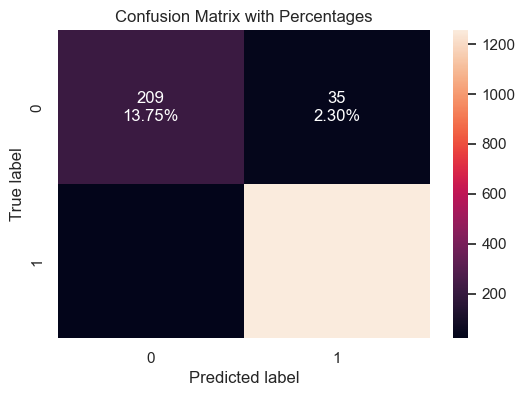

In [ ]:
# Plot Confusion Matrix
confusion_matrix_sklearn(untuned_original_data_models.get('XGBoost'), X_test, y_test)


### Confusion Matrix Insights

1. **High True Positives**: The model identified 1,255 true positives (TP) accurately. It had only 21 false negatives (FN), showing effectiveness in detecting positive cases.

2. **Low False Positives**: There were 209 true negatives (TN) and 35 false positives (FP). The low false positives indicate a good balance of sensitivity and specificity.

### Features Importance for Model Predictions

Feature Importances:
Total_Revolving_Bal: 10.40193
Total_Relationship_Count: 8.82682
Total_Trans_Amt: 8.36637
Total_Ct_Chng_Q4_Q1: 6.49329
Card_Category_Gold: 4.32659
Contacts_Count_12_mon: 3.20761
Customer_Age: 3.19179
Total_Amt_Chng_Q4_Q1: 3.11196
Months_Inactive_12_mon: 3.01570
Credit_Limit: 2.12981
Gender_F: 2.06826
Avg_Utilization_Ratio: 1.45655
Months_on_book: 1.35244
Marital_Status_Married: 1.14896
Income_Category: 1.09697
Dependent_count: 0.95014
Education_Level: 0.94862
Card_Category_Blue: 0.94258
Marital_Status_Single: 0.81558
Card_Category_Silver: 0.77944
Marital_Status_Divorced: 0.75104


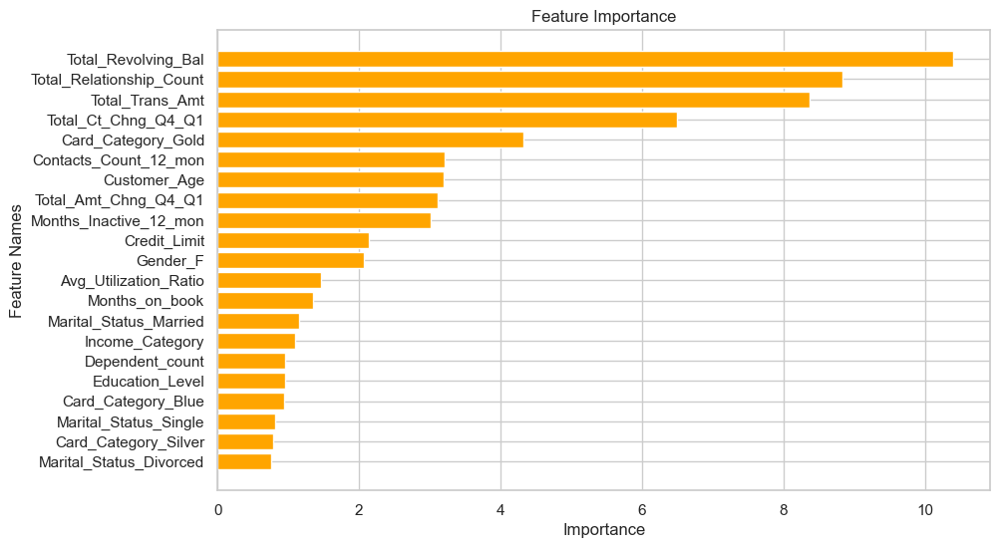

In [ ]:
def feature_importance_xgboost(model, feature_names):
    """
    Print and plot the feature importance for XGBoost.

    model: XGBoost classifier
    feature_names: list of feature names
    """
    # Get the booster from the model
    booster = model.get_booster()

    # Get feature importance using the booster, with keys being feature names
    importance_dict = booster.get_score(importance_type='gain')

    # If the keys in the importance dictionary are feature names, we don't need to map them
    sorted_importance = sorted(importance_dict.items(), key=lambda x: x[1], reverse=True)

    # Print the sorted feature importance
    print("Feature Importances:")
    for feature, score in sorted_importance:
        print(f"{feature}: {score:.5f}")

    # Plot the feature importance
    plt.figure(figsize=(10, 6))
    plt.title("Feature Importance")
    plt.barh(range(len(sorted_importance)), [x[1] for x in sorted_importance], color='orange')
    plt.yticks(range(len(sorted_importance)), [x[0] for x in sorted_importance])
    plt.xlabel("Importance")
    plt.ylabel("Feature Names")
    plt.gca().invert_yaxis()  # Highest importance at the top
    plt.show()

# Plot and print Feature Importance
feature_importance_xgboost(untuned_original_data_models.get('XGBoost'), X_test.columns)


### Feature Importance Observations

1. **Top Features:** The most important features are **Total_Revolving_Bal**, **Total_Relationship_Count**, and **Total_Trans_Amt**. These drive the model's predictions.

2. **Behavioral Impact:** Changes in transaction count and amount (**Total_Ct_Chng_Q4_Q1** and **Total_Amt_Chng_Q4_Q1**) are highly influential. They show that behavior changes matter.

3. **Demographic Role:** Demographic features like **Customer_Age** and **Gender** are less influential. The model focuses more on financial behavior.

# Business Insights and Conclusions

***

**Business Insights**

**Key Findings:**
- **Effective Attrition Prediction:** The XGBoost model achieves exceptional accuracy (96.32%) and recall (98.35%), enabling precise identification of at-risk customers.
  
**Critical Features:**
- Total Revolving Balance
- Total Relationship Count
- Total Transaction Amount
- Changes in Transaction Count and Amount (Q4 over Q1)

**Behavioral Insights:**
- Customers with high revolving balances and low relationship counts are more likely to attrite.
- Decreases in transaction count and amount indicate potential attrition risks.

**Demographic Insights:**
- Demographic features (age, gender) have limited influence on attrition prediction.
- Financial behavior is the primary driver of attrition decisions.

**Business Recommendations:**
- **Proactive Engagement:** Target customers with high revolving balances and low relationship counts with personalized offers and credit limit adjustments.
- **Behavioral Monitoring:** Track changes in transaction count and amount to identify potential attrition risks.
- **Relationship Building:** Foster strong relationships through bundled services and rewards programs.
- **Credit Limit Optimization:** Regularly review and adjust credit limits based on customer behavior.
- **Data-Driven Decision Making:** Leverage predictive analytics to inform retention strategies and enhance customer satisfaction.

**Actionable Strategies:**
- Develop targeted marketing campaigns addressing high-risk customer segments.
- Implement a credit limit review process to prevent over-extension.
- Enhance customer engagement through personalized communication.
- Monitor customer feedback to improve services.
- Continuously refine predictive models to ensure accuracy and relevance.

**Conclusion:**
Thera Bank can significantly enhance customer retention by leveraging the XGBoost model's accurate predictions and insightful feature importance. By addressing high-risk customer segments, monitoring behavioral changes, and fostering strong relationships, the bank can effectively reduce attrition, increase revenue, and strengthen its competitive position.
